# Title
## 1. [Explore Data](#Explore-data)

## 2. [RGB](#RGB-Data)
### 2.1 [Creating balanced dataset](#Creating-balanced-RGB-dataset)
### 2.2 [DataLoader : RGB](#DataLoader-:-RGB)
### 2.3 [Visualizing data](#Visualise-RGB-data)
### 2.4 [Training function](#Training-function-RGB)
### 2.5 [Vision transformer with RGB data](#Vision-transformer-with-RGB)

## 3. [LiDAR](#LIDAR-Data)
### 3.1 [Creating balanced dataset](#Creating-balanced-LIDAR-dataset)
### 3.2 [Projection function](#Projection-function)
### 3.3 [Dataloaders : LiDAR](#DataLoaders-:-LiDAR)
#### 3.3.1 [DataLoader 1 : Panaromic View with Compression](#DataLoader-1-:-Panaromic-view-with-Compression)
#### 3.3.2 [DataLoader 2 : Panaromic View without Compression](#DataLoader-2-:-Panaromic-view-without-Compression)
#### 3.3.3 [DataLoader 3 : Front View with Compression](#DataLoader-3-:-Front-view-with-Compression)
#### 3.3.4 [DataLoader 4 : Front View without Compression](#DataLoader-4-:-Front-view-without-Compression)
### 3.5 [Training function](#Training-function-LiDAR)
### 3.6 [Vision transformer with LiDAR data](#Vision-transformer-with-LiDAR-data)
#### 3.6.1 [Case 1 : Panaromic View with Compression](#Case-1-:-Panaromic-view-with-Compression)
#### 3.6.2 [Case 2 : Panaromic View with Enhancement](#Case-2-:-Panaromic-view-with-Enhancement)
#### 3.6.3 [Case 3 : Front View with Compression](#Case-3-:-Front-view-with-Compression)
#### 3.6.4 [Case 4 : Front View with Enhancement](#Case-4-:-Front-view-with-Enhancement)


## 4. [LIDAR+RGB](#LiDAR-+-RGB)
### 4.1 [Enhancer + ViT ](#Enhancer-+-ViT)
### 4.2 [Training function](#Training-function-RGB-+-LiDAR)
### 4.3 [DataLoader : RGB + LiDAR](#DataLoader-:-RGB-+-LiDAR)
## 5. [Comparison of results](#Comparison-of-results)

In [3]:
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision.models import detection
from torch.optim.lr_scheduler import StepLR
from torchsummary import summary
import os
import json
import numpy as np
from itertools import chain, islice
from PIL import Image
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import pandas as pd
import shutil
import timm
import tarfile
import re

In [1]:
!nvidia-smi

Wed Nov 29 10:31:16 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.199.02   Driver Version: 470.199.02   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  On   | 00000000:02:00.0  On |                  N/A |
| 30%   29C    P8    17W / 350W |      1MiB / 24259MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Explore data
        

In [ ]:
class Driving(Dataset):
    def __init__(self, root_dir, transforms = None):
        self.root_dir = root_dir
        self.transforms = transforms
        self.files = os.listdir(self.root_dir)
    
    def __len__(self):
        return len(self.files)
    def __getitem__(self, idx):
        image_path = os.path.join(self.root_dir, self.files[idx], "camera_front_blur")
        image_path = [image_path+'/'+ f for f in os.listdir(image_path) if os.path.splitext(f)[1]=='.jpg'].pop()
        annotation_path = os.path.join(self.root_dir, self.files[idx], "metadata.json")
        
        image = Image.open(image_path).convert("RGB")
        
        if transforms:
            image = self.transforms(image)
        
        with open(annotation_path, 'r') as json_file:
            # Load and parse the JSON data
            annotations = json.load(json_file)
        annotations = annotations['scraped_weather']
        return image, annotations

In [60]:
root_dir = r"C:\Smile\downloads\single_frames\single_frames"
Drive = Driving(root_dir)

In [105]:
df = pd.DataFrame()
for i, a in islice(Drive, 10000):
    d = pd.DataFrame([a])
    df = pd.concat([df, d])

In [106]:
df

,frame_id,time,country_code,scraped_weather,collection_car,road_type,road_condition,time_of_day,num_lane_instances,num_vehicles,num_vulnerable_vehicles,num_pedestrians,num_traffic_lights,num_traffic_signs,longitude,latitude,solar_angle_elevation
0,000000,2021-04-19T10:23:10.444124Z,PL,partly-cloudy-day,india,city,normal,day,21,36,5,40,37,35,20.993243,52.242052,49.172337
0,000001,2021-04-27T10:51:26.001497Z,PL,partly-cloudy-day,golf,city,normal,day,4,22,9,19,13,19,21.043137,52.249511,51.723833
0,000002,2021-04-18T16:04:19.891679Z,PL,cloudy,india,city,normal,day,17,3,23,27,17,47,21.030446,52.239373,13.700387
0,000003,2021-04-18T16:01:18.888716Z,PL,cloudy,india,city,normal,day,9,1,21,66,10,23,21.017903,52.237139,14.164055
0,000004,2021-04-18T16:16:17.336920Z,PL,cloudy,india,city,normal,day,17,42,7,32,20,64,21.005466,52.228612,11.891281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,009995,2020-05-11T10:45:25.109213Z,DE,rain,delta,city,normal,day,0,26,1,7,18,40,11.575411,48.110257,59.642816
0,009996,2020-11-20T07:11:43.001344Z,DE,partly-cloudy-night,india,city,normal,day,16,14,10,1,34,43,6.959742,50.950969,1.322253
0,009997,2021-10-11T07:11:54.221201Z,HU,partly-cloudy-day,golf,city,normal,day,10,24,0,5,20,24,19.093346,47.480770,19.925966
0,009998,2020-05-28T13:30:39.661044Z,SE,partly-cloudy-day,india,city,normal,day,0,16,4,2,3,17,13.015193,55.601249,46.789482


In [107]:
df.describe(include = 'all')

,frame_id,time,country_code,scraped_weather,collection_car,road_type,road_condition,time_of_day,num_lane_instances,num_vehicles,num_vulnerable_vehicles,num_pedestrians,num_traffic_lights,num_traffic_signs,longitude,latitude,solar_angle_elevation
count,10000,10000,10000,10000,10000,10000,10000,10000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
unique,10000,10000,6,9,5,5,3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,000000,2021-04-19T10:23:10.444124Z,PL,partly-cloudy-day,india,city,normal,day,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,1,5346,3078,5664,9839,7721,8650,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.141300,17.559000,3.834200,6.776100,8.395400,22.469300,16.028521,51.288857,26.474693
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.231516,11.210106,5.246967,7.561778,9.043408,13.132696,5.865447,3.302756,21.148548
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.842455,41.797261,-54.011428
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,9.000000,0.000000,2.000000,0.000000,13.000000,8.692661,50.107743,14.991257
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.000000,16.000000,2.000000,5.000000,6.000000,20.000000,19.919623,52.208185,30.226686
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.000000,24.000000,5.000000,9.000000,13.250000,29.000000,20.998973,52.242065,44.212725


In [108]:
df['scraped_weather'].unique()

array(['partly-cloudy-day', 'cloudy', 'clear-day', 'rain', 'clear-night',
       'snow', 'partly-cloudy-night', 'wind', 'fog'], dtype=object)

# RGB Data

## Creating balanced RGB dataset

In [90]:
class Weather(Dataset):
    def __init__(self, root_dir, transforms = None):
        self.root_dir = root_dir
        #self.transforms = transforms.Compose([transforms.ToTensor()])
        self.transforms = transforms
        self.files = os.listdir(self.root_dir)
    
    def __len__(self):
        return len(self.files)
    def __getitem__(self, idx):
        #image_path = os.path.join(self.root_dir, self.files[idx], "camera_front_blur")
        #image_path = [image_path+'/'+ f for f in os.listdir(image_path) if os.path.splitext(f)[1]=='.jpg'].pop()
        annotation_path = os.path.join(self.root_dir, self.files[idx], "metadata.json")
       
        
        with open(annotation_path, 'r') as json_file:
            # Load and parse the JSON data
            annotations = json.load(json_file) 
        
        
        return annotations['scraped_weather'], os.path.join(self.root_dir, self.files[idx])
    
dst = "C:\Smile\downloads\single_frames\single_frames_balanced"
for label, folder in weather_data:
    label = maps[label]
    if labels[label]<2000:
        shutil.copytree(folder, os.path.join(dst, folder[-6:])) 
        labels[label]+=1
    if all(v>=2000 for v in labels.values()):
        break
    
        

In [170]:
weather_data = Weather(dst)

In [268]:
weather_data[0]

('partly-cloudy-day',
 'C:\\Smile\\downloads\\single_frames\\single_frames_balanced\\000000')

In [172]:
for label, folder in weather_data:
    if label == 'wind':
        print(folder)
        
        break

C:\Smile\downloads\single_frames\single_frames_balanced\001985


In [165]:
maps = {'partly-cloudy-night':'cloudy', 'partly-cloudy-day':'cloudy', 'cloudy':'cloudy', 'snow':'snow', 'rain':'rain',
       'clear-night':'clear', 'clear-day':'clear', 'fog':'fog', 'wind':'wind'}
labels = {'cloudy':0, 'clear':0, 'snow':0, 'rain':0, 'fog':0, 'wind':0}


In [167]:
labels

{'cloudy': 59268,
 'clear': 20440,
 'snow': 1972,
 'rain': 15716,
 'fog': 2117,
 'wind': 487}

0 <PIL.Image.Image image mode=RGB size=3848x2168 at 0x19D52A7FF40>
1 <PIL.Image.Image image mode=RGB size=3848x2168 at 0x19D51137520>


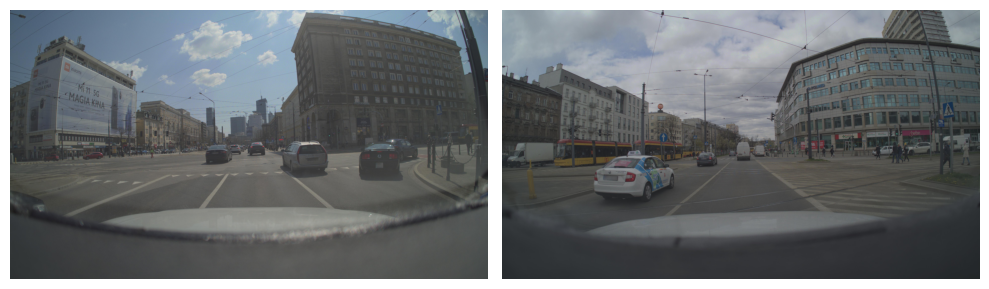

In [78]:
display_sample([Drive[0][0], Drive[1][0]])

In [121]:
maps = {'partly-cloudy-night':'cloudy', 'partly-cloudy-day':'cloudy', 'cloudy':'cloudy', 'snow':'snow', 'rain':'rain',
       'clear-night':'clear', 'clear-day':'clear', 'fog':'fog', 'wind':'wind'}

def delete_label(root_dir, label):
    for folder in os.listdir(root_dir):
        folder_path = os.path.join(root_dir, folder)
        annotation_path = os.path.join(folder_path, "metadata.json")
        with open(annotation_path, 'r') as json_file:
                # Load and parse the JSON data
                annotations = json.load(json_file)
                annotations = annotations['scraped_weather']
                annotations = maps[annotations]

        if annotations == label:
            print(f"Moving folder: {folder} with label {annotations}")
            shutil.move(folder_path, "single_frames_rgb/downloads/single_frames_deleted")
    
rgb_dir = "single_frames_balanced"
delete_label(rgb_dir, 'wind')
     

Moving folder: 001985 with label wind
Moving folder: 002113 with label wind
Moving folder: 002209 with label wind
Moving folder: 002907 with label wind
Moving folder: 002910 with label wind
Moving folder: 003017 with label wind
Moving folder: 003588 with label wind
Moving folder: 003679 with label wind
Moving folder: 003873 with label wind
Moving folder: 004036 with label wind
Moving folder: 004151 with label wind
Moving folder: 004892 with label wind
Moving folder: 005283 with label wind
Moving folder: 005332 with label wind
Moving folder: 005849 with label wind
Moving folder: 006328 with label wind
Moving folder: 006369 with label wind
Moving folder: 006913 with label wind
Moving folder: 007027 with label wind
Moving folder: 007280 with label wind
Moving folder: 007854 with label wind
Moving folder: 007997 with label wind
Moving folder: 008094 with label wind
Moving folder: 008413 with label wind
Moving folder: 008735 with label wind
Moving folder: 009496 with label wind
Moving folde

Moving folder: 069103 with label wind
Moving folder: 069311 with label wind
Moving folder: 069453 with label wind
Moving folder: 069496 with label wind
Moving folder: 069514 with label wind
Moving folder: 069532 with label wind
Moving folder: 069697 with label wind
Moving folder: 070050 with label wind
Moving folder: 070146 with label wind
Moving folder: 070184 with label wind
Moving folder: 070210 with label wind
Moving folder: 070391 with label wind
Moving folder: 070773 with label wind
Moving folder: 070799 with label wind
Moving folder: 070958 with label wind
Moving folder: 071248 with label wind
Moving folder: 071506 with label wind
Moving folder: 071692 with label wind
Moving folder: 071760 with label wind
Moving folder: 071762 with label wind
Moving folder: 072049 with label wind
Moving folder: 072099 with label wind
Moving folder: 072143 with label wind
Moving folder: 072193 with label wind
Moving folder: 072283 with label wind
Moving folder: 072414 with label wind
Moving folde

Moving folder: 095033 with label wind
Moving folder: 095091 with label wind
Moving folder: 095200 with label wind
Moving folder: 095235 with label wind
Moving folder: 095242 with label wind
Moving folder: 095290 with label wind
Moving folder: 095307 with label wind
Moving folder: 095522 with label wind
Moving folder: 095552 with label wind
Moving folder: 095965 with label wind
Moving folder: 096093 with label wind
Moving folder: 096157 with label wind
Moving folder: 096262 with label wind
Moving folder: 096402 with label wind
Moving folder: 096514 with label wind
Moving folder: 096576 with label wind
Moving folder: 096590 with label wind
Moving folder: 096672 with label wind
Moving folder: 096827 with label wind
Moving folder: 096913 with label wind
Moving folder: 097003 with label wind
Moving folder: 097048 with label wind
Moving folder: 097103 with label wind
Moving folder: 097287 with label wind
Moving folder: 097358 with label wind
Moving folder: 097439 with label wind
Moving folde

## DataLoader : RGB

In [138]:
dst = "single_frames_balanced"
classes = {'cloudy':0, 'clear':1, 'snow':2, 'rain':3, 'fog':4}
classes_reverse = {value:key for key, value in classes.items()}
maps = {'partly-cloudy-night':'cloudy', 'partly-cloudy-day':'cloudy', 'cloudy':'cloudy', 'snow':'snow', 'rain':'rain',
       'clear-night':'clear', 'clear-day':'clear', 'fog':'fog', 'wind':'wind'}
labels = {'cloudy':0, 'clear':0, 'snow':0, 'rain':0, 'fog':0}
class Driving(Dataset):
    def __init__(self, root_dir, transforms = transforms_rgb):
        self.root_dir = root_dir
        self.transforms = transforms
        self.files = os.listdir(self.root_dir)

    def __len__(self):
        return len(self.files)
    def __getitem__(self, idx):
        image_path = os.path.join(self.root_dir, self.files[idx], "camera_front_blur")
        image_path = [image_path+'/'+ f for f in os.listdir(image_path) if os.path.splitext(f)[1]=='.jpg'].pop()
        annotation_path = os.path.join(self.root_dir, self.files[idx], "metadata.json")
        
        image = Image.open(image_path).convert("RGB")
        
        if self.transforms:
            image = self.transforms(image)
        
        with open(annotation_path, 'r') as json_file:
            # Load and parse the JSON data
            annotations = json.load(json_file)
        annotations = annotations['scraped_weather']
        annotations = maps[annotations]
        annotations = classes[annotations]
        annotations = torch.tensor(annotations, dtype=torch.int64)
        #annotations = nn.functional.one_hot(annotations.to(torch.int64), num_classes = 6)
        return image, annotations
driving_dataset = Driving(dst)
train_dataset, test_dataset = random_split(driving_dataset, [0.8, 0.2])
train_dataset, val_dataset = random_split(train_dataset, [0.7, 0.3])
train_loader = DataLoader(train_dataset, batch_size = 1, shuffle = True)
test_loader = DataLoader(test_dataset, batch_size = 1, shuffle = True)
val_loader = DataLoader(val_dataset, batch_size = 1, shuffle = True)

In [127]:
next(iter(test_loader))
    
    

[tensor([[[[-0.3255, -0.3333, -0.3412,  ..., -0.3255, -0.3333, -0.3333],
           [-0.3255, -0.3255, -0.3255,  ..., -0.3255, -0.3333, -0.3333],
           [-0.3255, -0.3255, -0.3255,  ..., -0.3333, -0.3333, -0.3176],
           ...,
           [-0.8510, -0.8431, -0.8275,  ..., -0.8353, -0.8353, -0.8275],
           [-0.8353, -0.8431, -0.8431,  ..., -0.8431, -0.8353, -0.8353],
           [-0.8353, -0.8431, -0.8431,  ..., -0.8510, -0.8431, -0.8353]],
 
          [[-0.0980, -0.0980, -0.0902,  ..., -0.0980, -0.1059, -0.1059],
           [-0.0980, -0.0980, -0.0980,  ..., -0.0980, -0.1059, -0.1059],
           [-0.0980, -0.0980, -0.0980,  ..., -0.1059, -0.1059, -0.0980],
           ...,
           [-0.7647, -0.7569, -0.7647,  ..., -0.7647, -0.7725, -0.7647],
           [-0.7647, -0.7725, -0.7647,  ..., -0.7725, -0.7725, -0.7725],
           [-0.7725, -0.7725, -0.7569,  ..., -0.7647, -0.7569, -0.7725]],
 
          [[ 0.3412,  0.3412,  0.3333,  ...,  0.3412,  0.3333,  0.3333],
           [ 

In [267]:
labels

{'cloudy': 2000,
 'clear': 2000,
 'snow': 1972,
 'rain': 2000,
 'fog': 2000,
 'wind': 487}

In [214]:
image, label = next(iter(train_loader))

In [226]:
int(label[0].argmax())

2

## Visualise RGB data

In [4]:
def display_sample(images, labels, max_render=5):
    images = images[:max_render] if len(images) > max_render else images
    fig, axs = plt.subplots(1, len(images), figsize = (5*len(images),5))
    
    for i, (ax, image, label) in enumerate(zip(axs, images, labels)):
        ax.axis('off')
        print('label: ', classes_reverse[int(label.argmax())])
        ax.imshow(image.permute(1, 2, 0).numpy())
        #ax.imshow(image)
        
    plt.tight_layout()

    plt.show()

label:  clear
label:  clear
label:  fog
label:  rain
label:  cloudy


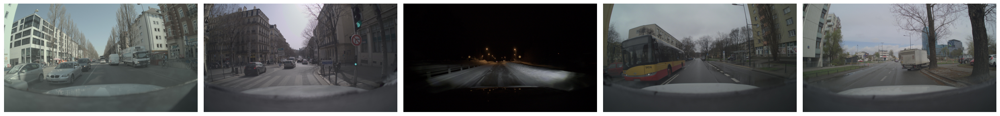

In [234]:
display_sample(*next(iter(train_loader)))

In [1]:
display_sample(*next(iter(train_loader)))

NameError: name 'display_sample' is not defined

label:  fog
label:  rain
label:  fog
label:  rain
label:  fog


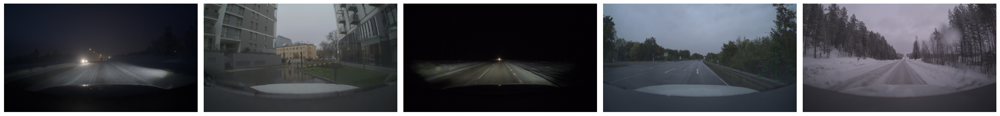

In [236]:
display_sample(*next(iter(train_loader)))

label:  cloudy
label:  clear
label:  clear
label:  fog
label:  fog


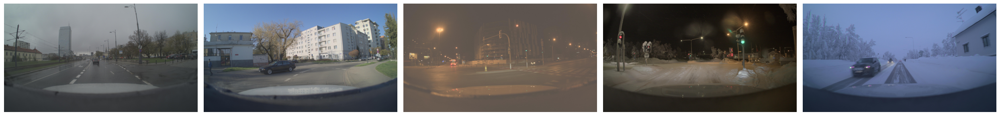

In [237]:
display_sample(*next(iter(train_loader)))

In [27]:
classes

{'cloudy': 0, 'clear': 1, 'snow': 2, 'rain': 3, 'fog': 4, 'wind': 5}

## Training function RGB

In [135]:
classes = {'cloudy':0, 'clear':1, 'snow':2, 'rain':3, 'fog':4}
def val_model(model, criterion, val_loader):
    model.to(device)
    model.eval()
    acc_value = []
    
        
    metrics_sum = {}    
        
    with torch.no_grad():    
        for idx, (images, labels) in enumerate(val_loader):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            metrics = {'val_loss': loss.item(), 
                'val_acc': (outputs.argmax() == labels).cpu().numpy().mean()*100}
            
            
            for k, v in metrics.items():
                metrics_sum.update({k:metrics_sum.get(k,[]) + [v]})
        avg_in_epoch = {k: sum(v)/(len(v)) for k,v in metrics_sum.items()}
                
    return avg_in_epoch
    

def train_model(model, criterion, epochs, optimizer, train_loader, val_loader, batch_size, max_grad_norm = 3.0):
    model.to(device)
    
    plot_values = {'train_acc':[], 'train_loss':[], 'val_acc':[], 'val_loss':[]}
    for epoch in range(epochs):
        model.train()
        metrics_sum = {}
        
        
        
        for idx, (images, labels) in enumerate(train_loader):
            
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            #print(loss)
            loss.backward()
            metrics = {
                'train_loss': loss.item(), 
                'train_acc': (outputs.argmax() == labels).cpu().numpy().mean()*100}
            nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
            optimizer.step()

            for k, v in metrics.items():
                metrics_sum.update({k:metrics_sum.get(k,[]) + [v]})

            print(f'\r[Epoch: {epoch+1:4d}][{1+idx:4d}/{len(train_loader)/batch_size}]',
              *[f'{k}: {v:.4f},' for k,v in metrics.items()],
              end='\r')
            

        
        print(f'\r[Epoch: {epoch+1:4d}]',
              *[f'{k}: {sum(v)/(len(v)):.4f}' for k,v in metrics_sum.items()],
              ' '*20
             )
        avg_in_epoch = {k: sum(v)/(len(v)) for k,v in metrics_sum.items()}
        avg_in_epoch.update(val_model(model, criterion, val_loader))
        
        for k, v in avg_in_epoch.items():
            plot_values[k].append(v)
        
        
    
    update_live_plot([*range(epochs)], **plot_values);
    
        
def update_live_plot(epochs, **values):
    
    f, ax1 = plt.subplots(nrows = 2, ncols = 1, figsize = (18, 20), sharey=False);
    h1, = ax1[0].plot(epochs, values['train_loss'], 'b-', marker = '.', label = 'Train Loss')
    h2, = ax1[1].plot(epochs, values['val_loss'], 'b-', marker = '.', label = 'Val Loss')
    ax1[0].set_xlabel('Epoch')
    ax1[0].set_ylabel('Train Loss')
    #ax1.set_title('Train vs Val Loss')
    ax1[0].tick_params('y', colors='b')
    
    ax1[1].set_xlabel('Epoch')
    ax1[1].set_ylabel('Val Loss')
    #ax1.set_title('Train vs Val Loss')
    ax1[1].tick_params('y', colors='b')
    
    ax2 = ax1[0].twinx()
    ax3 = ax1[1].twinx()
    h3, = ax2.plot(epochs, values['train_acc'], 'r-',marker = '.', label = 'Train Accuracy')
    h4, = ax3.plot(epochs, values['val_acc'], 'r-',marker = '.', label = 'Val Accuracy')
    ax2.set_ylabel('Accuracy')
    ax2.tick_params('y', colors='r')
    
    ax3.set_ylabel('Accuracy')
    ax3.tick_params('y', colors='r')
    
    ax1[0].legend(handles=[h1,h3], bbox_to_anchor=(1.15, 1))
    ax1[1].legend(handles=[h2,h4], bbox_to_anchor=(1.15, 1))

    plt.subplots_adjust(right=0.85)
    plt.savefig('output_figure.png')
    plt.show();        
def test_model(model, test_loader):
    correct = 0
    total = 0
    all_labels = []
    all_preds = []
    model.to(device)
    model.eval() 
    with torch.no_grad():
        for images,  labels in test_loader:
            images, labels = images.to(device),  labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total+=labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())
    accuracy = 100 * correct / total
    print(f'Accuracy on the test dataset: {accuracy}%')
    
    return all_preds, all_labels

def print_confusion_matrix(all_labels, all_preds):
    cf = confusion_matrix(all_labels, all_preds)
    print(cf)
    cm_display = ConfusionMatrixDisplay.from_predictions(all_labels, all_preds, 
                                                         display_labels = list(classes.keys()), normalize='all', cmap = 'Blues')
    plt.show()

    '''
    plt.figure(figsize=(8, 6))
    plt.imshow(cf, interpolation="nearest", cmap=plt.get_cmap("Blues"))
    plt.title("Confusion Matrix")
    plt.colorbar()
    tick_marks = list(classes.keys())
    plt.xticks([i for i in range(6)], tick_marks)
    plt.yticks([i for i in range(6)], tick_marks)
    plt.tight_layout()
    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.show()
    '''


In [19]:
timm.list_models('vit*', pretrained=True)

['vit_base_patch8_224.augreg2_in21k_ft_in1k',
 'vit_base_patch8_224.augreg_in21k',
 'vit_base_patch8_224.augreg_in21k_ft_in1k',
 'vit_base_patch8_224.dino',
 'vit_base_patch14_dinov2.lvd142m',
 'vit_base_patch16_224.augreg2_in21k_ft_in1k',
 'vit_base_patch16_224.augreg_in1k',
 'vit_base_patch16_224.augreg_in21k',
 'vit_base_patch16_224.augreg_in21k_ft_in1k',
 'vit_base_patch16_224.dino',
 'vit_base_patch16_224.mae',
 'vit_base_patch16_224.orig_in21k_ft_in1k',
 'vit_base_patch16_224.sam_in1k',
 'vit_base_patch16_224_miil.in21k',
 'vit_base_patch16_224_miil.in21k_ft_in1k',
 'vit_base_patch16_384.augreg_in1k',
 'vit_base_patch16_384.augreg_in21k_ft_in1k',
 'vit_base_patch16_384.orig_in21k_ft_in1k',
 'vit_base_patch16_clip_224.datacompxl',
 'vit_base_patch16_clip_224.laion2b',
 'vit_base_patch16_clip_224.laion2b_ft_in1k',
 'vit_base_patch16_clip_224.laion2b_ft_in12k',
 'vit_base_patch16_clip_224.laion2b_ft_in12k_in1k',
 'vit_base_patch16_clip_224.openai',
 'vit_base_patch16_clip_224.openai

In [92]:

def display_test_samples(model, images, labels, max_render=5):
    images = images[:max_render] if len(images) > max_render else images
    fig, axs = plt.subplots(1, len(images), figsize = (5*len(images),5))
    
    for i, (ax, image, label) in enumerate(zip(axs, images, labels)):
        ax.axis('off')
        
        prediction = model(image)
        prediction = prediction.argmax()
        print('predicted label: ', classes_reverse[int(prediction)], end = '')
        print('\ttrue label: ', classes_reverse[int(label[0])])
        image = image*data_config['std'][0]+data_config['mean'][0]
        ax.imshow(image[0].permute(1, 2, 0).numpy())
        #ax.imshow(image)
        
    plt.tight_layout()

    plt.show()

predicted label:  rain	true label:  rain
predicted label:  rain	true label:  clear
predicted label:  clear	true label:  clear


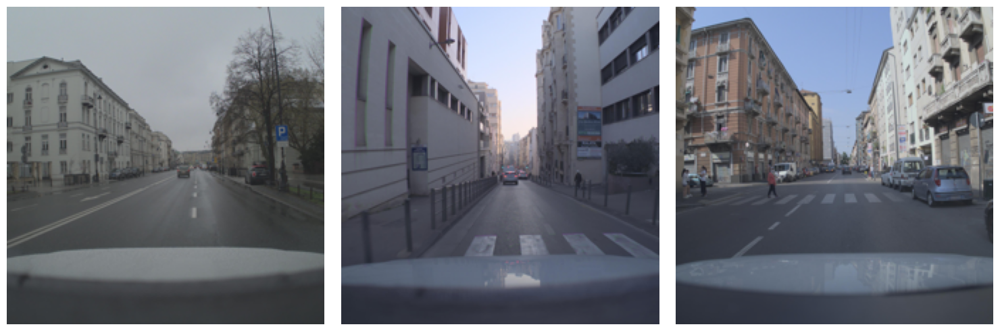

In [93]:
display_test_samples(vision_transformer2, img, lab, max_render=5)

## Vision transformer with RGB

#### Training done for 50 epochs
#### Optimizer - Adagrad with lr = 0.009
#### Training accuracy - 93.85
#### Test accuracy - 81.14

In [136]:
torch.cuda.empty_cache()
vision_transformer = timm.create_model('vit_large_r50_s32_224', pretrained=True, num_classes = 5, in_chans = 3)
vision_transformer = vision_transformer.to(device)
data_config = timm.data.resolve_model_data_config(vision_transformer)
transforms_rgb = timm.data.create_transform(**data_config, is_training=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss().to(device)
optimizer = torch.optim.Adagrad(vision_transformer.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 1.9189 train_acc: 19.7851                     
[Epoch:    2] train_loss: 1.6344 train_acc: 19.0152                     
[Epoch:    3] train_loss: 1.6224 train_acc: 18.9257                     
[Epoch:    4] train_loss: 1.6187 train_acc: 20.9669                     
[Epoch:    5] train_loss: 1.4963 train_acc: 30.7073                     
[Epoch:    6] train_loss: 1.3483 train_acc: 50.3671                     
[Epoch:    7] train_loss: 1.3080 train_acc: 60.6088                     
[Epoch:    8] train_loss: 1.2286 train_acc: 64.7986                     
[Epoch:    9] train_loss: 1.1665 train_acc: 67.3053                     
[Epoch:   10] train_loss: 1.1219 train_acc: 68.7914                     
[Epoch:   11] train_loss: 1.0527 train_acc: 70.8326                     
[Epoch:   12] train_loss: 0.9861 train_acc: 72.4082                     
[Epoch:   13] train_loss: 0.9755 train_acc: 73.3751                     
[Epoch:   14] train_loss: 0.9289 train_acc: 74.1271

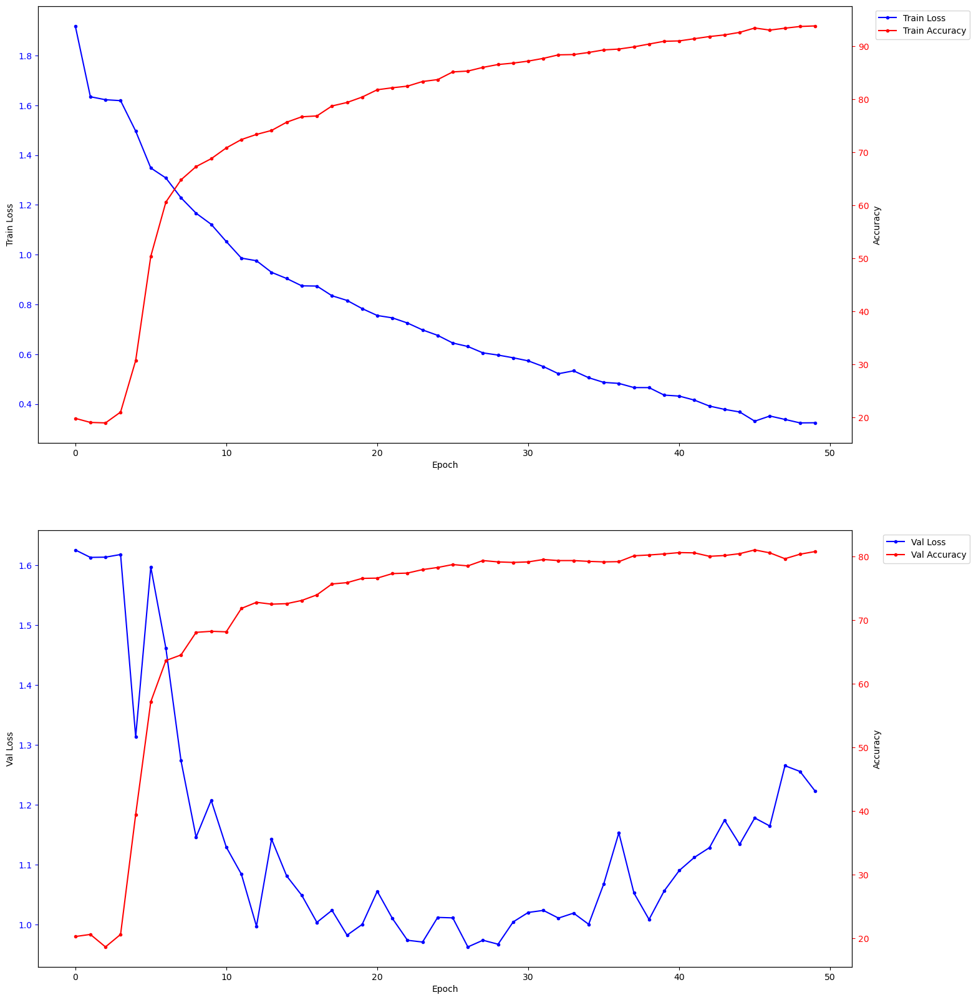

In [139]:
train_model(vision_transformer, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

In [140]:
torch.save(vision_transformer.state_dict(), 'rgb.pth')

Accuracy on the test dataset: 81.14343029087262%
[[326  50   3  30   4]
 [ 38 341   3  10   4]
 [  7   2 300  45  53]
 [ 20   7  47 296   9]
 [  1   1  37   5 355]]


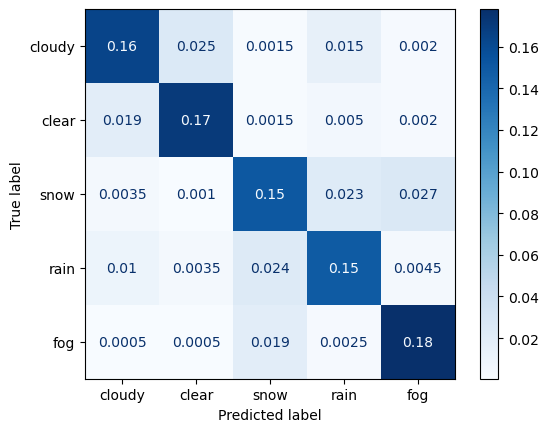

In [141]:
all_preds, all_labels = test_model(vision_transformer, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [142]:
del vision_transformer

In [30]:
def create_cf(arr, title):
    row_sums = confusion_matrix_values.sum(axis=1, keepdims=True)
    confusion_matrix_percentages = confusion_matrix_values / row_sums.astype(float) * 100

    # Create a figure and axis
    plt.figure(figsize=(8, 6))  # Adjust the figure size as needed
    plt.imshow(confusion_matrix_percentages, cmap='Blues', interpolation='nearest')

    # Add colorbar
    plt.colorbar()

    # Show all ticks and label them with their respective list entries
    labels = ['cloudy', 'clear', 'snow', 'rain', 'fog']
    ticks = np.arange(len(labels))
    plt.xticks(ticks, labels)
    plt.yticks(ticks, labels)

    # Set labels
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')

    # Display values in cells as percentages
    for i in range(len(confusion_matrix_percentages)):
        for j in range(len(confusion_matrix_percentages[i])):
            text_color = 'white' if i == j else 'black'
            plt.text(j, i, f'{confusion_matrix_percentages[i, j]:.2f}%',
                     ha='center', va='center', color=text_color)

    plt.title(title)
    plt.show()

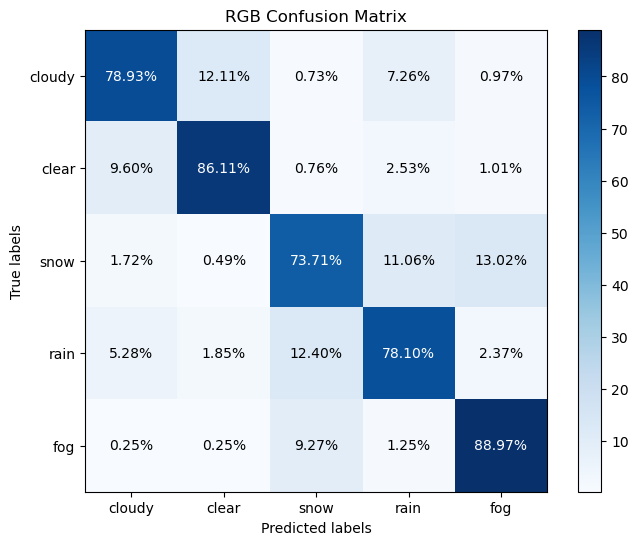

In [27]:
confusion_matrix_values = np.array([
 [326,  50,   3,  30,   4],
 [ 38, 341,   3,  10,   4],
 [  7,   2, 300,  45,  53],
 [ 20,   7,  47, 296,   9],
 [  1,   1,  37,   5, 355]
])
row_sums = confusion_matrix_values.sum(axis=1, keepdims=True)
confusion_matrix_percentages = confusion_matrix_values / row_sums.astype(float) * 100

# Create a figure and axis
plt.figure(figsize=(8, 6))  # Adjust the figure size as needed
plt.imshow(confusion_matrix_percentages, cmap='Blues', interpolation='nearest')

# Add colorbar
plt.colorbar()

# Show all ticks and label them with their respective list entries
labels = ['cloudy', 'clear', 'snow', 'rain', 'fog']
ticks = np.arange(len(labels))
plt.xticks(ticks, labels)
plt.yticks(ticks, labels)

# Set labels
plt.xlabel('Predicted labels')
plt.ylabel('True labels')

# Display values in cells as percentages
for i in range(len(confusion_matrix_percentages)):
    for j in range(len(confusion_matrix_percentages[i])):
        text_color = 'white' if i == j else 'black'
        plt.text(j, i, f'{confusion_matrix_percentages[i, j]:.2f}%',
                 ha='center', va='center', color=text_color)

plt.title('RGB Confusion Matrix')
plt.show()

#  LIDAR Data

## Creating balanced LIDAR dataset

In [ ]:
#This creates a new dataset with balanced classes

labels = {'cloudy':0, 'clear':0, 'snow':0, 'rain':0, 'fog':0, 'wind':0}
maps = {'partly-cloudy-night':'cloudy', 'partly-cloudy-day':'cloudy', 'cloudy':'cloudy', 'snow':'snow', 'rain':'rain',
       'clear-night':'clear', 'clear-day':'clear', 'fog':'fog', 'wind':'wind'}
class Weather(Dataset):
    def __init__(self, root_dir, transforms = None):
        self.root_dir = root_dir
        #self.transforms = transforms.Compose([transforms.ToTensor()])
        self.transforms = transforms
        self.files = os.listdir(self.root_dir)
    
    def __len__(self):
        return len(self.files)
    def __getitem__(self, idx):
        #image_path = os.path.join(self.root_dir, self.files[idx], "camera_front_blur")
        #image_path = [image_path+'/'+ f for f in os.listdir(image_path) if os.path.splitext(f)[1]=='.jpg'].pop()
        annotation_path = os.path.join(self.root_dir, self.files[idx], "metadata.json")
       
        
        with open(annotation_path, 'r') as json_file:
            # Load and parse the JSON data
            annotations = json.load(json_file) 
        
        
        return annotations['scraped_weather'], os.path.join(self.root_dir, self.files[idx])

root_dir = "single_frames_lidar/downloads/single_frames"
dst = "single_frames_lidar/downloads/single_frames_balanced"
lidar_data = Weather(root_dir)    
for label, folder in lidar_data:
    label = maps[label]
    if labels[label]<2000:
        shutil.copytree(folder, os.path.join(dst, folder[-6:])) 
        labels[label]+=1
    if all(v>=2000 for v in labels.values()):
        break
    

In [23]:
proj = project(unpack)

In [24]:
proj.shape

(224, 224, 6)

In [3]:
(0.5 - (1/6))*2048 #682, 1066

682.6666666666667

## Projection function

In [4]:
def project(points, vertical_fov:tuple=(-25.0, 15.0), out_shape:tuple=(128, 2048), return_xyr:bool=False):
    # unpack params to short names
    P = points.copy()
    fov_up, fov_down = vertical_fov
    height, width = out_shape
    x, y, z = P[:,0], P[:,1], P[:,2]

    # Compute spherical coordinates
    r = np.linalg.norm(P[:,:3], 2, axis=1)
    yaw = -np.arctan2(y, x)
    pitch = np.arcsin(z / r)
    
    # Parameters of the LiDAR
    fov_up = fov_up / 180.0 * np.pi  # field of view up in rad
    fov_down = fov_down / 180.0 * np.pi  # field of view down in rad
    fov = abs(fov_down) + abs(fov_up)  # field of view total in rad

    # get projections in image coords
    clamp = lambda x,m: np.maximum(0, np.minimum(np.round(x),m)).astype(np.int32)
    
    proj_x = 0.5 * (yaw / np.pi + 1.0)  # in the set [0.0, 1.0]
    proj_x *= width  # in [0.0, W]
    proj_x = clamp(proj_x, width-1) # in [0,W-1]
    
    proj_y = 1.0 - (pitch + abs(fov_down)) / fov  # in the set [0.0, 1.0]
    proj_y *= height  # in [0.0, H]
    proj_y = clamp(proj_y, height-1)  # in [0,H-1]

    # order in decreasing depth
    if return_xyr:
        p_x, p_y, p_r = proj_x.copy(), proj_y.copy(), r.copy()
    rev_indices = np.arange(r.shape[0])
    indices = np.argsort(r)[::-1]
    P, proj_y, proj_x = P[indices], proj_y[indices], proj_x[indices]
    r, rev_indices = r[indices], rev_indices[indices]
    
    # build projected image data
    proj = np.full((height, width, 5), -1, dtype=np.float32)
    proj[proj_y, proj_x, 0] = P[:,3] #intensity
    proj[proj_y, proj_x, 1] = r #range
    proj[proj_y, proj_x, 2:5] = P[:,0:3] #x, y, z
    #proj[proj_y, proj_x, 5] = rev_indices # maps from point cloud to projection (not the other way!) 
    if return_xyr:
        ret = (proj, p_x, p_y, p_r)
        assert len(ret) == 4 # because pytorch messing with how things are packed
        return ret
    return proj

## DataLoaders : LiDAR

### DataLoader 1 : Panaromic view with Compression

In [37]:
dst = "single_frames_lidar/downloads/single_frames_balanced"
classes = {'cloudy':0, 'clear':1, 'snow':2, 'rain':3, 'fog':4, 'wind':5}
classes_reverse = {value:key for key, value in classes.items()}
maps = {'partly-cloudy-night':'cloudy', 'partly-cloudy-day':'cloudy', 'cloudy':'cloudy', 'snow':'snow', 'rain':'rain',
       'clear-night':'clear', 'clear-day':'clear', 'fog':'fog', 'wind':'wind'}
labels = {'cloudy':0, 'clear':0, 'snow':0, 'rain':0, 'fog':0, 'wind':0}


class Balanced_Driving(Dataset):
    def __init__(self, root_dir, transforms_lidar = transforms.Compose([transforms.Resize(size=(224, 224), interpolation=transforms.InterpolationMode.BICUBIC, max_size=None, antialias=True)])):
        self.root_dir = root_dir
        self.folders = os.listdir(self.root_dir)
        self.folders = [f for f in self.folders if os.path.exists(os.path.join(self.root_dir, f, "lidar_velodyne"))]
        self.transforms_lidar = transforms_lidar
        self.projections = [self.__returnitem__(i) for i in range(len(self.folders))]
        self.flip = transforms.RandomHorizontalFlip()
        
    def __len__(self):
        return len(self.folders)
    def __returnitem__(self, idx):
        print(f"Loading {idx} of {len(self)}", end = "\r")
        lidar_path = os.path.join(self.root_dir, self.folders[idx], "lidar_velodyne")
        #lidar_path = [image_path+'/'+ f for f in os.listdir(image_path) if os.path.splitext(f)[1]=='.jpg'].pop()
        annotation_path = os.path.join(self.root_dir, self.folders[idx], "metadata.json")

        for file in os.listdir(lidar_path):
            lidar_file = np.load(os.path.join(lidar_path, file))

        lidar_file = np.array([*chain(*lidar_file)]).reshape(len(lidar_file), len(lidar_file[0]))[:, 1:5]
        
        lidar_file = torch.tensor(project(lidar_file)).permute(2, 0, 1)
        mean = lidar_file.mean(dim=0, keepdim=True)
        std = lidar_file.std(dim=0, keepdim=True)
        norm_lidar_file = (lidar_file-mean)/(std + 0.0001)
        
        if self.transforms_lidar:
            norm_lidar_file = self.transforms_lidar(norm_lidar_file)
        
        
        with open(annotation_path, 'r') as json_file:
            # Load and parse the JSON data
            annotations = json.load(json_file)
        annotations = annotations['scraped_weather']
        annotations = maps[annotations]
        annotations = classes[annotations]
        annotations = torch.tensor(annotations, dtype=torch.int64)
        #annotations = nn.functional.one_hot(annotations.to(torch.int64), num_classes = 6)
        return norm_lidar_file, annotations
    
    def __getitem__(self, idx):
        norm_lidar_file, annotations = self.projections[idx]
        norm_lidar_file = self.flip(norm_lidar_file)
        return self.projections[idx]
    
        
driving_dataset = Balanced_Driving(dst)
train_dataset, test_dataset = random_split(driving_dataset, [0.8, 0.2])
train_dataset, val_dataset = random_split(train_dataset, [0.7, 0.3])
train_loader = DataLoader(train_dataset, batch_size = 1, shuffle = True)
test_loader = DataLoader(test_dataset, batch_size = 1, shuffle = True)
val_loader = DataLoader(val_dataset, batch_size = 1, shuffle = True)

### DataLoader 2 : Panaromic view without Compression

In [79]:
dst = "single_frames_lidar/downloads/single_frames_balanced"
classes = {'cloudy':0, 'clear':1, 'snow':2, 'rain':3, 'fog':4}
classes_reverse = {value:key for key, value in classes.items()}
maps = {'partly-cloudy-night':'cloudy', 'partly-cloudy-day':'cloudy', 'cloudy':'cloudy', 'snow':'snow', 'rain':'rain',
       'clear-night':'clear', 'clear-day':'clear', 'fog':'fog'}
labels = {'cloudy':0, 'clear':0, 'snow':0, 'rain':0, 'fog':0}


class Balanced_Driving(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.folders = os.listdir(self.root_dir)
        self.folders = [f for f in self.folders if os.path.exists(os.path.join(self.root_dir, f, "lidar_velodyne"))]
        self.projections = [self.__returnitem__(i) for i in range(len(self.folders))]
        self.flip = transforms.RandomHorizontalFlip()
        
    def __len__(self):
        return len(self.folders)
    def __returnitem__(self, idx):
        print(f"Loading {idx} of {len(self)-1}", end = "\r")
        lidar_path = os.path.join(self.root_dir, self.folders[idx], "lidar_velodyne")
        #lidar_path = [image_path+'/'+ f for f in os.listdir(image_path) if os.path.splitext(f)[1]=='.jpg'].pop()
        annotation_path = os.path.join(self.root_dir, self.folders[idx], "metadata.json")

        for file in os.listdir(lidar_path):
            lidar_file = np.load(os.path.join(lidar_path, file))

        lidar_file = np.array([*chain(*lidar_file)]).reshape(len(lidar_file), len(lidar_file[0]))[:, 1:5]
        
        lidar_file = torch.tensor(project(lidar_file)).permute(2, 0, 1)
        mean = lidar_file.mean(dim=0, keepdim=True)
        std = lidar_file.std(dim=0, keepdim=True)
        norm_lidar_file = (lidar_file-mean)/(std + 0.0001)
        
        
        with open(annotation_path, 'r') as json_file:
            # Load and parse the JSON data
            annotations = json.load(json_file)
        annotations = annotations['scraped_weather']
        annotations = maps[annotations]
        annotations = classes[annotations]
        annotations = torch.tensor(annotations, dtype=torch.int64)
        #annotations = nn.functional.one_hot(annotations.to(torch.int64), num_classes = 6)
        return norm_lidar_file, annotations
    
    def __getitem__(self, idx):
        norm_lidar_file, annotations = self.projections[idx]
        norm_lidar_file = self.flip(norm_lidar_file)
        return self.projections[idx]
    
        
driving_dataset = Balanced_Driving(dst)
train_dataset, test_dataset = random_split(driving_dataset, [0.8, 0.2])
train_dataset, val_dataset = random_split(train_dataset, [0.7, 0.3])
train_loader = DataLoader(train_dataset, batch_size = 1, shuffle = True)
test_loader = DataLoader(test_dataset, batch_size = 1, shuffle = True)
val_loader = DataLoader(val_dataset, batch_size = 1, shuffle = True)


In [94]:
classes = {'cloudy':0, 'clear':1, 'snow':2, 'rain':3, 'fog':4}
labels = {'cloudy':0, 'clear':0, 'snow':0, 'rain':0, 'fog':0}

### DataLoader 3 : Front view with Compression

In [14]:
import random
dst = "single_frames_lidar/downloads/single_frames_balanced"
classes = {'cloudy':0, 'clear':1, 'snow':2, 'rain':3, 'fog':4}
classes_reverse = {value:key for key, value in classes.items()}
maps = {'partly-cloudy-night':'cloudy', 'partly-cloudy-day':'cloudy', 'cloudy':'cloudy', 'snow':'snow', 'rain':'rain',
       'clear-night':'clear', 'clear-day':'clear', 'fog':'fog'}
labels = {'cloudy':0, 'clear':0, 'snow':0, 'rain':0, 'fog':0}

middle_x1 = int(np.floor((0.5 - (1/6))*2048))
middle_x2 = int(np.ceil((0.5 + (1/6))*2048))

class Balanced_Driving(Dataset):
    def __init__(self, root_dir, transforms_lidar = transforms.Compose([transforms.Resize(size=(224, 224), interpolation=transforms.InterpolationMode.BICUBIC, max_size=None, antialias=True)])):
        self.root_dir = root_dir
        self.folders = os.listdir(self.root_dir)
        self.folders = [f for f in self.folders if os.path.exists(os.path.join(self.root_dir, f, "lidar_velodyne"))]
        random_indices = random.sample(range(len(self.folders)), 2500)
        self.folders = [self.folders[i] for i in random_indices]
        self.transforms_lidar = transforms_lidar
        self.projections = [self.__returnitem__(i) for i in range(len(self.folders))]
        self.flip = transforms.RandomHorizontalFlip()
        
    def __len__(self):
        return len(self.folders)
    def __returnitem__(self, idx):
        print(f"Loading {idx} of {len(self)-1}", end = "\r")
        lidar_path = os.path.join(self.root_dir, self.folders[idx], "lidar_velodyne")
        #lidar_path = [image_path+'/'+ f for f in os.listdir(image_path) if os.path.splitext(f)[1]=='.jpg'].pop()
        annotation_path = os.path.join(self.root_dir, self.folders[idx], "metadata.json")

        for file in os.listdir(lidar_path):
            lidar_file = np.load(os.path.join(lidar_path, file))

        lidar_file = np.array([*chain(*lidar_file)]).reshape(len(lidar_file), len(lidar_file[0]))[:, 1:5]
        projection = (project(lidar_file)[:, middle_x1:middle_x2+1, :]) #taking front view
        projection = projection[:, :, [0,1,4]] #only taking range and intensity
        lidar_file = torch.tensor(projection).permute(2, 0, 1)
        mean = lidar_file.mean(dim=0, keepdim=True)
        std = lidar_file.std(dim=0, keepdim=True)
        norm_lidar_file = (lidar_file-mean)/(std + 0.0001)
        
        
        if self.transforms_lidar:
            norm_lidar_file = self.transforms_lidar(norm_lidar_file)
        
        
        with open(annotation_path, 'r') as json_file:
            # Load and parse the JSON data
            annotations = json.load(json_file)
        annotations = annotations['scraped_weather']
        annotations = maps[annotations]
        annotations = classes[annotations]
        annotations = torch.tensor(annotations, dtype=torch.int64)
        #annotations = nn.functional.one_hot(annotations.to(torch.int64), num_classes = 6)
        #norm_lidar_file = norm_lidar_file[:1, :, :]
        return norm_lidar_file, annotations
    
    def __getitem__(self, idx):
        norm_lidar_file, annotations = self.projections[idx]
        norm_lidar_file = self.flip(norm_lidar_file)
        return self.projections[idx]
    
        
driving_dataset = Balanced_Driving(dst)
train_dataset, test_dataset = random_split(driving_dataset, [0.8, 0.2])
train_dataset, val_dataset = random_split(train_dataset, [0.7, 0.3])
train_loader = DataLoader(train_dataset, batch_size = 1, shuffle = True)
test_loader = DataLoader(test_dataset, batch_size = 1, shuffle = True)
val_loader = DataLoader(val_dataset, batch_size = 1, shuffle = True)

In [7]:
train_dataset[1][0].shape

torch.Size([4, 224, 224])

### DataLoader 4 : Front view without Compression

In [114]:
dst = "single_frames_lidar/downloads/single_frames_balanced"
classes = {'cloudy':0, 'clear':1, 'snow':2, 'rain':3, 'fog':4}
classes_reverse = {value:key for key, value in classes.items()}
maps = {'partly-cloudy-night':'cloudy', 'partly-cloudy-day':'cloudy', 'cloudy':'cloudy', 'snow':'snow', 'rain':'rain',
       'clear-night':'clear', 'clear-day':'clear', 'fog':'fog', 'wind':'wind'}
labels = {'cloudy':0, 'clear':0, 'snow':0, 'rain':0, 'fog':0}

middle_x1 = int(np.floor((0.5 - (1/6))*2048))
middle_x2 = int(np.ceil((0.5 + (1/6))*2048))

class Balanced_Driving(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.folders = os.listdir(self.root_dir)
        self.folders = [f for f in self.folders if os.path.exists(os.path.join(self.root_dir, f, "lidar_velodyne"))]
        self.projections = [self.__returnitem__(i) for i in range(len(self.folders))]
        self.flip = transforms.RandomHorizontalFlip()
        
    def __len__(self):
        return len(self.folders)
    def __returnitem__(self, idx):
        print(f"Loading {idx} of {len(self)-1}", end = "\r")
        lidar_path = os.path.join(self.root_dir, self.folders[idx], "lidar_velodyne")
        #lidar_path = [image_path+'/'+ f for f in os.listdir(image_path) if os.path.splitext(f)[1]=='.jpg'].pop()
        annotation_path = os.path.join(self.root_dir, self.folders[idx], "metadata.json")

        for file in os.listdir(lidar_path):
            lidar_file = np.load(os.path.join(lidar_path, file))

        lidar_file = np.array([*chain(*lidar_file)]).reshape(len(lidar_file), len(lidar_file[0]))[:, 1:5]
        projection = project(lidar_file)[:, middle_x1:middle_x2+1, :] #taking front view
        lidar_file = torch.tensor(projection).permute(2, 0, 1)
        mean = lidar_file.mean(dim=0, keepdim=True)
        std = lidar_file.std(dim=0, keepdim=True)
        norm_lidar_file = (lidar_file-mean)/(std + 0.0001)
        
        
        
        with open(annotation_path, 'r') as json_file:
            # Load and parse the JSON data
            annotations = json.load(json_file)
        annotations = annotations['scraped_weather']
        annotations = maps[annotations]
        annotations = classes[annotations]
        annotations = torch.tensor(annotations, dtype=torch.int64)
        #annotations = nn.functional.one_hot(annotations.to(torch.int64), num_classes = 6)
        return norm_lidar_file, annotations
    
    def __getitem__(self, idx):
        norm_lidar_file, annotations = self.projections[idx]
        norm_lidar_file = self.flip(norm_lidar_file)
        return self.projections[idx]
    
        
driving_dataset = Balanced_Driving(dst)
train_dataset, test_dataset = random_split(driving_dataset, [0.8, 0.2])
train_dataset, val_dataset = random_split(train_dataset, [0.7, 0.3])
train_loader = DataLoader(train_dataset, batch_size = 1, shuffle = True)
test_loader = DataLoader(test_dataset, batch_size = 1, shuffle = True)
val_loader = DataLoader(val_dataset, batch_size = 1, shuffle = True)

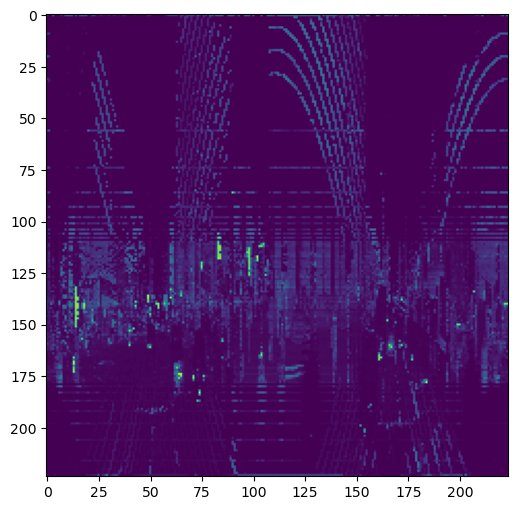

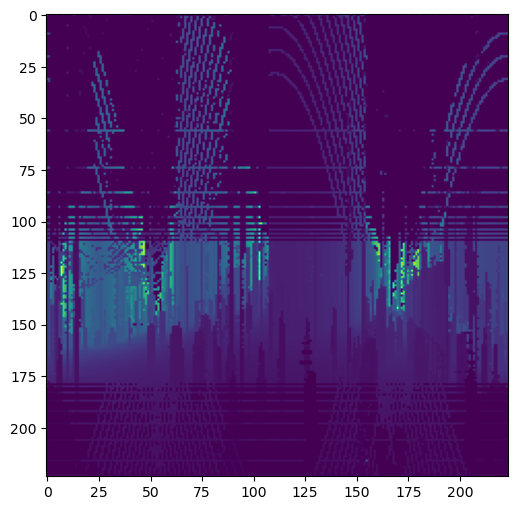

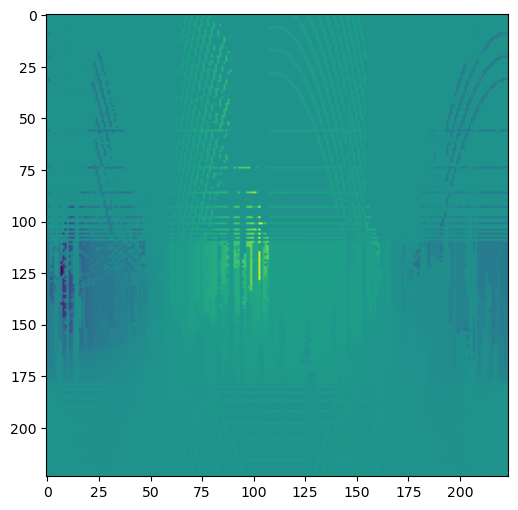

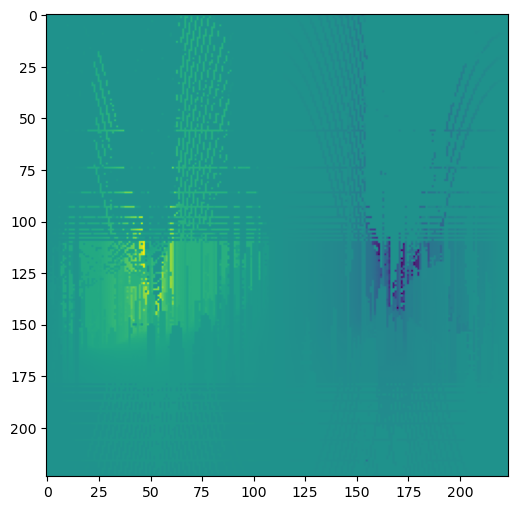

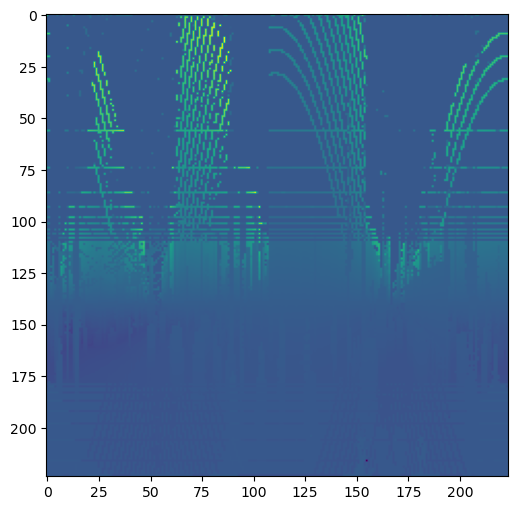

In [25]:
for i in range(5):
    plt.figure(figsize=(20, 6));
    plt.imshow(proj[:,:,i]);


In [139]:
train_dataset[0][0].shape

torch.Size([5, 128, 2048])

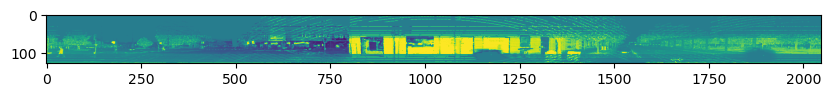

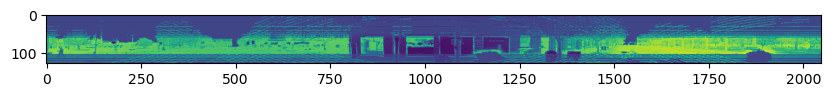

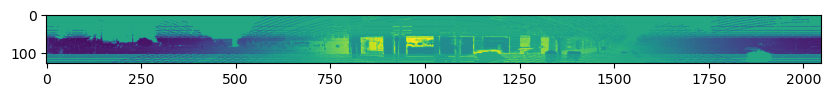

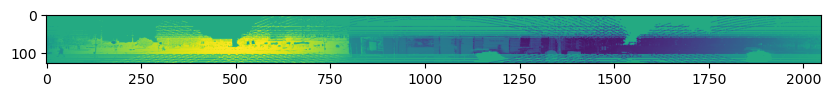

In [140]:
for i in range(4):
    plt.figure(figsize=(10, 10));
    plt.imshow(train_dataset[0][0][i,:, :])

## Training function LiDAR

In [11]:
classes = {'cloudy':0, 'clear':1, 'snow':2, 'rain':3, 'fog':4}
def val_model(model, criterion, val_loader):
    model.to(device)
    model.eval()
    acc_value = []
    
        
    metrics_sum = {}    
        
    with torch.no_grad():    
        for idx, (lidar, labels) in enumerate(val_loader):
            lidar, labels = lidar.to(device), labels.to(device)
            outputs = model(lidar)
            loss = criterion(outputs, labels)
            metrics = {'val_loss': loss.item(), 
                'val_acc': (outputs.argmax() == labels).cpu().numpy().mean()*100}
            
            
            for k, v in metrics.items():
                metrics_sum.update({k:metrics_sum.get(k,[]) + [v]})
        avg_in_epoch = {k: sum(v)/(len(v)) for k,v in metrics_sum.items()}
                
    return avg_in_epoch
    

def train_model(model, criterion, epochs, optimizer, train_loader, val_loader, batch_size, max_grad_norm = 3.0):
    model.to(device)
    
    plot_values = {'train_acc':[], 'train_loss':[], 'val_acc':[], 'val_loss':[]}
    for epoch in range(epochs):
        model.train()
        metrics_sum = {}
        
        
        
        for idx, (lidar, labels) in enumerate(train_loader):
            
            lidar, labels = lidar.to(device), labels.to(device)
            optimizer.zero_grad()
            #lidar_embedding = model(lidar)
            #images = torch.cat((lidar_embedding, images), dim = 1)
            
            outputs = model(lidar)
            loss = criterion(outputs, labels)
            #print(loss)
            loss.backward()
            metrics = {
                'train_loss': loss.item(), 
                'train_acc': (outputs.argmax() == labels).cpu().numpy().mean()*100}
            nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
            optimizer.step()

            for k, v in metrics.items():
                metrics_sum.update({k:metrics_sum.get(k,[]) + [v]})

            print(f'\r[Epoch: {epoch+1:4d}][{1+idx:4d}/{len(train_loader)/batch_size}]',
              *[f'{k}: {v:.4f},' for k,v in metrics.items()],
              end='\r')
            
            lidar, labels = lidar.to(torch.device("cpu")), labels.to(torch.device("cpu"))

        
        print(f'\r[Epoch: {epoch+1:4d}]',
              *[f'{k}: {sum(v)/(len(v)):.4f}' for k,v in metrics_sum.items()],
              ' '*20
             )
        avg_in_epoch = {k: sum(v)/(len(v)) for k,v in metrics_sum.items()}
        avg_in_epoch.update(val_model(model, criterion, val_loader))
        
        for k, v in avg_in_epoch.items():
            plot_values[k].append(v)
            
        
        
        
    
    update_live_plot([*range(epochs)], **plot_values);
    
        
def update_live_plot(epochs, **values):
    
    f, ax1 = plt.subplots(nrows = 2, ncols = 1, figsize = (18, 20), sharey=False);
    h1, = ax1[0].plot(epochs, values['train_loss'], 'b-', marker = '.', label = 'Train Loss')
    h2, = ax1[1].plot(epochs, values['val_loss'], 'b-', marker = '.', label = 'Val Loss')
    ax1[0].set_xlabel('Epoch')
    ax1[0].set_ylabel('Train Loss')
    #ax1.set_title('Train vs Val Loss')
    ax1[0].tick_params('y', colors='b')
    
    ax1[1].set_xlabel('Epoch')
    ax1[1].set_ylabel('Val Loss')
    #ax1.set_title('Train vs Val Loss')
    ax1[1].tick_params('y', colors='b')
    
    ax2 = ax1[0].twinx()
    ax3 = ax1[1].twinx()
    h3, = ax2.plot(epochs, values['train_acc'], 'r-',marker = '.', label = 'Train Accuracy')
    h4, = ax3.plot(epochs, values['val_acc'], 'r-',marker = '.', label = 'Val Accuracy')
    ax2.set_ylabel('Accuracy')
    ax2.tick_params('y', colors='r')
    
    ax3.set_ylabel('Accuracy')
    ax3.tick_params('y', colors='r')
    
    ax1[0].legend(handles=[h1,h3], bbox_to_anchor=(1.15, 1))
    ax1[1].legend(handles=[h2,h4], bbox_to_anchor=(1.15, 1))

    plt.subplots_adjust(right=0.85)
    plt.savefig('output_figure.png')
    plt.show();        
def test_model(model, test_loader):
    correct = 0
    total = 0
    all_labels = []
    all_preds = []
    model.to(device)
    model.eval() 
    with torch.no_grad():
        for lidar,  labels in test_loader:
            lidar, labels = lidar.to(device),  labels.to(device)
            outputs = model(lidar)
            _, predicted = torch.max(outputs, 1)
            total+=labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.append(labels.cpu().numpy())
            all_preds.append(predicted.cpu().numpy())
    accuracy = 100 * correct / total
    print(f'Accuracy on the test dataset: {accuracy}%')
    
    return all_preds, all_labels

def print_confusion_matrix(all_labels, all_preds):
    cf = confusion_matrix(all_labels, all_preds)
    print(cf)
    cm_display = ConfusionMatrixDisplay.from_predictions(all_labels, all_preds, 
                                                         display_labels = list(classes.keys()), normalize='all', cmap = 'Blues')
    plt.show()

    '''
    plt.figure(figsize=(8, 6))
    plt.imshow(cf, interpolation="nearest", cmap=plt.get_cmap("Blues"))
    plt.title("Confusion Matrix")
    plt.colorbar()
    tick_marks = list(classes.keys())
    plt.xticks([i for i in range(6)], tick_marks)
    plt.yticks([i for i in range(6)], tick_marks)
    plt.tight_layout()
    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.show()
    '''


In [80]:
!nvidia-smi

Tue Nov 28 14:56:42 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 515.65.01    Driver Version: 515.65.01    CUDA Version: 11.7     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Quadro RTX 8000     On   | 00000000:65:00.0 Off |                  Off |
| 85%   87C    P2   199W / 260W |  24565MiB / 49152MiB |     98%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Vision transformer with LiDAR data

### Case 1 : Panaromic view with Compression

#### Training done for 50 epochs.
#### Optimizer used - Adagrad with lr - 0.009
#### Training accuracy - 97.21%
#### Test accuracy - 74.30%.

In [39]:
torch.cuda.empty_cache()
vision_transformer2 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 5)

data_config = timm.data.resolve_model_data_config(vision_transformer2)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer2 = vision_transformer2.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer2.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 2.0865 train_acc: 19.1570                     
[Epoch:    2] train_loss: 1.6424 train_acc: 24.3488                     
[Epoch:    3] train_loss: 1.4414 train_acc: 44.3379                     
[Epoch:    4] train_loss: 1.3813 train_acc: 58.0499                     
[Epoch:    5] train_loss: 1.2928 train_acc: 62.7352                     
[Epoch:    6] train_loss: 1.2155 train_acc: 66.3531                     
[Epoch:    7] train_loss: 1.1571 train_acc: 69.1027                     
[Epoch:    8] train_loss: 1.0964 train_acc: 70.9117                     
[Epoch:    9] train_loss: 1.0599 train_acc: 72.5217                     
[Epoch:   10] train_loss: 1.0266 train_acc: 74.0051                     
[Epoch:   11] train_loss: 0.9941 train_acc: 74.4754                     
[Epoch:   12] train_loss: 0.9510 train_acc: 75.6874                     
[Epoch:   13] train_loss: 0.9390 train_acc: 75.8683                     
[Epoch:   14] train_loss: 0.9211 train_acc: 76.5376

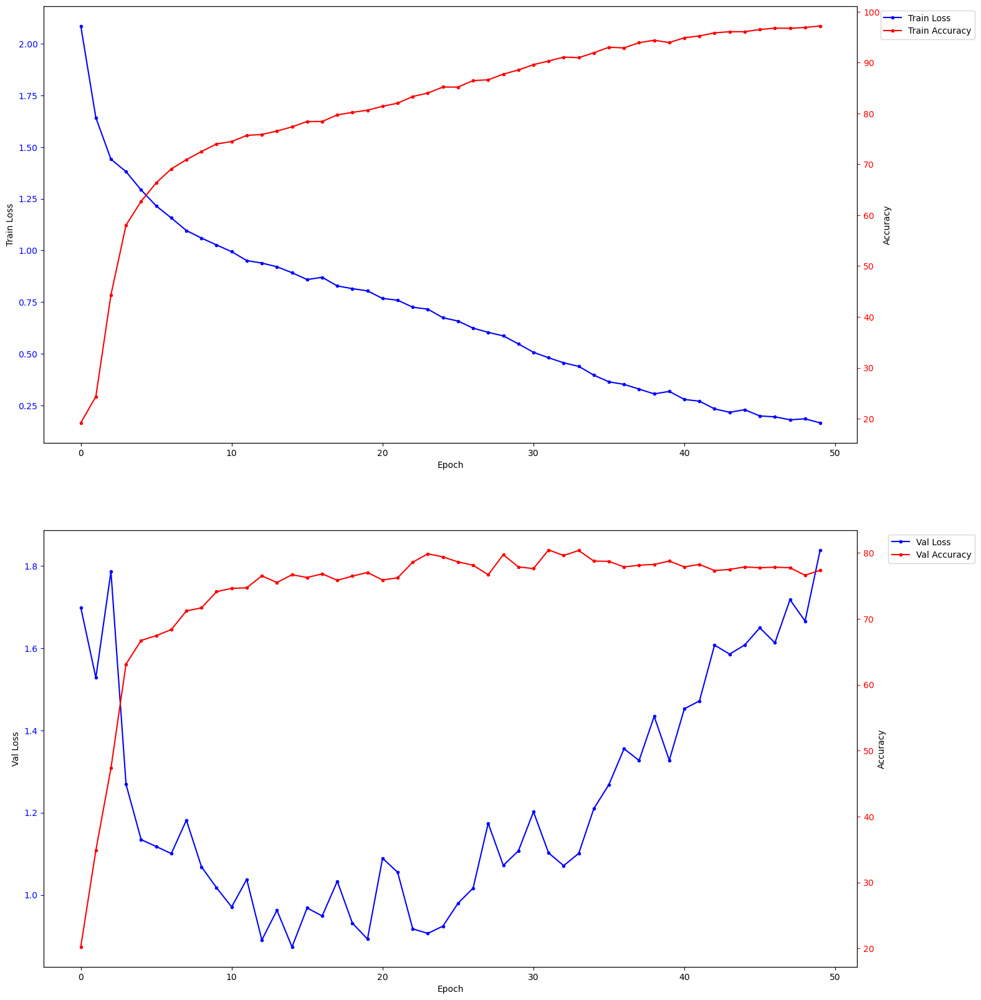

In [40]:
train_model(vision_transformer2, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

In [41]:
torch.save(vision_transformer2.state_dict(), 'Pan_comp_model.pth')

Accuracy on the test dataset: 74.30309173846933%
[[281  95  11  19   2]
 [100 267   2  10   1]
 [  7   4 297  54  45]
 [ 45  16  55 257   8]
 [  0   1  27   5 364]]


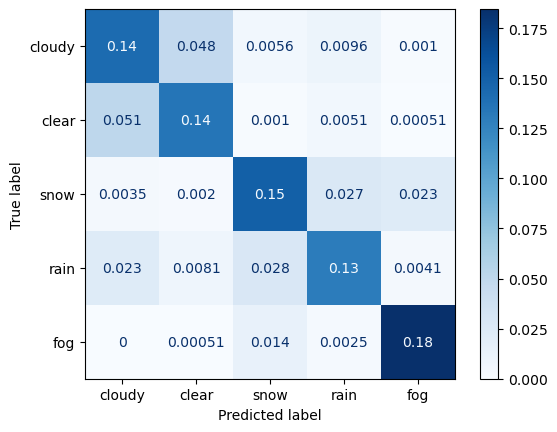

In [44]:
all_preds, all_labels = test_model(vision_transformer2, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [78]:
del vision_transformer2

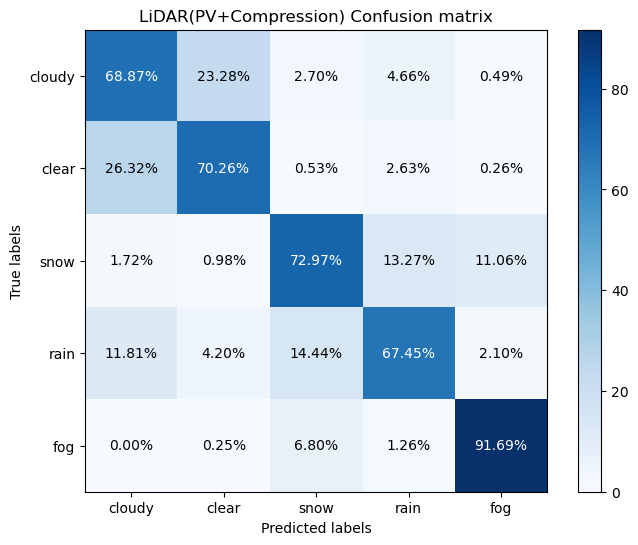

In [31]:
confusion_matrix_values = np.array([
 [281,  95,   11,  19,   2],
 [ 100, 267,   2,  10,   1],
 [  7,   4, 297,  54,  45],
 [ 45,   16,  55, 257,   8],
 [  0,   1,  27,   5, 364]
])
create_cf(confusion_matrix_values, 'LiDAR(PV+Compression) Confusion matrix')

### Case 2 : Panaromic view with Enhancement

#### Training done for 50 epochs.
#### Optimizer used - Adagrad with lr - 0.009
#### Training accuracy - 87.8%
#### Test accuracy - 78.50%.

In [85]:
class ResContextBlock(nn.Module):
    def __init__(self, in_filters, out_filters):
        super(ResContextBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_filters, out_filters, kernel_size=(1, 1), stride=1)
        self.act1 = nn.LeakyReLU()

        self.conv2 = nn.Conv2d(out_filters, out_filters, (3,3), padding=1)
        self.act2 = nn.LeakyReLU()
        self.bn1 = nn.BatchNorm2d(out_filters)

        self.conv3 = nn.Conv2d(out_filters, out_filters, (3,3),dilation=2, padding=2)
        self.act3 = nn.LeakyReLU()
        self.bn2 = nn.BatchNorm2d(out_filters)


    def forward(self, x):

        shortcut = self.conv1(x)
        shortcut = self.act1(shortcut)

        resA = self.conv2(shortcut)
        resA = self.act2(resA)
        resA1 = self.bn1(resA)

        resA = self.conv3(resA1)
        resA = self.act3(resA)
        resA2 = self.bn2(resA)

        output = shortcut + resA2
        return output
class VitMaxPro(nn.Module):
        def __init__(self, in_channels, out_channels):
            super(VitMaxPro, self).__init__()

            oc = out_channels
            self.ResContext = ResContextBlock(in_channels, out_channels)
            self.encoder = nn.Sequential(
                nn.Conv2d(oc, oc, kernel_size=(3, 3), stride=(1, 3), padding = (1, 2)),
                nn.ReLU(inplace=True),
                nn.Conv2d(oc, oc, kernel_size=(5, 3), stride=(1, 3)),
                nn.ReLU(inplace=True),
                nn.Conv2d(oc, oc, kernel_size=(5, 3), dilation = (3, 1)),
                nn.ReLU(inplace=True),
                nn.BatchNorm2d(oc), 
                nn.ConvTranspose2d(oc, oc, kernel_size = (3, 3), stride = (2, 1), padding = (0, 1)),
                nn.ReLU(inplace=True),
                nn.BatchNorm2d(oc),
                nn.Conv2d(oc, oc, kernel_size = (4, 3), padding = (1, 0))
            )
            self.vit = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = out_channels)
            

        def forward(self, x):
            x = self.ResContext(x)
            x = self.encoder(x)
            x = self.vit(x)

            return x
        

In [52]:
transforms_custom

Compose(
    Resize(size=248, interpolation=bicubic, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    ToTensor()
    Normalize(mean=tensor([0.5000, 0.5000, 0.5000]), std=tensor([0.5000, 0.5000, 0.5000]))
)

In [89]:
vision_transformer3 = VitMaxPro(5, 64)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer3.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer3.parameters(), lr = 0.009)

In [87]:
summary(vision_transformer3, (5, 128, 2048))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1        [-1, 64, 128, 2048]             384
         LeakyReLU-2        [-1, 64, 128, 2048]               0
            Conv2d-3        [-1, 64, 128, 2048]          36,928
         LeakyReLU-4        [-1, 64, 128, 2048]               0
       BatchNorm2d-5        [-1, 64, 128, 2048]             128
            Conv2d-6        [-1, 64, 128, 2048]          36,928
         LeakyReLU-7        [-1, 64, 128, 2048]               0
       BatchNorm2d-8        [-1, 64, 128, 2048]             128
   ResContextBlock-9        [-1, 64, 128, 2048]               0
           Conv2d-10         [-1, 64, 128, 684]          36,928
             ReLU-11         [-1, 64, 128, 684]               0
           Conv2d-12         [-1, 64, 124, 228]          61,504
             ReLU-13         [-1, 64, 124, 228]               0
           Conv2d-14         [-1, 64, 1

[Epoch:    1] train_loss: 2.1268 train_acc: 19.9530                     
[Epoch:    2] train_loss: 1.6680 train_acc: 20.2605                     
[Epoch:    3] train_loss: 1.6445 train_acc: 20.8575                     
[Epoch:    4] train_loss: 1.6282 train_acc: 19.8987                     
[Epoch:    5] train_loss: 1.6253 train_acc: 19.7359                     
[Epoch:    6] train_loss: 1.6156 train_acc: 21.4001                     
[Epoch:    7] train_loss: 1.5994 train_acc: 25.2352                     
[Epoch:    8] train_loss: 1.4970 train_acc: 33.9363                     
[Epoch:    9] train_loss: 1.3518 train_acc: 41.5340                     
[Epoch:   10] train_loss: 1.2561 train_acc: 54.2330                     
[Epoch:   11] train_loss: 1.2046 train_acc: 62.8437                     
[Epoch:   12] train_loss: 1.0731 train_acc: 70.9479                     
[Epoch:   13] train_loss: 0.9998 train_acc: 73.9689                     
[Epoch:   14] train_loss: 0.9543 train_acc: 76.0492

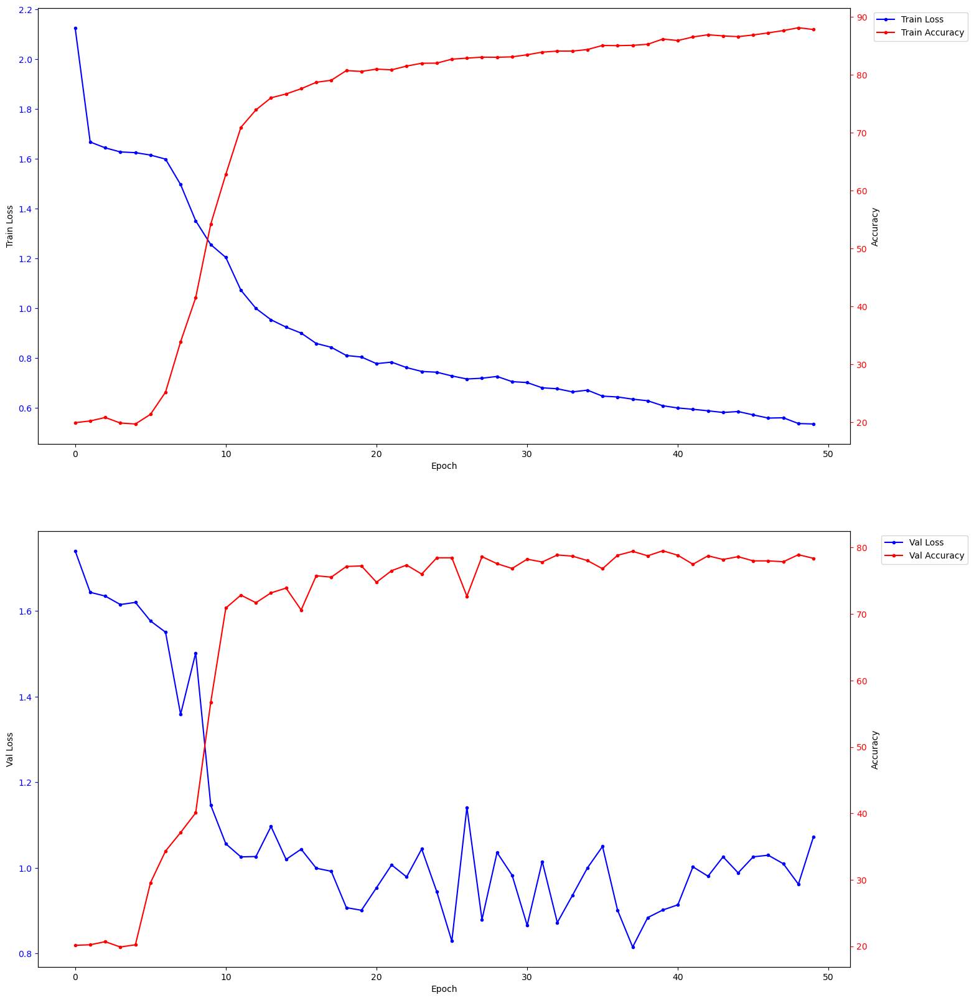

In [90]:
train_model(vision_transformer3, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

In [92]:
torch.save(vision_transformer3.state_dict(), 'Pan_no_comp_model.pth')

Accuracy on the test dataset: 78.56056766345667%
[[345  23   1  45   2]
 [ 79 301   3   7   2]
 [  3   0 291  43  41]
 [ 25   6  88 273   9]
 [  1   0  36   9 340]]


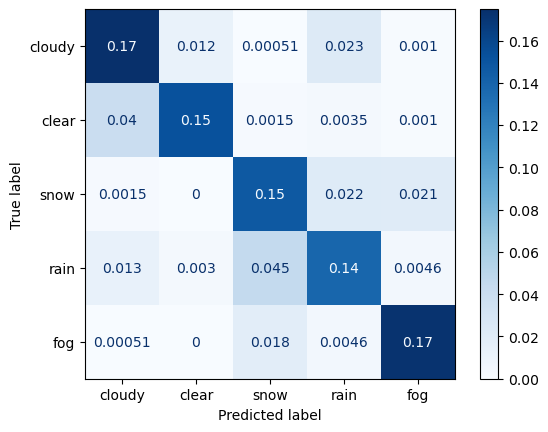

In [96]:
all_preds, all_labels = test_model(vision_transformer3, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [97]:
del vision_transformer3

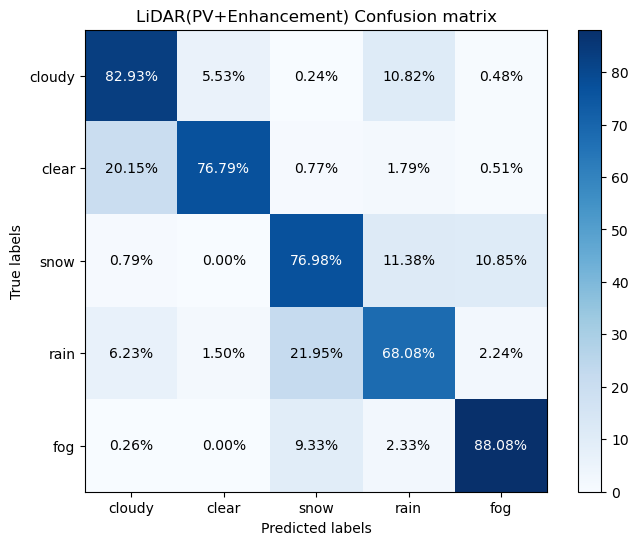

In [32]:
confusion_matrix_values = np.array([
 [345,  23,   1,  45,   2],
 [ 79, 301,   3,  7,   2],
 [  3,   0, 291,  43,  41],
 [ 25,   6,  88, 273,   9],
 [  1,   0,  36,   9, 340]
])
create_cf(confusion_matrix_values, 'LiDAR(PV+Enhancement) Confusion matrix')

### Case 3 : Front view with Compression

#### Training done for 50 epochs.
#### Optimizer used - Adagrad with lr - 0.009
#### Training accuracy - 89.43%
#### Test accuracy - 75.16%.

In [105]:
torch.cuda.empty_cache()
vision_transformer4 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 5)

data_config = timm.data.resolve_model_data_config(vision_transformer4)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer4 = vision_transformer4.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer4.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 2.0947 train_acc: 20.3690                     
[Epoch:    2] train_loss: 1.6621 train_acc: 19.6816                     
[Epoch:    3] train_loss: 1.6356 train_acc: 19.6997                     
[Epoch:    4] train_loss: 1.6280 train_acc: 19.7721                     
[Epoch:    5] train_loss: 1.6019 train_acc: 24.5839                     
[Epoch:    6] train_loss: 1.3705 train_acc: 49.0774                     
[Epoch:    7] train_loss: 1.2842 train_acc: 62.2829                     
[Epoch:    8] train_loss: 1.2529 train_acc: 63.3502                     
[Epoch:    9] train_loss: 1.2347 train_acc: 65.9009                     
[Epoch:   10] train_loss: 1.1666 train_acc: 68.0535                     
[Epoch:   11] train_loss: 1.1124 train_acc: 70.4595                     
[Epoch:   12] train_loss: 1.0716 train_acc: 71.6172                     
[Epoch:   13] train_loss: 1.0320 train_acc: 73.6975                     
[Epoch:   14] train_loss: 1.0121 train_acc: 73.8242

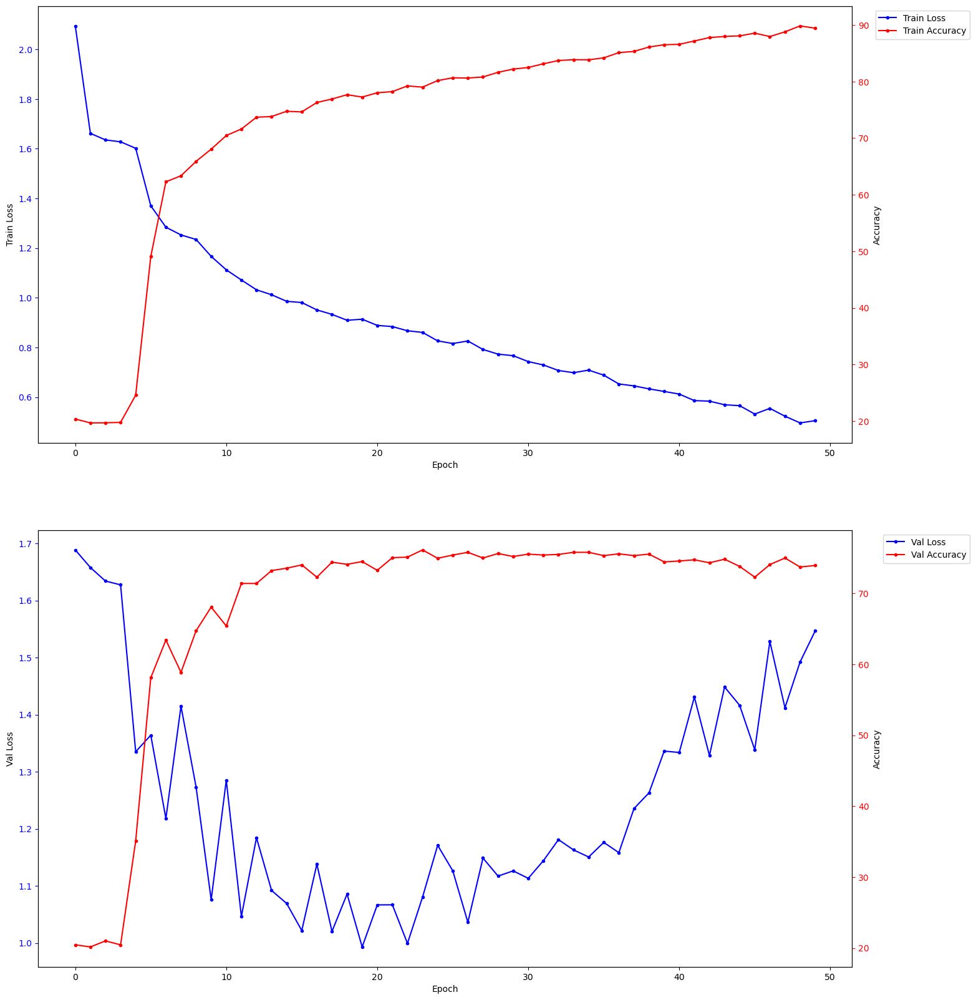

In [106]:
train_model(vision_transformer4, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

In [107]:
torch.save(vision_transformer4.state_dict(), 'Front_comp_model.pth')

Accuracy on the test dataset: 75.16472377090724%
[[265  86   7  54   3]
 [ 61 312   2  16   6]
 [  2   3 282  34  46]
 [ 12  29  55 276  20]
 [  5   7  36   6 348]]


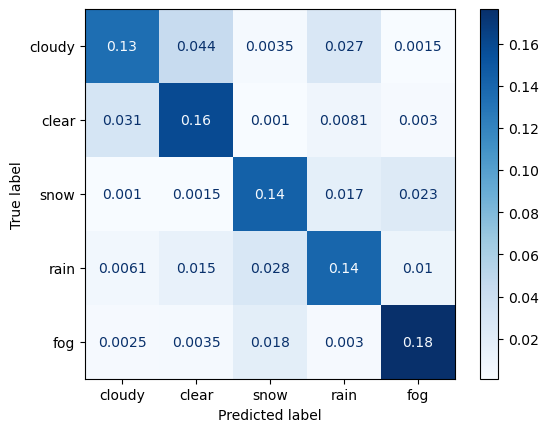

In [108]:
all_preds, all_labels = test_model(vision_transformer4, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [109]:
del vision_transformer4

In [8]:
torch.cuda.empty_cache()
vision_transformer4 = timm.create_model('vit_large_r50_s32_224', pretrained=False, drop_rate = 0.3, num_classes = 5, in_chans = 5)

data_config = timm.data.resolve_model_data_config(vision_transformer4)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer4 = vision_transformer4.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer4.parameters(), lr = 0.009)

[Epoch:    1] train_acc: 20.0977 train_loss: 1.8817 val_acc: 19.4679 val_loss: 1.6319                                         
[Epoch:    2] train_acc: 20.3871 train_loss: 1.8000 val_acc: 19.6791 val_loss: 1.6504                                         
[Epoch:    3] train_acc: 22.5338 train_loss: 1.7459 val_acc: 24.1132 val_loss: 1.5987                                         
[Epoch:    4] train_acc: 25.4206 train_loss: 1.7087 val_acc: 27.8083 val_loss: 1.5640                                         
[Epoch:    5] train_acc: 27.8763 train_loss: 1.6868 val_acc: 30.3125 val_loss: 1.5702                                         
[Epoch:    6] train_acc: 30.0742 train_loss: 1.6745 val_acc: 32.3480 val_loss: 1.5477                                         
[Epoch:    7] train_acc: 32.6494 train_loss: 1.6593 val_acc: 35.2679 val_loss: 1.5745                                         
[Epoch:    8] train_acc: 35.5033 train_loss: 1.6476 val_acc: 37.9540 val_loss: 1.5583                          

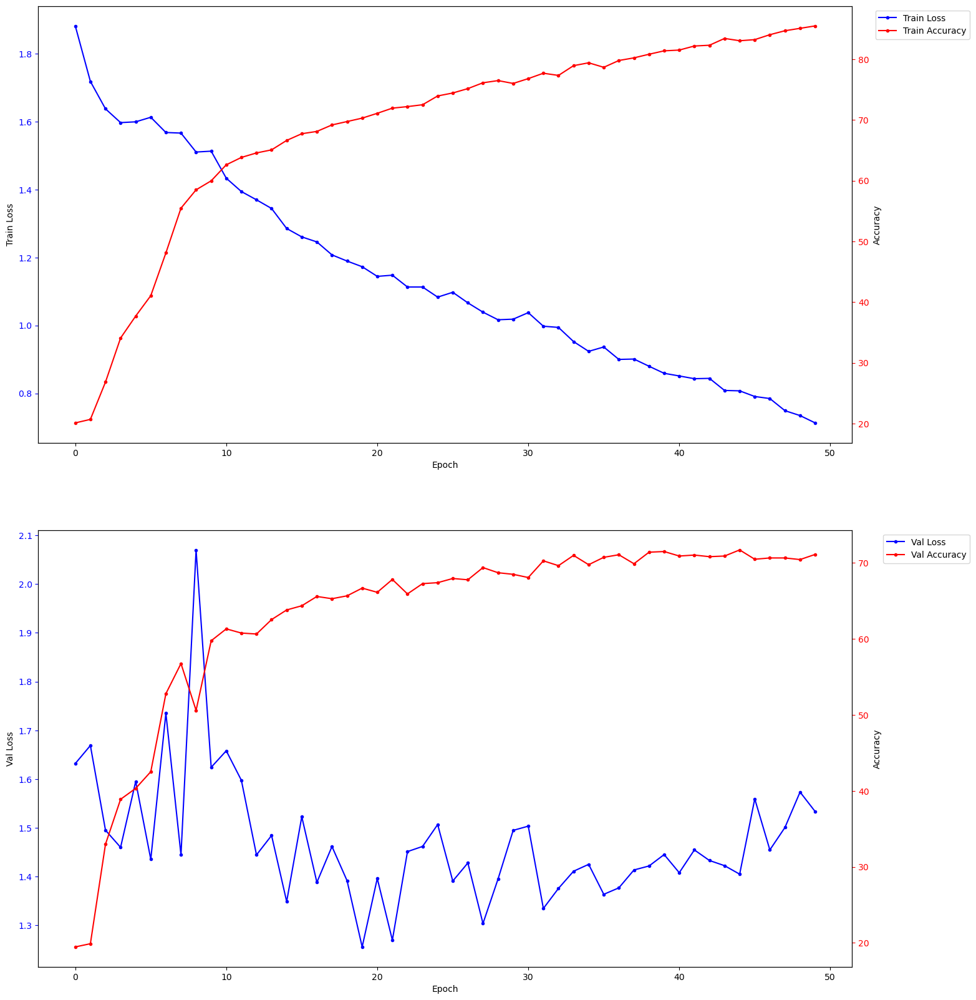

In [9]:
train_model(vision_transformer4, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

In [10]:
torch.save(vision_transformer4.state_dict(), 'Front_comp_model_no_pretrain.pth')

Accuracy on the test dataset: 71.61682716675114%
[[243  63   4  53   2]
 [ 97 285   3  18   4]
 [  2   0 235  76  53]
 [ 36  16  43 310  14]
 [  3   0  56  17 340]]


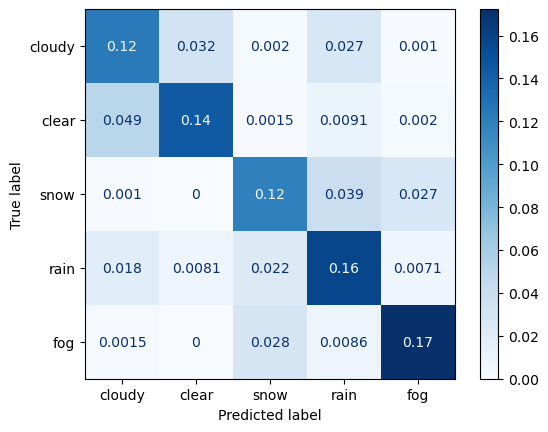

In [11]:
all_preds, all_labels = test_model(vision_transformer4, test_loader)
print_confusion_matrix(all_labels, all_preds)

5528

In [41]:
torch.cuda.empty_cache()
vision_transformer4 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 2)

data_config = timm.data.resolve_model_data_config(vision_transformer4)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer4 = vision_transformer4.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer4.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 1.6071 train_acc: 29.7214                     
[Epoch:    2] train_loss: 1.5866 train_acc: 33.5022                     
[Epoch:    3] train_loss: 1.5160 train_acc: 40.7200                     
[Epoch:    4] train_loss: 1.4597 train_acc: 46.4906                     
[Epoch:    5] train_loss: 1.3985 train_acc: 51.7547                     
[Epoch:    6] train_loss: 1.3593 train_acc: 56.7836                     
[Epoch:    7] train_loss: 1.3144 train_acc: 58.6107                     
[Epoch:    8] train_loss: 1.2663 train_acc: 61.2337                     
[Epoch:    9] train_loss: 1.2518 train_acc: 63.4768                     
[Epoch:   10] train_loss: 1.2042 train_acc: 64.6165                     
[Epoch:   11] train_loss: 1.1775 train_acc: 65.9009                     
[Epoch:   12] train_loss: 1.1569 train_acc: 66.7692                     
[Epoch:   13] train_loss: 1.1245 train_acc: 67.6556                     
[Epoch:   14] train_loss: 1.0950 train_acc: 68.1802

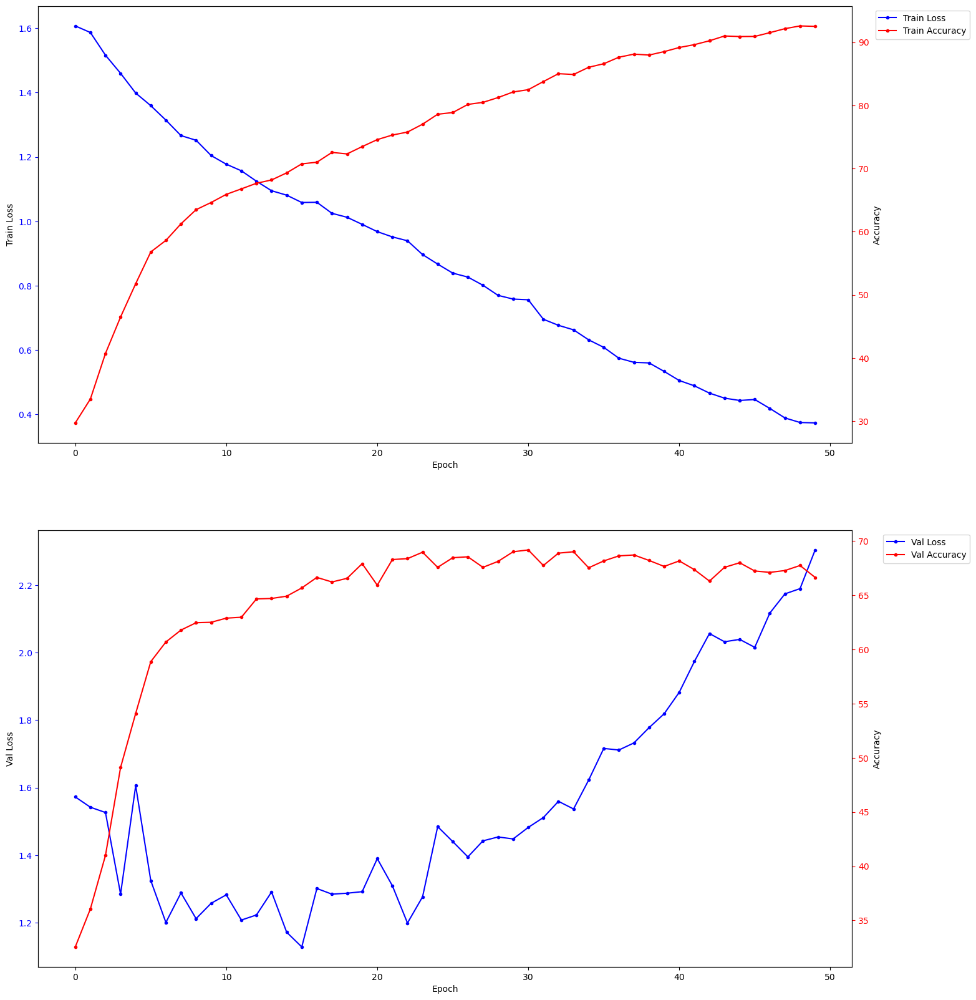

In [47]:
train_model(vision_transformer4, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

In [46]:
!nvidia-smi #before training

Tue Nov 28 19:42:08 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.199.02   Driver Version: 470.199.02   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  On   | 00000000:02:00.0  On |                  N/A |
| 44%   57C    P2   127W / 350W |  15005MiB / 24259MiB |     23%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Accuracy on the test dataset: 66.6497719209326%
[[267  80   3  35   9]
 [107 228   4  21  12]
 [  6   4 292  63  41]
 [ 61  35  63 258  15]
 [  8  26  56   9 270]]


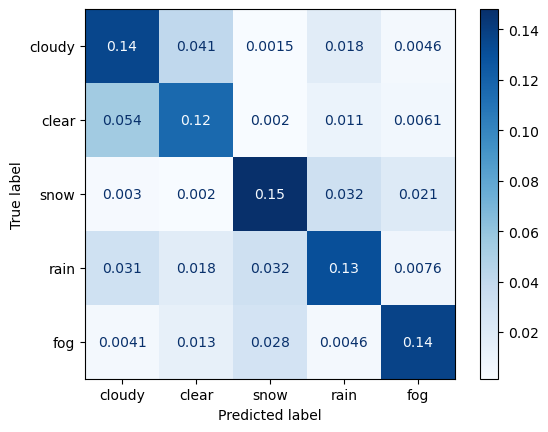

In [48]:
all_preds, all_labels = test_model(vision_transformer4, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [49]:
!nvidia-smi #after training

Wed Nov 29 10:10:20 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.199.02   Driver Version: 470.199.02   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  On   | 00000000:02:00.0  On |                  N/A |
| 30%   27C    P8    17W / 350W |  12912MiB / 24259MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [50]:
torch.save(vision_transformer4.state_dict(), 'Front_comp_model_2_channels.pth')

In [52]:
del vision_transformer4

In [53]:
!nvidia-smi

Wed Nov 29 10:30:15 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.199.02   Driver Version: 470.199.02   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  On   | 00000000:02:00.0  On |                  N/A |
| 30%   30C    P8    17W / 350W |  12912MiB / 24259MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [42]:
#only intensity

torch.cuda.empty_cache()
vision_transformer4 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 1)

data_config = timm.data.resolve_model_data_config(vision_transformer4)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer4 = vision_transformer4.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer4.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 2.4765 train_acc: 62.5714                     
[Epoch:    2] train_loss: 1.9499 train_acc: 67.1429                     
[Epoch:    3] train_loss: 1.8050 train_acc: 67.1429                     
[Epoch:    4] train_loss: 1.7504 train_acc: 67.6429                     
[Epoch:    5] train_loss: 1.6985 train_acc: 67.7143                     
[Epoch:    6] train_loss: 1.7431 train_acc: 67.7143                     
[Epoch:    7] train_loss: 1.6082 train_acc: 67.4286                     
[Epoch:    8] train_loss: 1.4604 train_acc: 71.8571                     
[Epoch:    9] train_loss: 1.5963 train_acc: 67.6429                     
[Epoch:   10] train_loss: 1.2045 train_acc: 74.3571                     
[Epoch:   11] train_loss: 1.2000 train_acc: 78.5000                     
[Epoch:   12] train_loss: 1.1043 train_acc: 79.7857                     
[Epoch:   13] train_loss: 1.0897 train_acc: 79.0714                     
[Epoch:   14] train_loss: 1.0425 train_acc: 80.3571

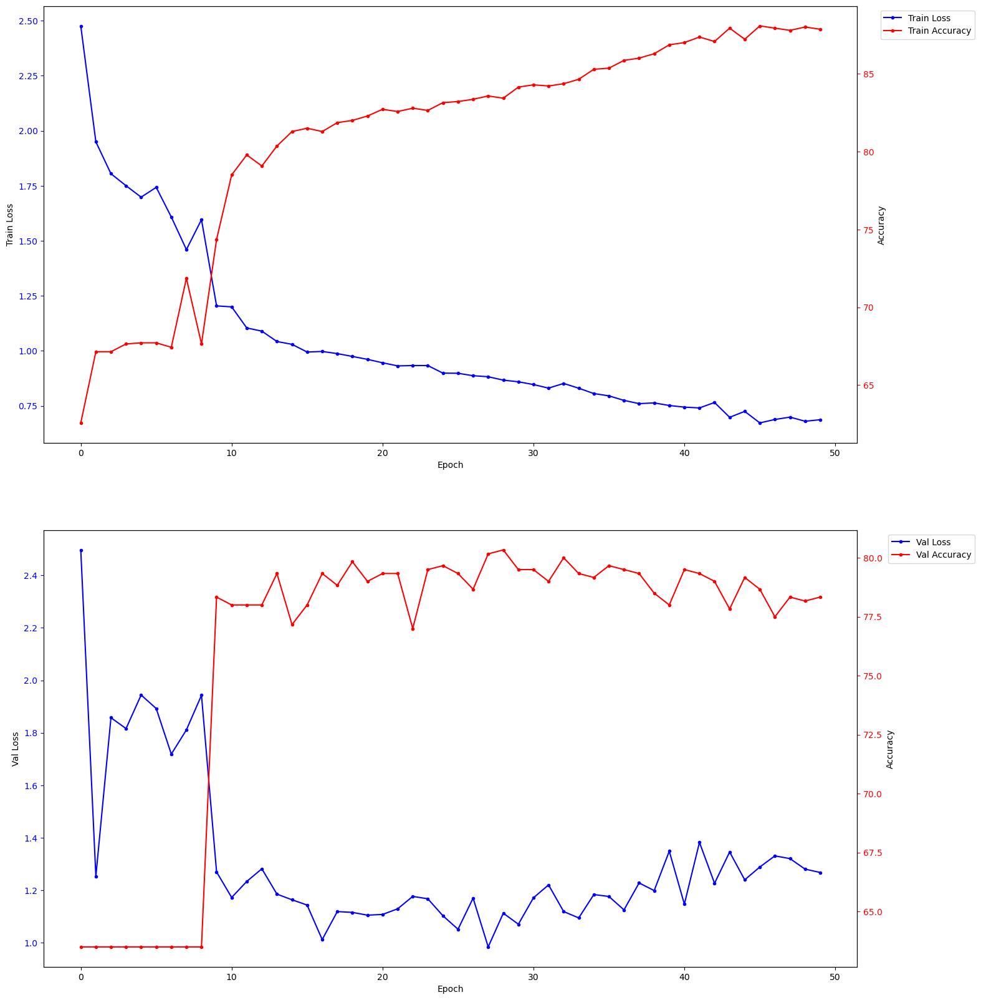

In [43]:
train_model(vision_transformer4, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

Accuracy on the test dataset: 81.2%
[[325   0   0  26]
 [ 35   0   0   0]
 [  3   0   0   6]
 [ 24   0   0  81]]


ValueError: The number of FixedLocator locations (4), usually from a call to set_ticks, does not match the number of labels (5).

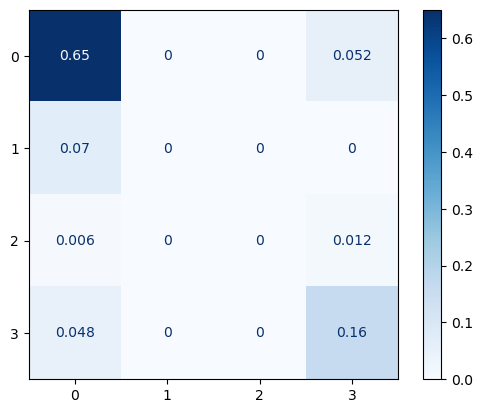

In [55]:
all_preds, all_labels = test_model(vision_transformer4, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [82]:
#i, x, y, z
torch.cuda.empty_cache()
vision_transformer5 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 4)

data_config = timm.data.resolve_model_data_config(vision_transformer5)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer5 = vision_transformer5.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer5.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 2.9502 train_acc: 19.9286                     
[Epoch:    2] train_loss: 2.4272 train_acc: 18.4286                     
[Epoch:    3] train_loss: 1.8221 train_acc: 20.5000                     
[Epoch:    4] train_loss: 1.8567 train_acc: 21.0714                     
[Epoch:    5] train_loss: 1.7330 train_acc: 22.7143                     
[Epoch:    6] train_loss: 1.6915 train_acc: 19.5000                     
[Epoch:    7] train_loss: 1.6714 train_acc: 19.3571                     
[Epoch:    8] train_loss: 1.6596 train_acc: 19.5000                     
[Epoch:    9] train_loss: 1.6534 train_acc: 21.1429                     
[Epoch:   10] train_loss: 1.6468 train_acc: 19.8571                     
[Epoch:   11] train_loss: 1.6597 train_acc: 20.0714                     
[Epoch:   12] train_loss: 1.7053 train_acc: 19.6429                     
[Epoch:   13] train_loss: 1.6680 train_acc: 20.0714                     
[Epoch:   14] train_loss: 1.6414 train_acc: 24.2857

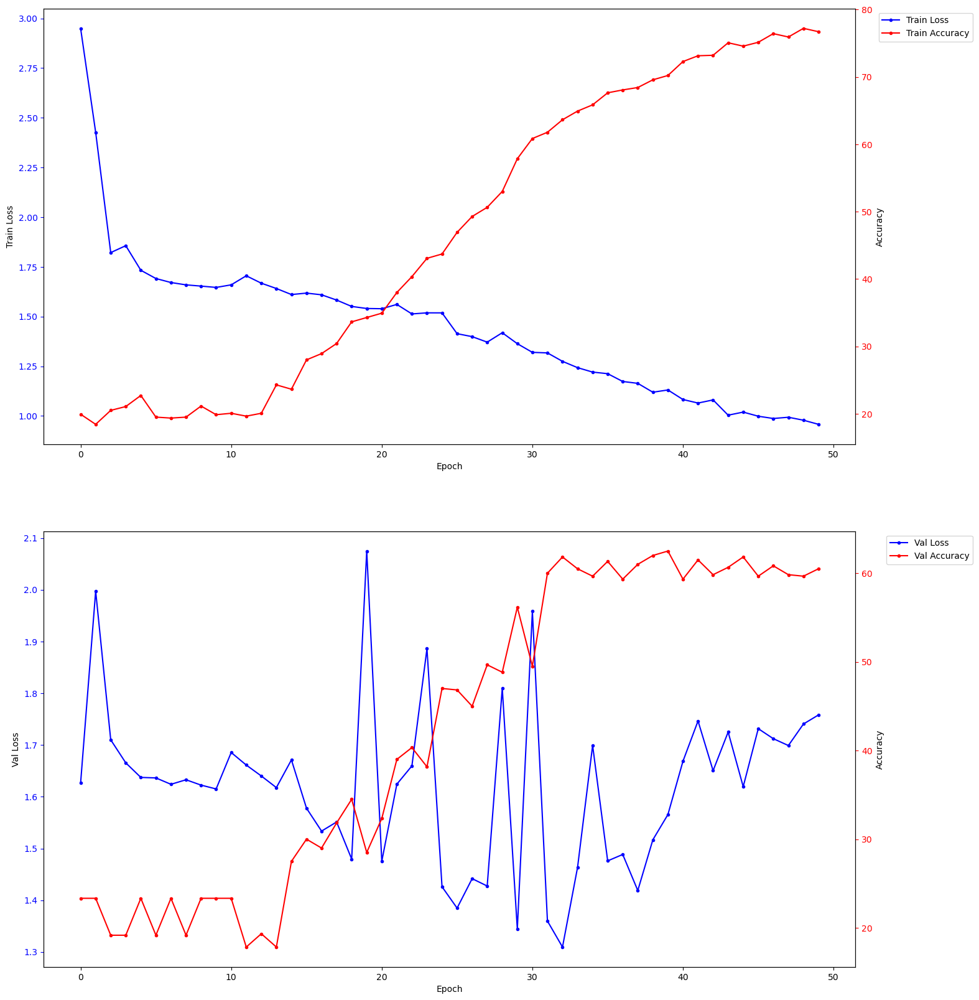

In [83]:
train_model(vision_transformer5, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

Accuracy on the test dataset: 59.4%
[[53 21 10 13  3]
 [33 53  6 11  4]
 [ 6  1 50 26 10]
 [13  8  7 62  5]
 [ 7  3 14  2 79]]


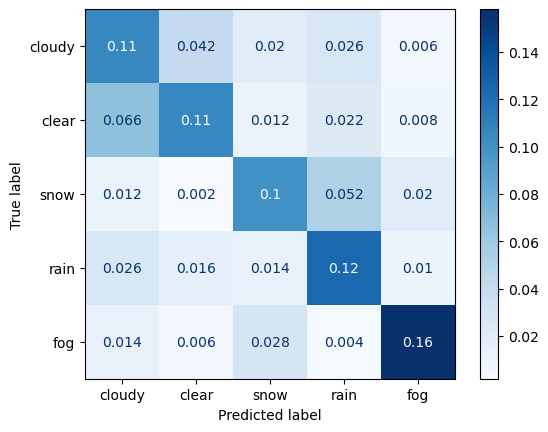

In [85]:
all_preds, all_labels = test_model(vision_transformer5, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [93]:
torch.save(vision_transformer5.state_dict(), 'Front_comp_model_4_channels.pth')
del vision_transformer5

In [94]:
#i, z
torch.cuda.empty_cache()
vision_transformer5 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 2)

data_config = timm.data.resolve_model_data_config(vision_transformer5)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer5 = vision_transformer5.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer5.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 2.9558 train_acc: 19.2857                     
[Epoch:    2] train_loss: 2.0873 train_acc: 18.6429                     
[Epoch:    3] train_loss: 1.7944 train_acc: 21.1429                     
[Epoch:    4] train_loss: 1.7150 train_acc: 18.0714                     
[Epoch:    5] train_loss: 1.6733 train_acc: 20.4286                     
[Epoch:    6] train_loss: 1.6650 train_acc: 17.7143                     
[Epoch:    7] train_loss: 1.7355 train_acc: 18.6429                     
[Epoch:    8] train_loss: 1.7290 train_acc: 19.4286                     
[Epoch:    9] train_loss: 1.6840 train_acc: 19.7143                     
[Epoch:   10] train_loss: 1.6389 train_acc: 22.2143                     


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[Epoch:   24] train_loss: 1.4739 train_acc: 37.8571                     
[Epoch:   25] train_loss: 1.4926 train_acc: 37.7143                     
[Epoch:   26] train_loss: 1.4959 train_acc: 37.5714                     
[Epoch:   27] train_loss: 1.5013 train_acc: 38.4286                     
[Epoch:   28] train_loss: 1.4598 train_acc: 36.6429                     
[Epoch:   29] train_loss: 1.4663 train_acc: 37.8571                     
[Epoch:   30] train_loss: 1.4873 train_acc: 39.0000                     
[Epoch:   31] train_loss: 1.5062 train_acc: 39.3571                     
[Epoch:   32] train_loss: 1.4545 train_acc: 39.5714                     
[Epoch:   33] train_loss: 1.4513 train_acc: 40.9286                     
[Epoch:   34] train_loss: 1.4366 train_acc: 43.2857                     
[Epoch:   35] train_loss: 1.4490 train_acc: 45.1429                     
[Epoch:   36] train_loss: 1.4280 train_acc: 45.6429                     
[Epoch:   37] train_loss: 1.4524 train_acc: 47.2857

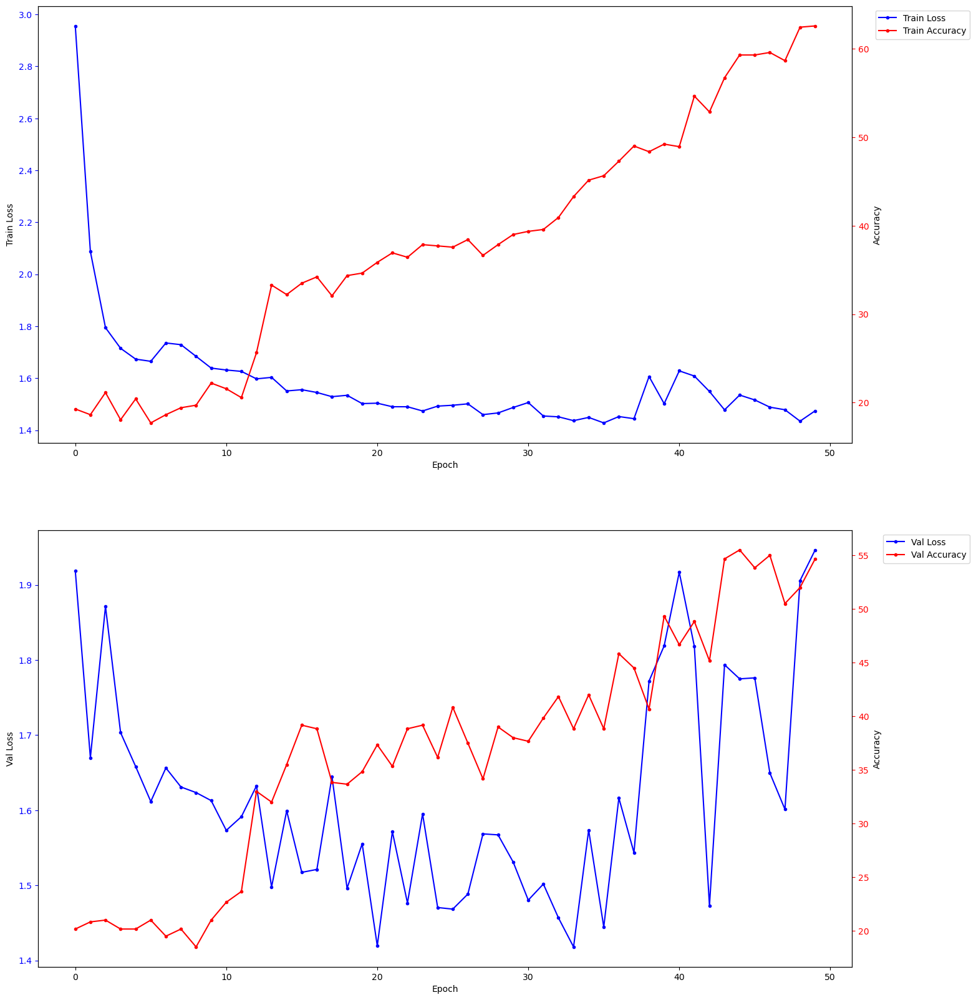

In [95]:
train_model(vision_transformer5, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

Accuracy on the test dataset: 50.2%
[[54 17  0 26  5]
 [38 44  2 15  5]
 [ 6  1 39 16 38]
 [31  9  6 46 10]
 [ 8  2  8  6 68]]


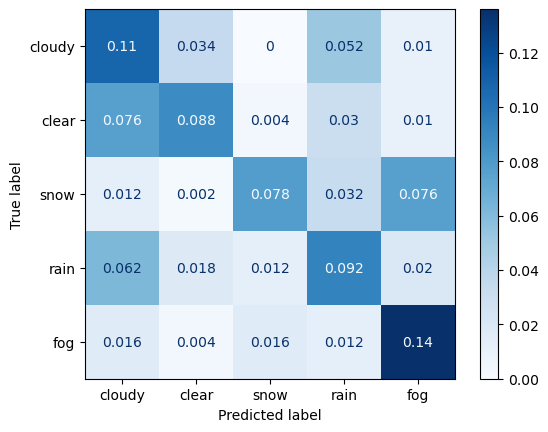

In [96]:
all_preds, all_labels = test_model(vision_transformer5, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [97]:
del vision_transformer5

In [103]:
#i, r, x, y, z, 
torch.cuda.empty_cache()
vision_transformer5 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 5)

data_config = timm.data.resolve_model_data_config(vision_transformer5)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer5 = vision_transformer5.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer5.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 3.0204 train_acc: 19.2143                     
[Epoch:    2] train_loss: 1.9725 train_acc: 19.0714                     
[Epoch:    3] train_loss: 1.7738 train_acc: 21.6429                     
[Epoch:    4] train_loss: 1.7288 train_acc: 20.7143                     
[Epoch:    5] train_loss: 1.6934 train_acc: 20.2143                     
[Epoch:    6] train_loss: 1.6482 train_acc: 24.3571                     
[Epoch:    7] train_loss: 1.6297 train_acc: 27.4286                     
[Epoch:    8] train_loss: 1.6288 train_acc: 26.8571                     
[Epoch:    9] train_loss: 1.6151 train_acc: 29.7143                     
[Epoch:   10] train_loss: 1.5785 train_acc: 29.9286                     
[Epoch:   11] train_loss: 1.5555 train_acc: 33.2857                     
[Epoch:   12] train_loss: 1.5239 train_acc: 32.2857                     
[Epoch:   13] train_loss: 1.5386 train_acc: 32.4286                     
[Epoch:   14] train_loss: 1.4539 train_acc: 42.1429

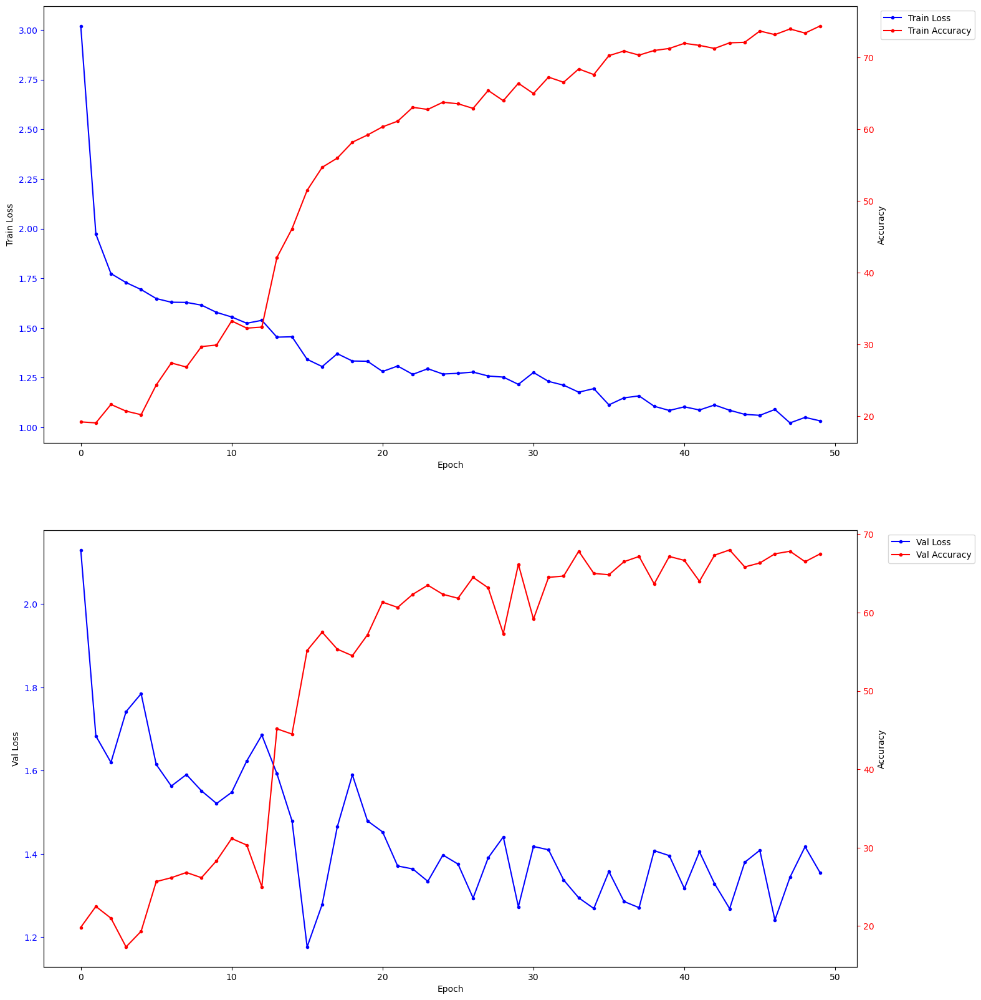

In [104]:
train_model(vision_transformer5, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

Accuracy on the test dataset: 64.6%
[[58 34  0  8  2]
 [33 63  0  2  4]
 [ 2  1 52 18 22]
 [11 11 11 68  8]
 [ 0  3  4  3 82]]


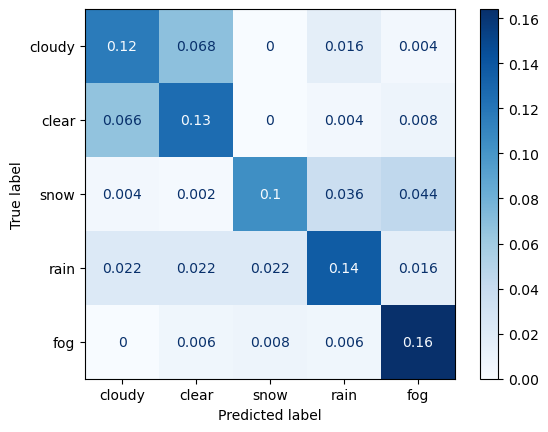

In [105]:
all_preds, all_labels = test_model(vision_transformer5, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [111]:
del vision_transformer5

In [112]:
#i, r 
torch.cuda.empty_cache()
vision_transformer5 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 2)

data_config = timm.data.resolve_model_data_config(vision_transformer5)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer5 = vision_transformer5.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer5.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 3.3005 train_acc: 20.0000                     
[Epoch:    2] train_loss: 2.0837 train_acc: 19.0714                     
[Epoch:    3] train_loss: 1.8883 train_acc: 19.7857                     
[Epoch:    4] train_loss: 1.7569 train_acc: 20.5000                     
[Epoch:    5] train_loss: 1.7224 train_acc: 21.5714                     
[Epoch:    6] train_loss: 1.6953 train_acc: 20.2143                     
[Epoch:    7] train_loss: 1.6759 train_acc: 21.1429                     
[Epoch:    8] train_loss: 1.6592 train_acc: 23.2143                     
[Epoch:    9] train_loss: 1.6217 train_acc: 29.2143                     
[Epoch:   10] train_loss: 1.5907 train_acc: 31.2143                     
[Epoch:   11] train_loss: 1.6198 train_acc: 31.4286                     
[Epoch:   12] train_loss: 1.6321 train_acc: 32.1429                     
[Epoch:   13] train_loss: 1.6226 train_acc: 33.6429                     
[Epoch:   14] train_loss: 1.6159 train_acc: 32.1429

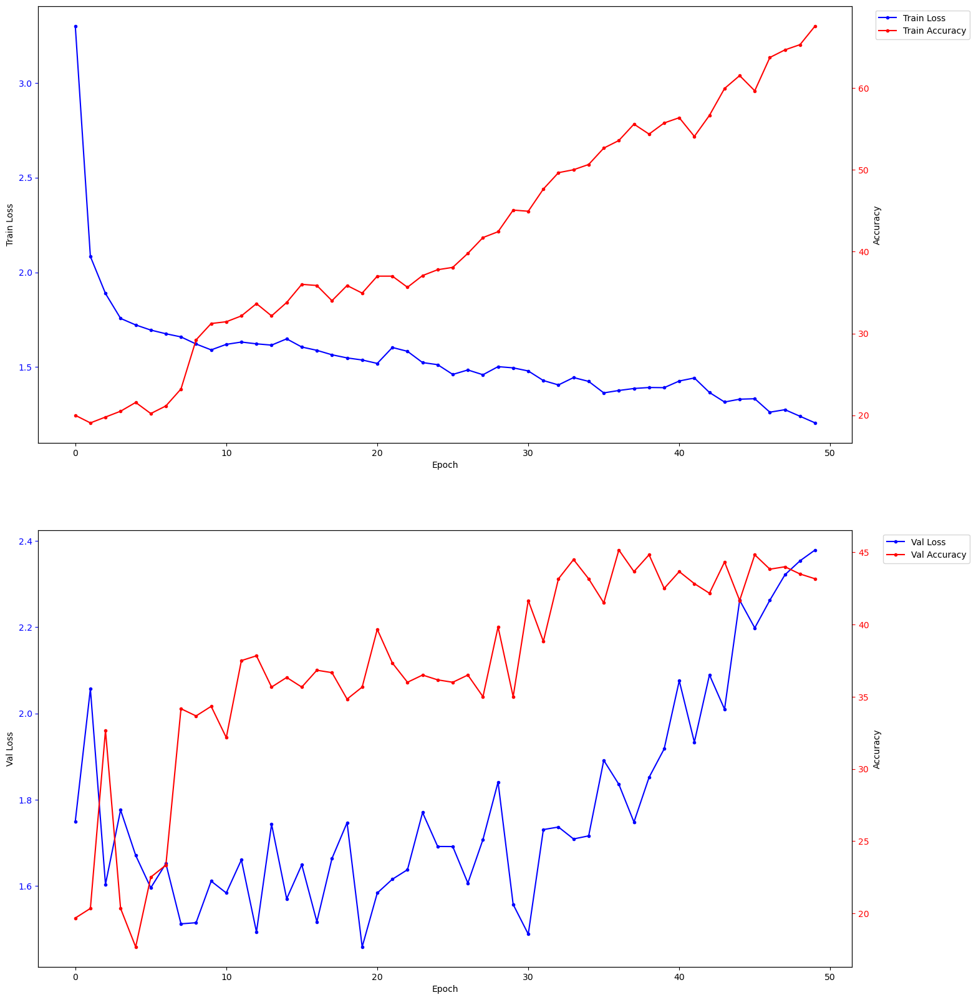

In [113]:
train_model(vision_transformer5, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

Accuracy on the test dataset: 40.0%
[[41 18  9 24 12]
 [45 28  6  9  9]
 [ 7  4 46 20 20]
 [26  7 20 27 13]
 [12 14 14 11 58]]


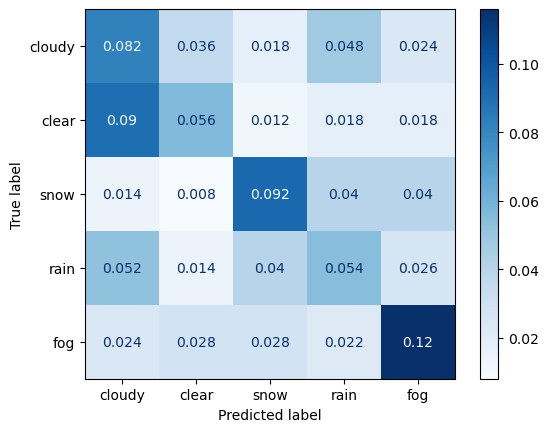

In [114]:
all_preds, all_labels = test_model(vision_transformer5, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [117]:
#i only
torch.cuda.empty_cache()
vision_transformer5 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 1)

data_config = timm.data.resolve_model_data_config(vision_transformer5)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer5 = vision_transformer5.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer5.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 3.0712 train_acc: 22.5714                     
[Epoch:    2] train_loss: 1.9884 train_acc: 19.5000                     
[Epoch:    3] train_loss: 1.8134 train_acc: 21.7143                     
[Epoch:    4] train_loss: 1.7284 train_acc: 21.6429                     
[Epoch:    5] train_loss: 1.7102 train_acc: 22.4286                     
[Epoch:    6] train_loss: 1.6909 train_acc: 19.1429                     
[Epoch:    7] train_loss: 1.6687 train_acc: 21.2143                     
[Epoch:    8] train_loss: 1.6562 train_acc: 19.3571                     
[Epoch:    9] train_loss: 1.6330 train_acc: 23.0000                     
[Epoch:   10] train_loss: 1.6441 train_acc: 29.2857                     
[Epoch:   11] train_loss: 1.6136 train_acc: 30.0714                     
[Epoch:   12] train_loss: 1.5712 train_acc: 29.1429                     
[Epoch:   13] train_loss: 1.5628 train_acc: 32.4286                     
[Epoch:   14] train_loss: 1.5555 train_acc: 33.9286

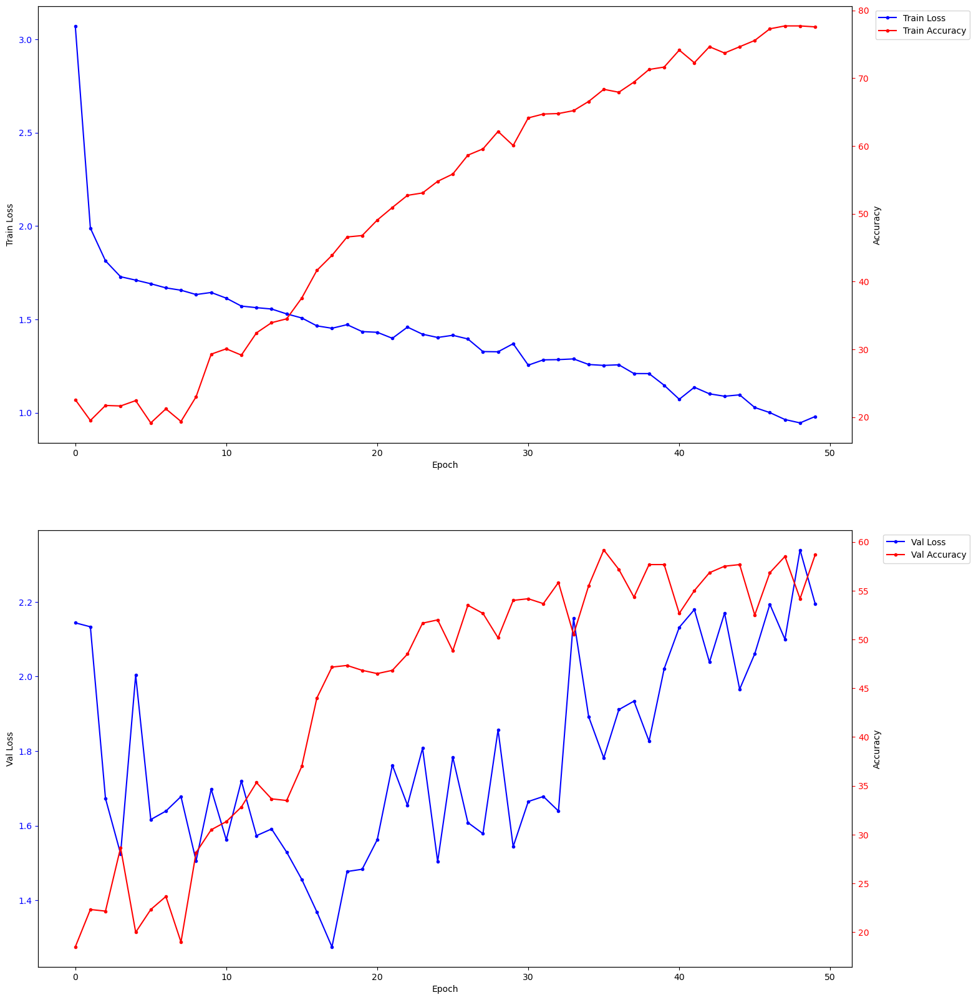

In [118]:
train_model(vision_transformer5, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

Accuracy on the test dataset: 60.4%
[[38 31  2 10  7]
 [38 64  0 11  6]
 [ 2  1 64 12 15]
 [ 9  8  8 68  2]
 [15  5 10  6 68]]


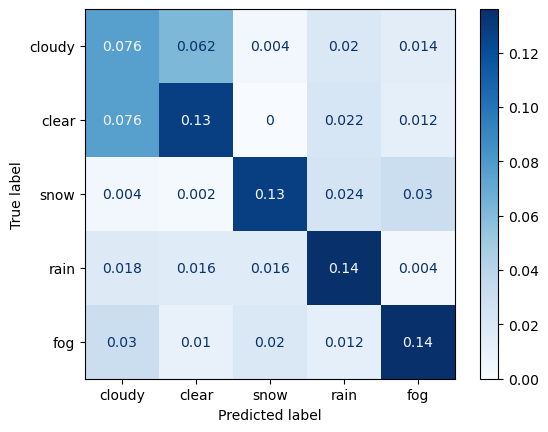

In [119]:
all_preds, all_labels = test_model(vision_transformer5, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [9]:
#r, x, y, z only
torch.cuda.empty_cache()
vision_transformer5 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 4)

data_config = timm.data.resolve_model_data_config(vision_transformer5)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer5 = vision_transformer5.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer5.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 2.9992 train_acc: 20.1429                     
[Epoch:    2] train_loss: 1.9498 train_acc: 20.5714                     
[Epoch:    3] train_loss: 2.1801 train_acc: 20.5000                     
[Epoch:    4] train_loss: 1.9572 train_acc: 20.7143                     
[Epoch:    5] train_loss: 1.8155 train_acc: 18.7857                     
[Epoch:    6] train_loss: 1.7962 train_acc: 19.1429                     
[Epoch:    7] train_loss: 1.7834 train_acc: 20.7857                     
[Epoch:    8] train_loss: 1.7227 train_acc: 20.2857                     
[Epoch:    9] train_loss: 1.6960 train_acc: 20.5000                     
[Epoch:   10] train_loss: 1.6740 train_acc: 18.0714                     
[Epoch:   11] train_loss: 1.6754 train_acc: 17.7857                     
[Epoch:   12] train_loss: 1.6981 train_acc: 19.0000                     
[Epoch:   13] train_loss: 1.6890 train_acc: 22.0714                     
[Epoch:   14] train_loss: 1.6648 train_acc: 18.9286

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[Epoch:   37] train_loss: 1.6208 train_acc: 19.3571                     
[Epoch:   38] train_loss: 1.6220 train_acc: 18.0714                     
[Epoch:   39] train_loss: 1.6193 train_acc: 19.3571                     
[Epoch:   40] train_loss: 1.6186 train_acc: 18.6429                     
[Epoch:   41] train_loss: 1.6123 train_acc: 20.2857                     
[Epoch:   42] train_loss: 1.6174 train_acc: 20.1429                     
[Epoch:   43] train_loss: 1.6179 train_acc: 19.7143                     
[Epoch:   44] train_loss: 1.6123 train_acc: 20.1429                     
[Epoch:   45] train_loss: 1.6190 train_acc: 19.5714                     
[Epoch:   46] train_loss: 1.6171 train_acc: 20.5000                     
[Epoch:   47] train_loss: 1.6147 train_acc: 19.7857                     
[Epoch:   48] train_loss: 1.6149 train_acc: 20.7857                     
[Epoch:   49] train_loss: 1.6143 train_acc: 20.3571                     
[Epoch:   50] train_loss: 1.6157 train_acc: 20.2857

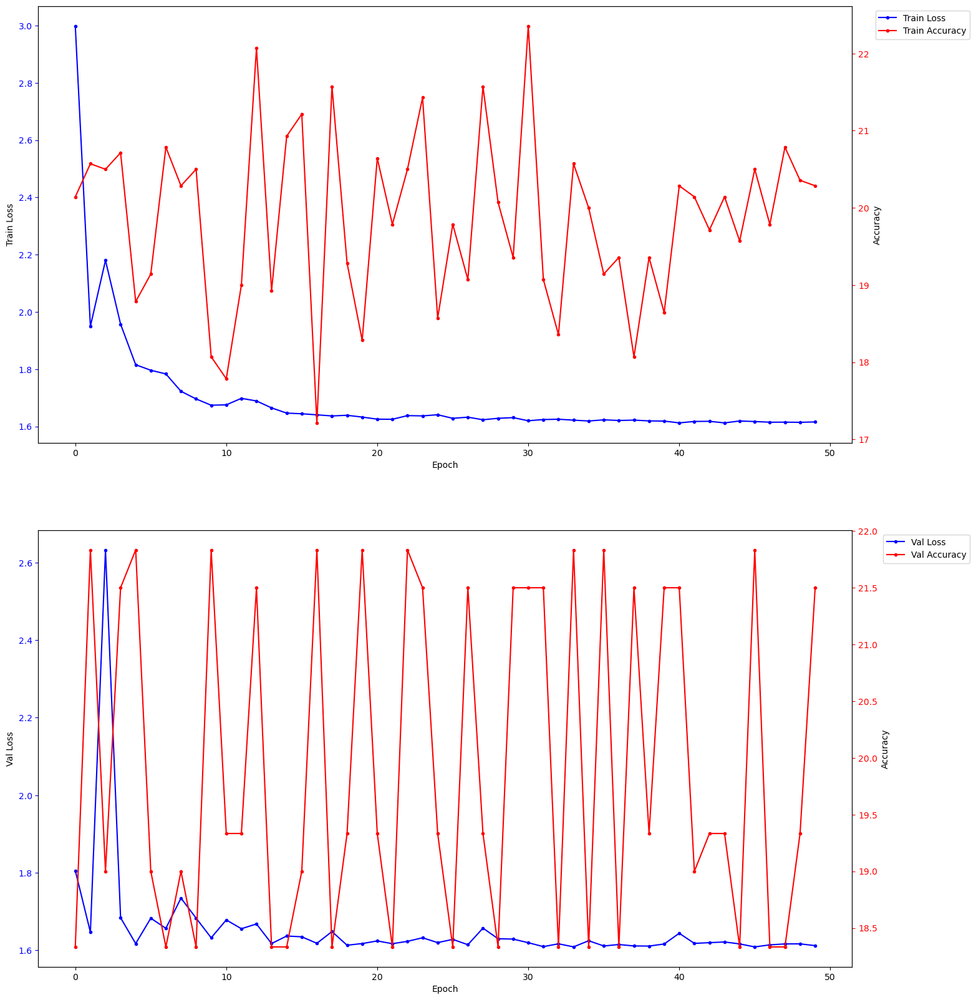

In [12]:
train_model(vision_transformer5, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

Accuracy on the test dataset: 21.0%
[[105   0   0   0   0]
 [ 83   0   0   0   0]
 [102   0   0   0   0]
 [102   0   0   0   0]
 [108   0   0   0   0]]


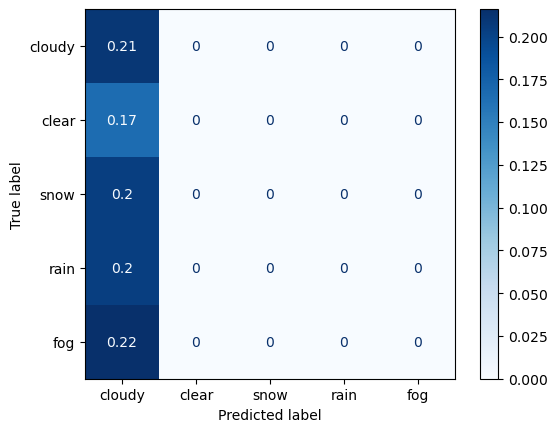

In [13]:
all_preds, all_labels = test_model(vision_transformer5, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [16]:
#i, r, z
torch.cuda.empty_cache()
vision_transformer5 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 3)

data_config = timm.data.resolve_model_data_config(vision_transformer5)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer5 = vision_transformer5.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer5.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 3.0031 train_acc: 21.0000                     
[Epoch:    2] train_loss: 1.9510 train_acc: 19.4286                     
[Epoch:    3] train_loss: 1.7980 train_acc: 18.5000                     
[Epoch:    4] train_loss: 1.7356 train_acc: 21.6429                     
[Epoch:    5] train_loss: 1.7009 train_acc: 19.0000                     
[Epoch:    6] train_loss: 1.6781 train_acc: 21.4286                     
[Epoch:    7] train_loss: 1.6699 train_acc: 21.2857                     
[Epoch:    8] train_loss: 1.6498 train_acc: 21.0714                     
[Epoch:    9] train_loss: 1.6366 train_acc: 24.8571                     
[Epoch:   10] train_loss: 1.6299 train_acc: 27.8571                     
[Epoch:   11] train_loss: 1.5513 train_acc: 34.6429                     
[Epoch:   12] train_loss: 1.5098 train_acc: 34.8571                     
[Epoch:   13] train_loss: 1.5004 train_acc: 37.7857                     
[Epoch:   14] train_loss: 1.4355 train_acc: 38.1429

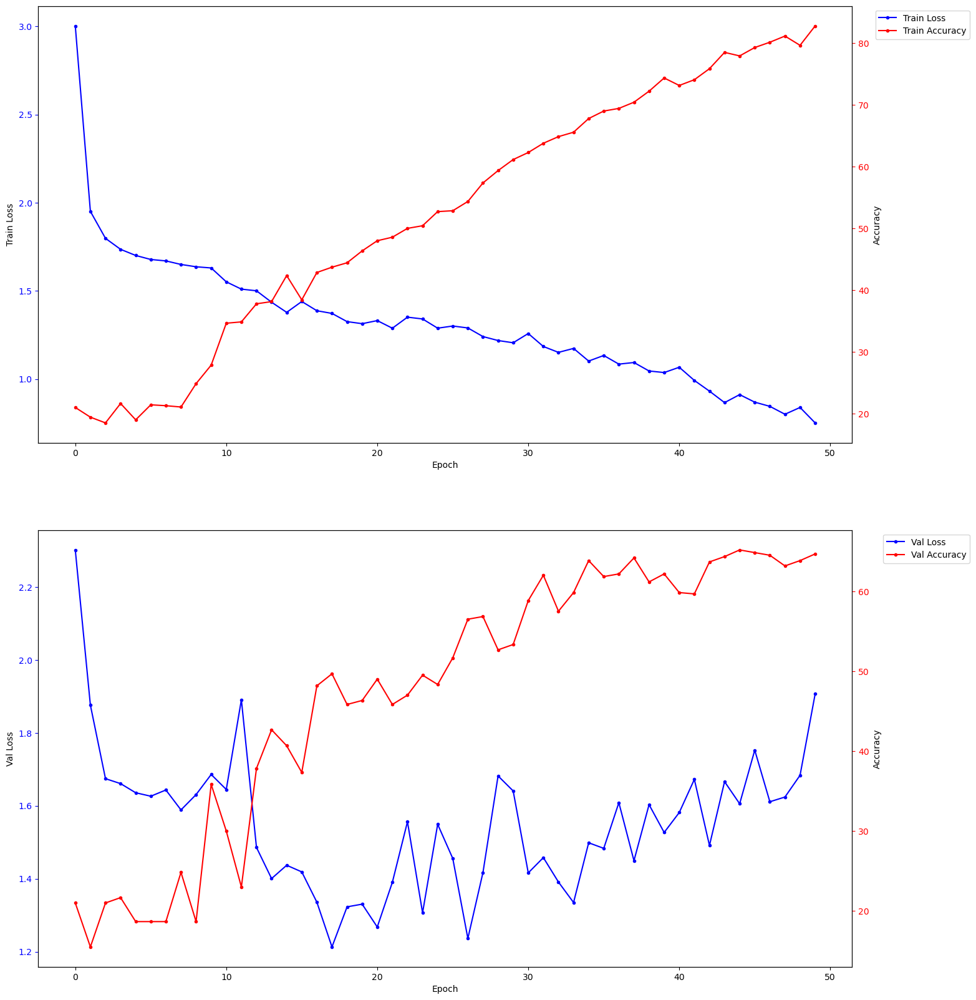

In [17]:
train_model(vision_transformer5, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

Accuracy on the test dataset: 61.6%
[[52 30  0 20  1]
 [23 72  0 10  2]
 [ 1  1 53 27 15]
 [24  7  5 61  2]
 [ 4  1 12  7 70]]


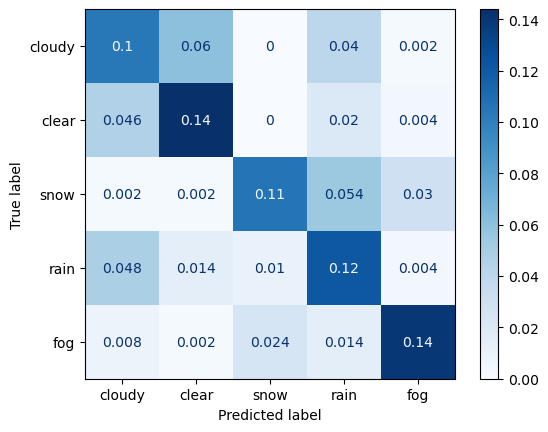

In [18]:
all_preds, all_labels = test_model(vision_transformer5, test_loader)
print_confusion_matrix(all_labels, all_preds)


| Modality                          | Train Acc | Val Acc | Test Acc | Epochs | Num classes |
| -----------------------           | --------- | ------- | -------- | ------ | ------------ |
| LiDAR - i                         | 77.57     | ~59     |60    | 50     | 5            |
| LiDAR - i, r                      | 67.57     | ~43     | 40    | 50     | 5            |
| LiDAR - i, x, y, z                | 76.7      | ~60     | 59.4    | 50     | 5            |
| LiDAR - r, x, y, z                | 20.28      | ~17     | 21    | 50     | 5            |
| LiDAR - i, z                      | 62.5      | ~55     | 50.2    | 50     | 5            |
| LiDAR - i, r, z                   | 82.78      | ~65     | 61.6    | 50     | 5            |
| LiDAR - i, r, x, y, z             | 74.43       | ~68     | 64.6     | 50     | 5            |



### Case 4 : Front view with Enhancement

#### Training done for 50 epochs.
#### Optimizer used - Adagrad with lr - 0.009
#### Training accuracy - 85.41%
#### Test accuracy - 73.39%.

In [115]:
class ResContextBlock(nn.Module):
    def __init__(self, in_filters, out_filters):
        super(ResContextBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_filters, out_filters, kernel_size=(1, 1), stride=1)
        self.act1 = nn.LeakyReLU()

        self.conv2 = nn.Conv2d(out_filters, out_filters, (3,3), padding=1)
        self.act2 = nn.LeakyReLU()
        self.bn1 = nn.BatchNorm2d(out_filters)

        self.conv3 = nn.Conv2d(out_filters, out_filters, (3,3),dilation=2, padding=2)
        self.act3 = nn.LeakyReLU()
        self.bn2 = nn.BatchNorm2d(out_filters)


    def forward(self, x):

        shortcut = self.conv1(x)
        shortcut = self.act1(shortcut)

        resA = self.conv2(shortcut)
        resA = self.act2(resA)
        resA1 = self.bn1(resA)

        resA = self.conv3(resA1)
        resA = self.act3(resA)
        resA2 = self.bn2(resA)

        output = shortcut + resA2
        return output
class VitMaxPro(nn.Module):
        def __init__(self, in_channels, out_channels):
            super(VitMaxPro, self).__init__()

            oc = out_channels
            self.ResContext = ResContextBlock(in_channels, out_channels)
            self.encoder = nn.Sequential(
                nn.Conv2d(oc, oc, kernel_size=(5, 3), stride=(1, 3)),
                nn.ReLU(inplace=True),
                nn.Conv2d(oc, oc, kernel_size=(5, 3), dilation = (3, 1)),
                nn.ReLU(inplace=True),
                nn.BatchNorm2d(oc), 
                nn.ConvTranspose2d(oc, oc, kernel_size = (3, 3), stride = (2, 1), padding = (0, 1)),
                nn.ReLU(inplace=True),
                nn.BatchNorm2d(oc),
                nn.Conv2d(oc, oc, kernel_size = (4, 3), padding = (1, 0))
            )
            self.vit = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = out_channels)
            

        def forward(self, x):
            x = self.ResContext(x)
            x = self.encoder(x)
            x = self.vit(x)

            return x
        

In [116]:
vision_transformer5 = VitMaxPro(5, 64)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer5.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer5.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 2.1143 train_acc: 19.5550                     
[Epoch:    2] train_loss: 1.6669 train_acc: 20.0072                     
[Epoch:    3] train_loss: 1.6351 train_acc: 20.6404                     
[Epoch:    4] train_loss: 1.6298 train_acc: 20.9298                     
[Epoch:    5] train_loss: 1.6248 train_acc: 19.6093                     
[Epoch:    6] train_loss: 1.6220 train_acc: 19.6635                     
[Epoch:    7] train_loss: 1.6197 train_acc: 19.8444                     
[Epoch:    8] train_loss: 1.6196 train_acc: 19.8263                     
[Epoch:    9] train_loss: 1.6179 train_acc: 19.8263                     
[Epoch:   10] train_loss: 1.6158 train_acc: 20.3329                     
[Epoch:   11] train_loss: 1.6160 train_acc: 20.9841                     
[Epoch:   12] train_loss: 1.6131 train_acc: 21.1831                     
[Epoch:   13] train_loss: 1.6107 train_acc: 21.0926                     
[Epoch:   14] train_loss: 1.5656 train_acc: 29.7395

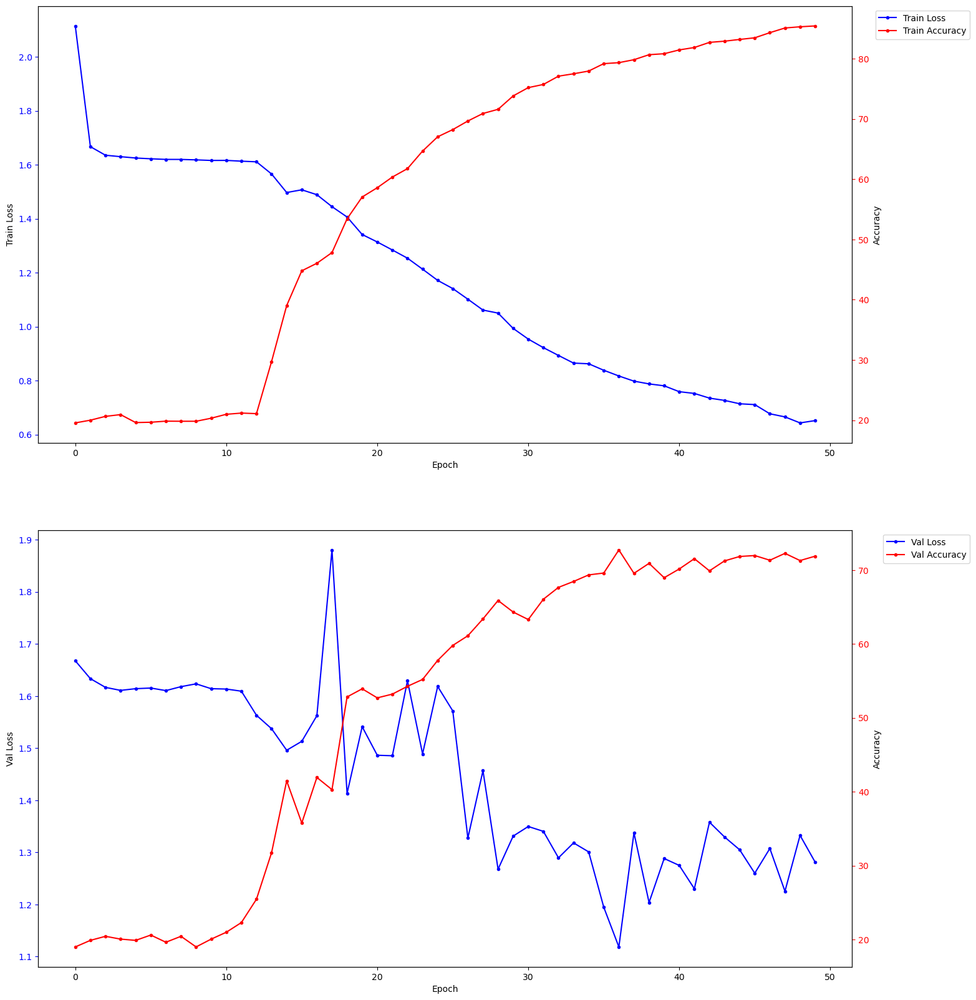

In [117]:
train_model(vision_transformer5, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

In [118]:
torch.save(vision_transformer5.state_dict(), 'Front_no_comp_model.pth')

Accuracy on the test dataset: 73.39077546882919%
[[273  84   1  36   9]
 [ 76 297   1  30   9]
 [  6   3 193  86  66]
 [ 38  20  15 312   8]
 [  7   4  15  11 373]]


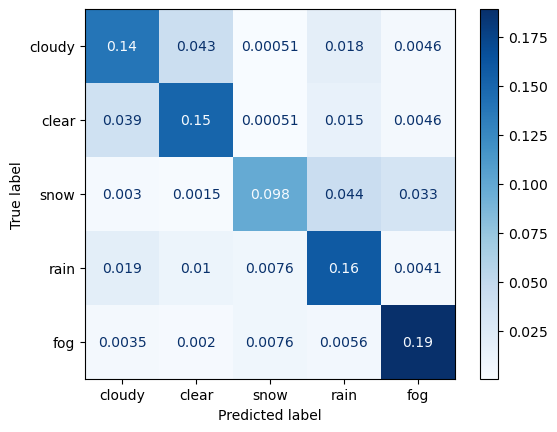

In [119]:
all_preds, all_labels = test_model(vision_transformer5, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [120]:
del vision_transformer5

# LiDAR + RGB

In [7]:
np.ceil((0.5 + (1/6))*2048) - np.floor((0.5 - (1/6))*2048)

684.0

Width - Kernel size = 3, 3, 3; Padding = 0, 0, 0; Stride = 3, 1, 1
Height - kernel size = 5, 5, 4  ; Padding = 0, 0, 1; Stride = 1, 1, 1 Dilation = 1, 3, 1
Height - kernel size = 3; Stride = 2; padding = 1 #transconv 

### Enhancer + ViT 

In [35]:


class ResContextBlock(nn.Module):
    def __init__(self, in_filters, out_filters):
        super(ResContextBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_filters, out_filters, kernel_size=(1, 1), stride=1)
        self.act1 = nn.LeakyReLU()

        self.conv2 = nn.Conv2d(out_filters, out_filters, (3,3), padding=1)
        self.act2 = nn.LeakyReLU()
        self.bn1 = nn.BatchNorm2d(out_filters)

        self.conv3 = nn.Conv2d(out_filters, out_filters, (3,3),dilation=2, padding=2)
        self.act3 = nn.LeakyReLU()
        self.bn2 = nn.BatchNorm2d(out_filters)


    def forward(self, x):

        shortcut = self.conv1(x)
        shortcut = self.act1(shortcut)

        resA = self.conv2(shortcut)
        resA = self.act2(resA)
        resA1 = self.bn1(resA)

        resA = self.conv3(resA1)
        resA = self.act3(resA)
        resA2 = self.bn2(resA)

        output = shortcut + resA2
        return output
class VitMaxPro(nn.Module):
        def __init__(self, in_channels, out_channels):
            super(VitMaxPro, self).__init__()

            oc = out_channels
            self.ResContext = ResContextBlock(in_channels, out_channels)
            self.encoder = nn.Sequential(
                #nn.Conv2d(oc, oc, kernel_size=(3, 3), stride=(1, 3), padding = (1, 2)), #only for PV
                #nn.ReLU(inplace=True),
                nn.Conv2d(oc, oc, kernel_size=(5, 3), stride=(1, 3)),
                nn.ReLU(inplace=True),
                nn.Conv2d(oc, oc, kernel_size=(5, 3), dilation = (3, 1)),
                nn.ReLU(inplace=True),
                nn.BatchNorm2d(oc), 
                nn.ConvTranspose2d(oc, oc, kernel_size = (3, 3), stride = (2, 1), padding = (0, 1)),
                nn.ReLU(inplace=True),
                nn.BatchNorm2d(oc),
                nn.Conv2d(oc, oc, kernel_size = (4, 3), padding = (1, 0))
            )
            self.vit = timm.create_model('vit_large_r50_s32_224', 
                                         pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 67)
            

        def forward(self, x, y):
            x = self.ResContext(x)
            x = self.encoder(x)
            x = torch.cat((x, y), dim = 1)
            x = self.vit(x)

            return x
        



In [5]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
K = VitMaxPro(5, 64)
K.to(device)
print(summary(K, [(5, 128, 2048), (3, 224, 224)]))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1        [-1, 64, 128, 2048]             384
         LeakyReLU-2        [-1, 64, 128, 2048]               0
            Conv2d-3        [-1, 64, 128, 2048]          36,928
         LeakyReLU-4        [-1, 64, 128, 2048]               0
       BatchNorm2d-5        [-1, 64, 128, 2048]             128
            Conv2d-6        [-1, 64, 128, 2048]          36,928
         LeakyReLU-7        [-1, 64, 128, 2048]               0
       BatchNorm2d-8        [-1, 64, 128, 2048]             128
   ResContextBlock-9        [-1, 64, 128, 2048]               0
           Conv2d-10         [-1, 64, 128, 684]          36,928
             ReLU-11         [-1, 64, 128, 684]               0
           Conv2d-12         [-1, 64, 124, 228]          61,504
             ReLU-13         [-1, 64, 124, 228]               0
           Conv2d-14         [-1, 64, 1

### Training function RGB + LiDAR

In [49]:
classes = {'cloudy':0, 'clear':1, 'snow':2, 'rain':3, 'fog':4}
def val_model(model, criterion, val_loader):
    model.to(device)
    model.eval()
    acc_value = []
    
        
    metrics_sum = {}    
        
    with torch.no_grad():    
        for idx, (lidar, images, labels) in enumerate(val_loader):
            lidar, images, labels = lidar.to(device), images.to(device), labels.to(device)
            inputs = torch.cat((lidar, images), dim = 1) #for PV
 
            outputs = model(inputs) #without enhancer
            #outputs = model(lidar, images) #with enhancer
            loss = criterion(outputs, labels)
            metrics = {'val_loss': loss.item(), 
                'val_acc': (outputs.argmax() == labels).cpu().numpy().mean()*100}
            
            
            for k, v in metrics.items():
                metrics_sum.update({k:metrics_sum.get(k,[]) + [v]})
        avg_in_epoch = {k: sum(v)/(len(v)) for k,v in metrics_sum.items()}
                
    return avg_in_epoch
    

def train_model(model, criterion, epochs, optimizer, train_loader, val_loader, batch_size, max_grad_norm = 3.0):
    model.to(device)
    
    plot_values = {'train_acc':[], 'train_loss':[], 'val_acc':[], 'val_loss':[]}
    for epoch in range(epochs):
        model.train()
        metrics_sum = {}
        
        
        
        for idx, (lidar, images, labels) in enumerate(train_loader):
            
            lidar, images, labels = lidar.to(device), images.to(device), labels.to(device)
            #images = images*0 #for 2 stage training
            optimizer.zero_grad()
            #lidar_embedding = model(lidar) #for FV
            #images = torch.cat((lidar_embedding, images), dim = 1) #for FV
            inputs = torch.cat((lidar, images), dim = 1) #for PV
 
            outputs = model(inputs) #without enhancer
            #outputs = model(lidar, images) #with enhancer
            loss = criterion(outputs, labels)
            #print(loss)
            loss.backward()
            metrics = {
                'train_loss': loss.item(), 
                'train_acc': (outputs.argmax() == labels).cpu().numpy().mean()*100}
            nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
            optimizer.step()

            for k, v in metrics.items():
                metrics_sum.update({k:metrics_sum.get(k,[]) + [v]})

            print(f'\r[Epoch: {epoch+1:4d}][{1+idx:4d}/{len(train_loader)/batch_size}]',
              *[f'{k}: {v:.4f},' for k,v in metrics.items()],
              end='\r')
            

        
        print(f'\r[Epoch: {epoch+1:4d}]',
              *[f'{k}: {sum(v)/(len(v)):.4f}' for k,v in metrics_sum.items()],
              ' '*20
             )
        avg_in_epoch = {k: sum(v)/(len(v)) for k,v in metrics_sum.items()}
        avg_in_epoch.update(val_model(model, criterion, val_loader))
        
        for k, v in avg_in_epoch.items():
            plot_values[k].append(v)
        
        
    
    update_live_plot([*range(epochs)], **plot_values);
    
        
def update_live_plot(epochs, **values):
    
    f, ax1 = plt.subplots(nrows = 2, ncols = 1, figsize = (18, 20), sharey=False);
    h1, = ax1[0].plot(epochs, values['train_loss'], 'b-', marker = '.', label = 'Train Loss')
    h2, = ax1[1].plot(epochs, values['val_loss'], 'b-', marker = '.', label = 'Val Loss')
    ax1[0].set_xlabel('Epoch')
    ax1[0].set_ylabel('Train Loss')
    #ax1.set_title('Train vs Val Loss')
    ax1[0].tick_params('y', colors='b')
    
    ax1[1].set_xlabel('Epoch')
    ax1[1].set_ylabel('Val Loss')
    #ax1.set_title('Train vs Val Loss')
    ax1[1].tick_params('y', colors='b')
    
    ax2 = ax1[0].twinx()
    ax3 = ax1[1].twinx()
    h3, = ax2.plot(epochs, values['train_acc'], 'r-',marker = '.', label = 'Train Accuracy')
    h4, = ax3.plot(epochs, values['val_acc'], 'r-',marker = '.', label = 'Val Accuracy')
    ax2.set_ylabel('Accuracy')
    ax2.tick_params('y', colors='r')
    
    ax3.set_ylabel('Accuracy')
    ax3.tick_params('y', colors='r')
    
    ax1[0].legend(handles=[h1,h3], bbox_to_anchor=(1.15, 1))
    ax1[1].legend(handles=[h2,h4], bbox_to_anchor=(1.15, 1))

    plt.subplots_adjust(right=0.85)
    plt.savefig('output_figure.png')
    plt.show();         
def test_model(model,test_loader):
    correct = 0
    total = 0
    all_labels = []
    all_preds = []
    model.to(device)
    model.eval() 
    with torch.no_grad():
        for lidar, images, labels in test_loader:
            lidar, images, labels = lidar.to(device), images.to(device), labels.to(device)
            inputs = torch.cat((lidar, images), dim = 1) #for PV without enhancer
 
            outputs = model(inputs) #without enhancer
            #outputs = model(lidar, images) #with enhancer
            _, predicted = torch.max(outputs, 1)
            total+=labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())
    accuracy = 100 * correct / total
    print(f'Accuracy on the test dataset: {accuracy}%')
    
    return all_preds, all_labels

def print_confusion_matrix(all_labels, all_preds):
    cf = confusion_matrix(all_labels, all_preds)
    print(cf)
    cm_display = ConfusionMatrixDisplay.from_predictions(all_labels, all_preds, 
                                                         display_labels = list(classes.keys()), normalize='all', cmap = 'Blues')
    plt.show()

    '''
    plt.figure(figsize=(8, 6))
    plt.imshow(cf, interpolation="nearest", cmap=plt.get_cmap("Blues"))
    plt.title("Confusion Matrix")
    plt.colorbar()
    tick_marks = list(classes.keys())
    plt.xticks([i for i in range(6)], tick_marks)
    plt.yticks([i for i in range(6)], tick_marks)
    plt.tight_layout()
    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.show()
    '''


In [47]:
def display_test_samples(model, images, labels, max_render=5):
    images = images[:max_render] if len(images) > max_render else images
    fig, axs = plt.subplots(1, len(images), figsize = (5*len(images),5))
    
    for i, (ax, image, label) in enumerate(zip(axs, images, labels)):
        ax.axis('off')
        
        #prediction = model(image)
        #prediction = prediction.argmax()
        #print('predicted label: ', classes_reverse[int(prediction)], end = '')
        #print('\ttrue label: ', classes_reverse[int(label[0])])
        image = image*data_config['std'][0]+data_config['mean'][0]
        ax.imshow(image[0].permute(1, 2, 0).numpy())
        #ax.imshow(image)
        
    plt.tight_layout()

    plt.show()

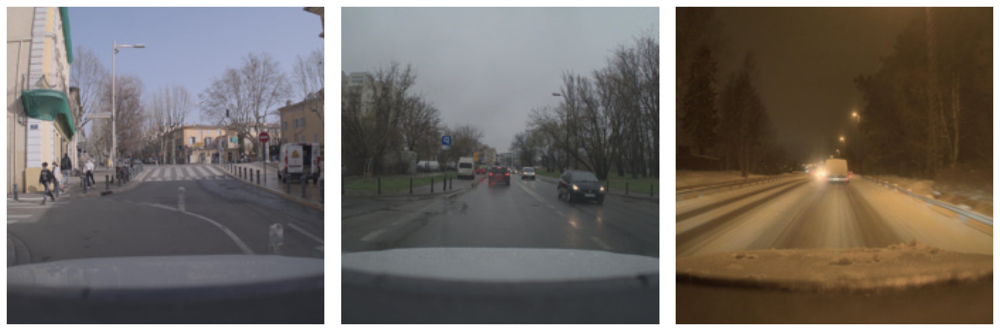

In [48]:

imgs = [*islice(train_loader, 3)]
lidar, images, labels = [*zip(*imgs)]
display_test_samples(vision_transformer7, images, labels, max_render=5)

In [29]:
torch.cuda.empty_cache()
vision_transformer7 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 67)

data_config = timm.data.resolve_model_data_config(vision_transformer7)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer7 = vision_transformer7.to(device)
projector = EnhanceProjection(5, 64)
projector = projector.to(device)
#criterion = nn.CrossEntropyLoss(weight = torch.tensor([*[1.0]*5], dtype=torch.float).to(device))
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(chain(projector.parameters(), vision_transformer7.parameters()), lr = 0.009)

In [10]:
!nvidia-smi

Wed Nov 29 10:37:09 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.199.02   Driver Version: 470.199.02   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  On   | 00000000:02:00.0  On |                  N/A |
| 30%   27C    P8    17W / 350W |      1MiB / 24259MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [7]:
vision_transformer7 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 8)

data_config = timm.data.resolve_model_data_config(vision_transformer7)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)
del vision_transformer7

In [64]:
#Delete wind class 
maps = {'partly-cloudy-night':'cloudy', 'partly-cloudy-day':'cloudy', 'cloudy':'cloudy', 'snow':'snow', 'rain':'rain',
       'clear-night':'clear', 'clear-day':'clear', 'fog':'fog', 'wind':'wind'}

def delete_label(root_dir, label):
    for folder in os.listdir(root_dir):
        folder_path = os.path.join(root_dir, folder)
        annotation_path = os.path.join(folder_path, "metadata.json")
        with open(annotation_path, 'r') as json_file:
                # Load and parse the JSON data
                annotations = json.load(json_file)
                annotations = annotations['scraped_weather']
                annotations = maps[annotations]

        if annotations == label:
            print(f"Moving folder: {folder} with label {annotations}")
            shutil.move(folder_path, "single_frames_lidar/downloads/single_frames_deleted")
    
lidar_dir = "single_frames_lidar/downloads/single_frames_balanced"
delete_label(lidar_dir, 'wind')
     
        

Moving folder: 001985 with label wind
Moving folder: 002113 with label wind
Moving folder: 002209 with label wind
Moving folder: 002907 with label wind
Moving folder: 002910 with label wind
Moving folder: 003017 with label wind
Moving folder: 003588 with label wind
Moving folder: 003679 with label wind
Moving folder: 003873 with label wind
Moving folder: 004036 with label wind
Moving folder: 004151 with label wind
Moving folder: 004892 with label wind
Moving folder: 005283 with label wind
Moving folder: 005332 with label wind
Moving folder: 005849 with label wind
Moving folder: 006328 with label wind
Moving folder: 006369 with label wind
Moving folder: 006913 with label wind
Moving folder: 007027 with label wind
Moving folder: 007280 with label wind
Moving folder: 007854 with label wind
Moving folder: 007997 with label wind
Moving folder: 008094 with label wind
Moving folder: 008413 with label wind
Moving folder: 008735 with label wind
Moving folder: 009496 with label wind
Moving folde

Moving folder: 072539 with label wind
Moving folder: 072654 with label wind
Moving folder: 072691 with label wind
Moving folder: 072911 with label wind
Moving folder: 072914 with label wind
Moving folder: 073039 with label wind
Moving folder: 073082 with label wind
Moving folder: 073216 with label wind
Moving folder: 073283 with label wind
Moving folder: 073357 with label wind
Moving folder: 073427 with label wind
Moving folder: 073807 with label wind
Moving folder: 073868 with label wind
Moving folder: 073917 with label wind
Moving folder: 074048 with label wind
Moving folder: 074269 with label wind
Moving folder: 074498 with label wind
Moving folder: 074569 with label wind
Moving folder: 074615 with label wind
Moving folder: 074629 with label wind
Moving folder: 074631 with label wind
Moving folder: 074637 with label wind
Moving folder: 074854 with label wind
Moving folder: 075057 with label wind
Moving folder: 075072 with label wind
Moving folder: 075151 with label wind
Moving folde

Moving folder: 098324 with label wind
Moving folder: 098515 with label wind
Moving folder: 098560 with label wind
Moving folder: 098685 with label wind
Moving folder: 098728 with label wind
Moving folder: 098877 with label wind
Moving folder: 099051 with label wind
Moving folder: 099184 with label wind
Moving folder: 099410 with label wind
Moving folder: 099670 with label wind
Moving folder: 099970 with label wind
Moving folder: 059823 with label wind
Moving folder: 028937 with label wind
Moving folder: 028433 with label wind
Moving folder: 038832 with label wind
Moving folder: 038980 with label wind
Moving folder: 028600 with label wind
Moving folder: 059252 with label wind
Moving folder: 059596 with label wind
Moving folder: 038447 with label wind
Moving folder: 059640 with label wind
Moving folder: 049429 with label wind
Moving folder: 059692 with label wind
Moving folder: 058852 with label wind
Moving folder: 028294 with label wind
Moving folder: 059658 with label wind
Moving folde

### DataLoader : RGB + LiDAR

In [45]:
dst1 = "single_frames_lidar/downloads/single_frames_balanced" #lidar data
dst2 = "single_frames_balanced" #rgb data
classes = {'cloudy':0, 'clear':1, 'snow':2, 'rain':3, 'fog':4}
classes_reverse = {value:key for key, value in classes.items()}
maps = {'partly-cloudy-night':'cloudy', 'partly-cloudy-day':'cloudy', 'cloudy':'cloudy', 'snow':'snow', 'rain':'rain',
       'clear-night':'clear', 'clear-day':'clear', 'fog':'fog', 'wind':'wind'}
labels = {'cloudy':0, 'clear':0, 'snow':0, 'rain':0, 'fog':0}
middle_x1 = int(np.floor((0.5 - (1/6))*2048))
middle_x2 = int(np.ceil((0.5 + (1/6))*2048))

class Combined_Driving(Dataset):
    def __init__(self, root_dir_rgb, root_dir_lidar, 
                 transforms_rgb = transforms_custom, transforms_lidar = transforms.Compose([transforms.Resize(size=(224, 224), 
                                    interpolation=transforms.InterpolationMode.BICUBIC, max_size=None, antialias=True)])):
        self.root_dir_rgb = root_dir_rgb
        self.root_dir_lidar = root_dir_lidar
        
        self.folders_lidar = os.listdir(self.root_dir_lidar)
        self.folders_lidar = [f for f in self.folders_lidar 
                              if os.path.exists(os.path.join(self.root_dir_lidar, f, "lidar_velodyne"))]
        
        self.folders_rgb = os.listdir(self.root_dir_rgb)
        self.folders_rgb = [f for f in self.folders_rgb if f in os.listdir(self.root_dir_lidar)]
        
        self.transforms_rgb = transforms_rgb
        self.transforms_lidar = transforms_lidar
        self.projections = [self.__returnitem__(i) for i in range(len(self.folders_lidar))]
        self.flip = transforms.RandomHorizontalFlip()
        
        
    def __len__(self):
        return len(self.folders_lidar)
    def __returnitem__(self, idx):
        print(f'Loading index {idx} of {len(self)-1}', end = '\r')
        image_path = os.path.join(self.root_dir_rgb, self.folders_rgb[idx], "camera_front_blur")
        image_path = [image_path+'/'+ f for f in os.listdir(image_path) if os.path.splitext(f)[1]=='.jpg'].pop()
        image = Image.open(image_path).convert("RGB")
        
        lidar_path = os.path.join(self.root_dir_lidar, self.folders_lidar[idx], "lidar_velodyne")
        lidar_file = np.load(os.path.join(lidar_path, os.listdir(lidar_path)[0]))
        lidar_file = np.array([*chain(*lidar_file)]).reshape(len(lidar_file), len(lidar_file[0]))[:, 1:5]
        lidar_file = project(lidar_file)[:, middle_x1:middle_x2+1, :] #front view
        #lidar_file = project(lidar_file) #PV
        lidar_file = torch.tensor(lidar_file).permute(2, 0, 1)
        mean = lidar_file.mean(dim=0, keepdim=True)
        std = lidar_file.std(dim=0, keepdim=True)
        norm_lidar_file = (lidar_file-mean)/(std + 0.0001)
        
        if self.transforms_rgb is not None:
            image = self.transforms_rgb(image)
        if self.transforms_lidar is not None: #without enhancer
            norm_lidar_file = self.transforms_lidar(norm_lidar_file)
        
        
        
        annotation_path = os.path.join(self.root_dir_lidar, self.folders_lidar[idx], "metadata.json")
        with open(annotation_path, 'r') as json_file:
            # Load and parse the JSON data
            annotations = json.load(json_file)
        annotations = annotations['scraped_weather']
        annotations = maps[annotations]
        annotations = classes[annotations]
        annotations = torch.tensor(annotations, dtype=torch.int64)
        #annotations = nn.functional.one_hot(annotations.to(torch.int64), num_classes = 6)
        #return combined_data, annotations
        return norm_lidar_file, image, annotations
    
    def __getitem__(self, idx):
        
        norm_lidar_file, image, annotations = self.projections[idx]
        
        seed = np.random.randint(1<<64-1)
        torch.manual_seed(seed)
        norm_lidar_file = self.flip(norm_lidar_file)
        
        torch.manual_seed(seed)
        image = self.flip(image)
            
        
        return norm_lidar_file, image, annotations
    
        
driving_dataset = Combined_Driving(dst2, dst1)
train_dataset, test_dataset = random_split(driving_dataset, [0.8, 0.2])
train_dataset, val_dataset = random_split(train_dataset, [0.8, 0.2])
train_loader = DataLoader(train_dataset, batch_size = 1, shuffle = True)
test_loader = DataLoader(test_dataset, batch_size = 1, shuffle = True)
val_loader = DataLoader(val_dataset, batch_size = 1, shuffle = True)

In [39]:
test_dataset[0][0].shape

torch.Size([5, 224, 224])

In [46]:
#Lidar - FV+Compression + RGB
vision_transformer7 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 8)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer7 = vision_transformer7.to(device)

data_config = timm.data.resolve_model_data_config(vision_transformer7)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer7.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 2.1847 train_acc: 20.1995                     
[Epoch:    2] train_loss: 1.6875 train_acc: 20.0570                     
[Epoch:    3] train_loss: 1.6393 train_acc: 21.4659                     
[Epoch:    4] train_loss: 1.5575 train_acc: 35.5549                     
[Epoch:    5] train_loss: 1.4769 train_acc: 43.0584                     
[Epoch:    6] train_loss: 1.4544 train_acc: 45.5121                     
[Epoch:    7] train_loss: 1.4524 train_acc: 47.8867                     
[Epoch:    8] train_loss: 1.4170 train_acc: 49.4539                     
[Epoch:    9] train_loss: 1.4005 train_acc: 49.1214                     
[Epoch:   10] train_loss: 1.4106 train_acc: 52.2558                     
[Epoch:   11] train_loss: 1.4129 train_acc: 52.6832                     
[Epoch:   12] train_loss: 1.3882 train_acc: 55.6118                     
[Epoch:   13] train_loss: 1.3892 train_acc: 57.1474                     
[Epoch:   14] train_loss: 1.3713 train_acc: 58.4613

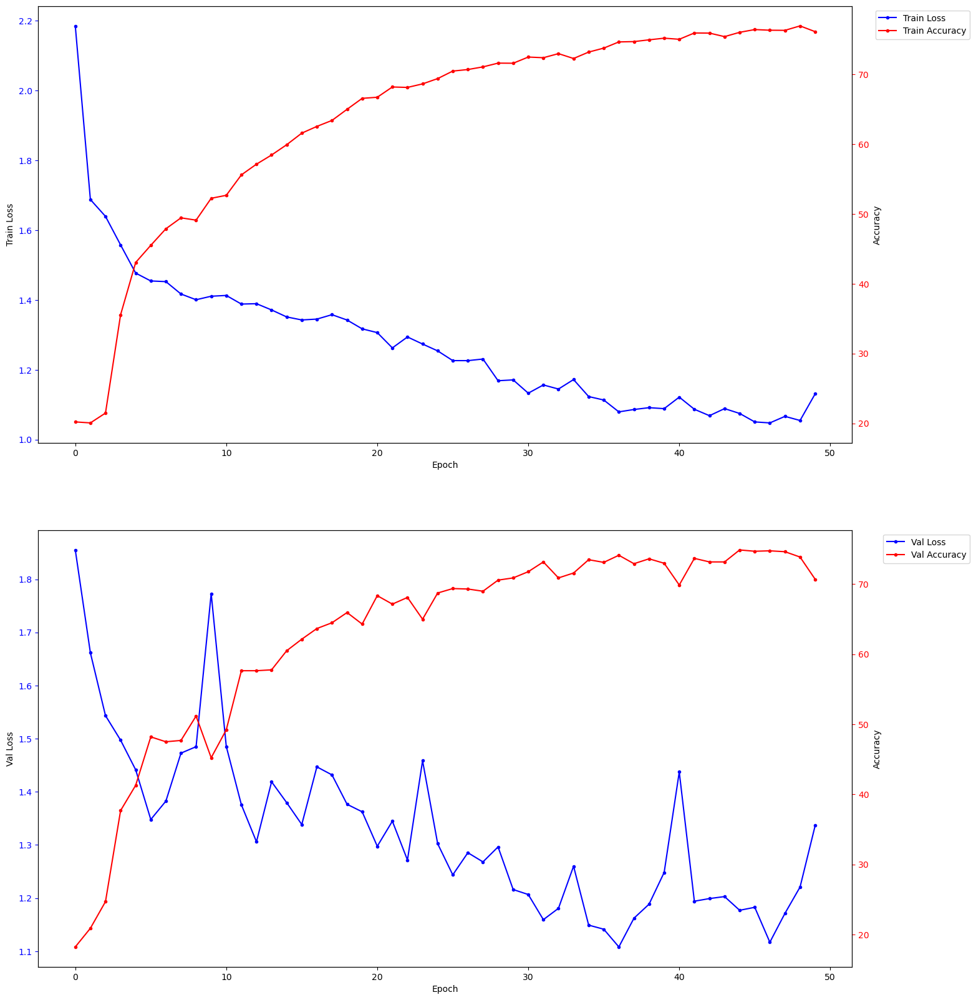

In [47]:
train_model(vision_transformer7, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

Accuracy on the test dataset: 69.38672072985301%
[[228  71   1  68   1]
 [ 69 305   0  29   5]
 [  5   1 207  96  83]
 [ 24  28  12 333   9]
 [  8   5  53  36 296]]


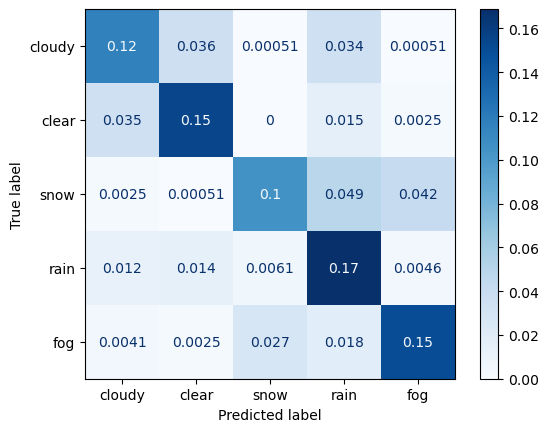

In [50]:
all_preds, all_labels = test_model(vision_transformer7, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [27]:
#Lidar - PV+Compression + RGB
vision_transformer7 = timm.create_model('vit_large_r50_s32_224', pretrained=True, drop_rate = 0.3, num_classes = 5, in_chans = 8)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vision_transformer7 = vision_transformer7.to(device)

data_config = timm.data.resolve_model_data_config(vision_transformer7)
transforms_custom = timm.data.create_transform(**data_config, is_training=False)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(vision_transformer7.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 2.0627 train_acc: 20.1045                     
[Epoch:    2] train_loss: 1.6563 train_acc: 19.4079                     
[Epoch:    3] train_loss: 1.6311 train_acc: 20.8168                     
[Epoch:    4] train_loss: 1.6235 train_acc: 20.2944                     
[Epoch:    5] train_loss: 1.5766 train_acc: 26.1358                     
[Epoch:    6] train_loss: 1.4438 train_acc: 44.5306                     
[Epoch:    7] train_loss: 1.3748 train_acc: 50.5461                     
[Epoch:    8] train_loss: 1.3170 train_acc: 56.1184                     
[Epoch:    9] train_loss: 1.2573 train_acc: 61.3424                     
[Epoch:   10] train_loss: 1.1929 train_acc: 65.3000                     
[Epoch:   11] train_loss: 1.1397 train_acc: 67.6587                     
[Epoch:   12] train_loss: 1.1076 train_acc: 69.9541                     
[Epoch:   13] train_loss: 1.0480 train_acc: 71.9645                     
[Epoch:   14] train_loss: 1.0280 train_acc: 72.7719

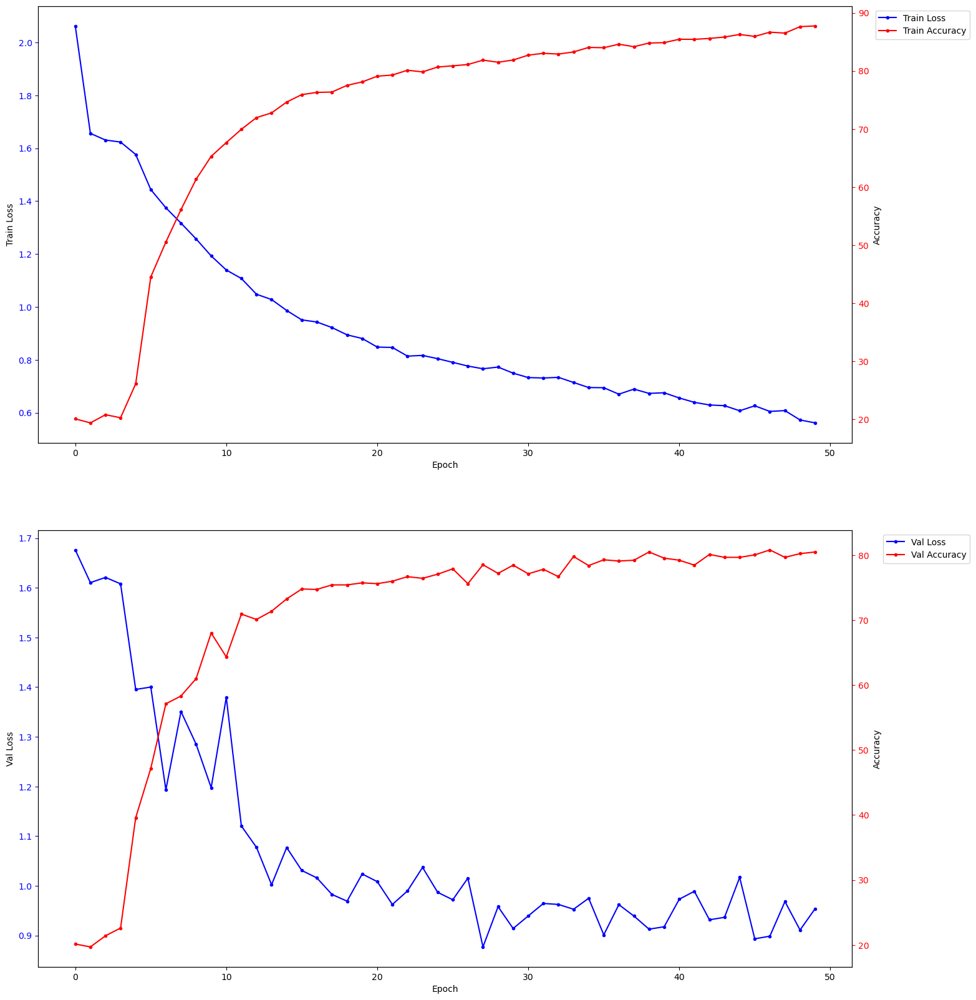

In [28]:
train_model(vision_transformer7, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

Accuracy on the test dataset: 81.39888494678155%
[[345  35   1  25   1]
 [ 55 323   1   4   4]
 [  3   1 277  40  61]
 [ 17   2  25 346   2]
 [  3   3  72  12 315]]


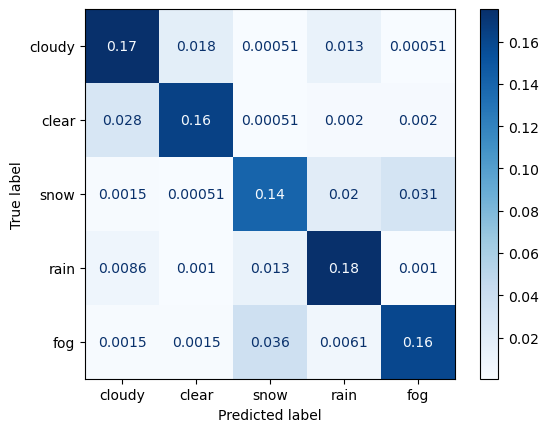

In [31]:
all_preds, all_labels = test_model(vision_transformer7, test_loader)
print_confusion_matrix(all_labels, all_preds)

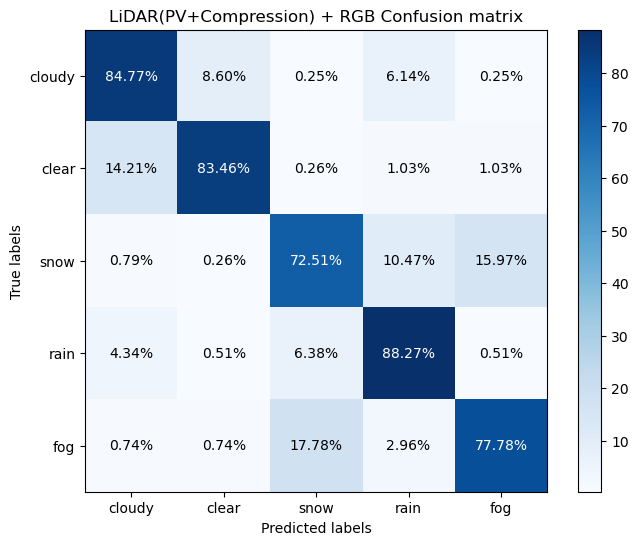

In [33]:
confusion_matrix_values = np.array([
 [345,  35,   1,  25,   1],
 [ 55, 323,   1,  4,   4],
 [  3,   1, 277,  40,  61],
 [ 17,   2,  25, 346,   2],
 [  3,   3,  72,   12, 315]
])
create_cf(confusion_matrix_values, 'LiDAR(PV+Compression) + RGB Confusion matrix')

In [9]:
#lidar - PV+Enhancement + RGB - stage 1
torch.cuda.empty_cache()
lidar_rgb_model = VitMaxPro(5, 64)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
lidar_rgb_model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(lidar_rgb_model.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 2.0761 train_acc: 21.5767                     
[Epoch:    2] train_loss: 1.6585 train_acc: 20.4686                     
[Epoch:    3] train_loss: 1.6325 train_acc: 20.4211                     
[Epoch:    4] train_loss: 1.5525 train_acc: 30.7899                     
[Epoch:    5] train_loss: 1.4579 train_acc: 36.5838                     
[Epoch:    6] train_loss: 1.3487 train_acc: 43.3117                     
[Epoch:    7] train_loss: 1.2831 train_acc: 51.7018                     
[Epoch:    8] train_loss: 1.3151 train_acc: 54.3454                     
[Epoch:    9] train_loss: 1.3293 train_acc: 56.1026                     
[Epoch:   10] train_loss: 1.2910 train_acc: 58.7779                     
[Epoch:   11] train_loss: 1.2730 train_acc: 60.3134                     
[Epoch:   12] train_loss: 1.2435 train_acc: 62.1023                     
[Epoch:   13] train_loss: 1.2192 train_acc: 63.6378                     
[Epoch:   14] train_loss: 1.1944 train_acc: 65.2367

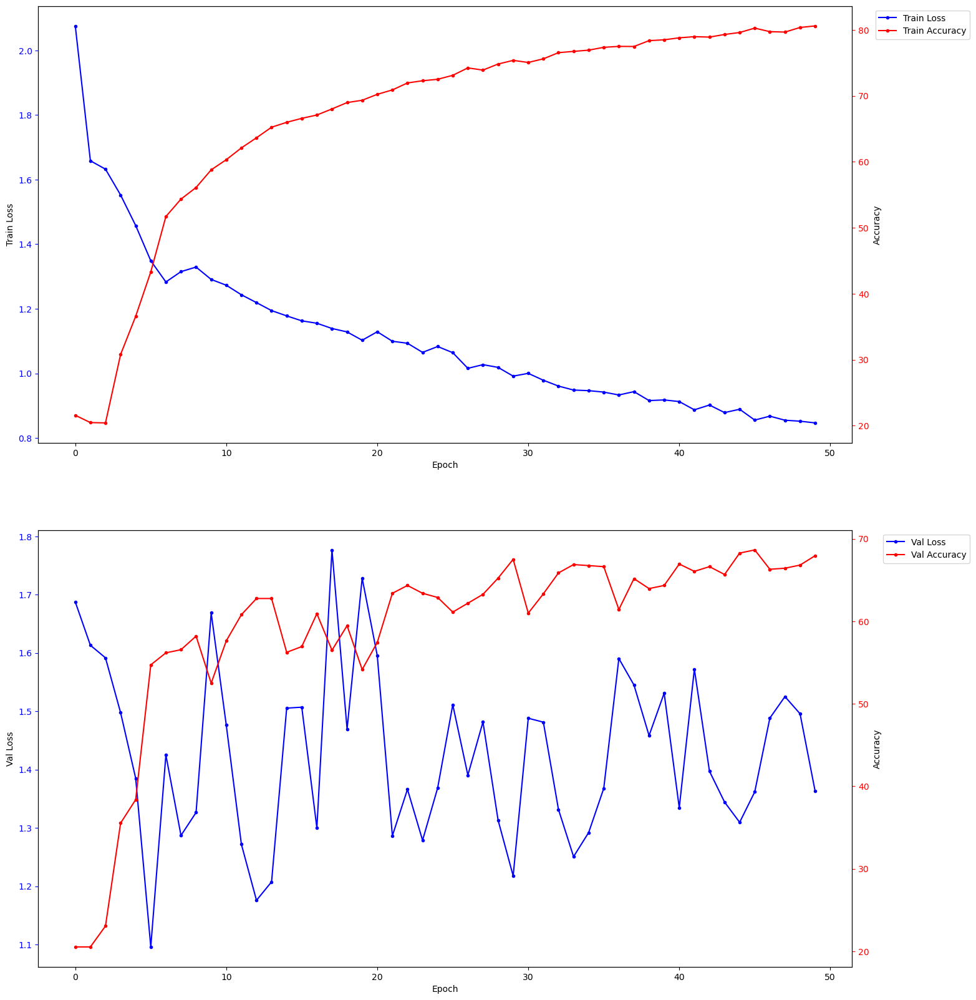

In [10]:
train_model(lidar_rgb_model, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

In [ ]:
all_preds, all_labels = test_model(lidar_rgb_model, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [11]:
classes = {'cloudy':0, 'clear':1, 'snow':2, 'rain':3, 'fog':4}
def val_model(model, criterion, val_loader):
    model.to(device)
    model.eval()
    acc_value = []
    
        
    metrics_sum = {}    
        
    with torch.no_grad():    
        for idx, (lidar, images, labels) in enumerate(val_loader):
            lidar, images, labels = lidar.to(device), images.to(device), labels.to(device)
            #inputs = torch.cat((lidar, images), dim = 1) #for PV
 
            #outputs = model(inputs) #without enhancer
            outputs = model(lidar, images) #with enhancer
            loss = criterion(outputs, labels)
            metrics = {'val_loss': loss.item(), 
                'val_acc': (outputs.argmax() == labels).cpu().numpy().mean()*100}
            
            
            for k, v in metrics.items():
                metrics_sum.update({k:metrics_sum.get(k,[]) + [v]})
        avg_in_epoch = {k: sum(v)/(len(v)) for k,v in metrics_sum.items()}
                
    return avg_in_epoch
    

def train_model(model, criterion, epochs, optimizer, train_loader, val_loader, batch_size, max_grad_norm = 3.0):
    model.to(device)
    
    plot_values = {'train_acc':[], 'train_loss':[], 'val_acc':[], 'val_loss':[]}
    for epoch in range(epochs):
        model.train()
        metrics_sum = {}
        
        
        
        for idx, (lidar, images, labels) in enumerate(train_loader):
            
            lidar, images, labels = lidar.to(device), images.to(device), labels.to(device)
            optimizer.zero_grad()
            #lidar_embedding = model(lidar) #for FV
            #images = torch.cat((lidar_embedding, images), dim = 1) #for FV
            #inputs = torch.cat((lidar, images), dim = 1) #for PV
 
            #outputs = model(inputs) #without enhancer
            outputs = model(lidar, images) #with enhancer
            loss = criterion(outputs, labels)
            #print(loss)
            loss.backward()
            metrics = {
                'train_loss': loss.item(), 
                'train_acc': (outputs.argmax() == labels).cpu().numpy().mean()*100}
            nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
            optimizer.step()

            for k, v in metrics.items():
                metrics_sum.update({k:metrics_sum.get(k,[]) + [v]})

            print(f'\r[Epoch: {epoch+1:4d}][{1+idx:4d}/{len(train_loader)/batch_size}]',
              *[f'{k}: {v:.4f},' for k,v in metrics.items()],
              end='\r')
            

        
        print(f'\r[Epoch: {epoch+1:4d}]',
              *[f'{k}: {sum(v)/(len(v)):.4f}' for k,v in metrics_sum.items()],
              ' '*20
             )
        avg_in_epoch = {k: sum(v)/(len(v)) for k,v in metrics_sum.items()}
        avg_in_epoch.update(val_model(model, criterion, val_loader))
        
        for k, v in avg_in_epoch.items():
            plot_values[k].append(v)
        
        
    
    update_live_plot([*range(epochs)], **plot_values);
    
        
def update_live_plot(epochs, **values):
    
    f, ax1 = plt.subplots(nrows = 2, ncols = 1, figsize = (18, 20), sharey=False);
    h1, = ax1[0].plot(epochs, values['train_loss'], 'b-', marker = '.', label = 'Train Loss')
    h2, = ax1[1].plot(epochs, values['val_loss'], 'b-', marker = '.', label = 'Val Loss')
    ax1[0].set_xlabel('Epoch')
    ax1[0].set_ylabel('Train Loss')
    #ax1.set_title('Train vs Val Loss')
    ax1[0].tick_params('y', colors='b')
    
    ax1[1].set_xlabel('Epoch')
    ax1[1].set_ylabel('Val Loss')
    #ax1.set_title('Train vs Val Loss')
    ax1[1].tick_params('y', colors='b')
    
    ax2 = ax1[0].twinx()
    ax3 = ax1[1].twinx()
    h3, = ax2.plot(epochs, values['train_acc'], 'r-',marker = '.', label = 'Train Accuracy')
    h4, = ax3.plot(epochs, values['val_acc'], 'r-',marker = '.', label = 'Val Accuracy')
    ax2.set_ylabel('Accuracy')
    ax2.tick_params('y', colors='r')
    
    ax3.set_ylabel('Accuracy')
    ax3.tick_params('y', colors='r')
    
    ax1[0].legend(handles=[h1,h3], bbox_to_anchor=(1.15, 1))
    ax1[1].legend(handles=[h2,h4], bbox_to_anchor=(1.15, 1))

    plt.subplots_adjust(right=0.85)
    plt.savefig('output_figure.png')
    plt.show();         
def test_model(model,test_loader):
    correct = 0
    total = 0
    all_labels = []
    all_preds = []
    model.to(device)
    model.eval() 
    with torch.no_grad():
        for lidar, images, labels in test_loader:
            lidar, images, labels = lidar.to(device), images.to(device), labels.to(device)
            #inputs = torch.cat((lidar, images), dim = 1) #for PV without enhancer
 
            #outputs = model(inputs) #without enhancer
            outputs = model(lidar, images) #with enhancer
            _, predicted = torch.max(outputs, 1)
            total+=labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())
    accuracy = 100 * correct / total
    print(f'Accuracy on the test dataset: {accuracy}%')
    
    return all_preds, all_labels

def print_confusion_matrix(all_labels, all_preds):
    cf = confusion_matrix(all_labels, all_preds)
    print(cf)
    cm_display = ConfusionMatrixDisplay.from_predictions(all_labels, all_preds, 
                                                         display_labels = list(classes.keys()), normalize='all', cmap = 'Blues')
    plt.show()

    '''
    plt.figure(figsize=(8, 6))
    plt.imshow(cf, interpolation="nearest", cmap=plt.get_cmap("Blues"))
    plt.title("Confusion Matrix")
    plt.colorbar()
    tick_marks = list(classes.keys())
    plt.xticks([i for i in range(6)], tick_marks)
    plt.yticks([i for i in range(6)], tick_marks)
    plt.tight_layout()
    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.show()
    '''


In [12]:
#lidar - PV+Enhancement + RGB - stage 2

optimizer = torch.optim.Adagrad(lidar_rgb_model.vit.parameters(), lr = 0.009)

[Epoch:    1] train_loss: 1.4538 train_acc: 43.4067                     
[Epoch:    2] train_loss: 1.0996 train_acc: 73.7692                     
[Epoch:    3] train_loss: 1.0137 train_acc: 76.1121                     
[Epoch:    4] train_loss: 0.9639 train_acc: 77.4418                     
[Epoch:    5] train_loss: 0.9282 train_acc: 77.2835                     
[Epoch:    6] train_loss: 0.9030 train_acc: 78.1067                     
[Epoch:    7] train_loss: 0.8822 train_acc: 79.0723                     
[Epoch:    8] train_loss: 0.8694 train_acc: 79.1515                     
[Epoch:    9] train_loss: 0.8596 train_acc: 79.3098                     
[Epoch:   10] train_loss: 0.8796 train_acc: 79.5631                     
[Epoch:   11] train_loss: 0.8589 train_acc: 80.1330                     
[Epoch:   12] train_loss: 0.8495 train_acc: 80.2438                     
[Epoch:   13] train_loss: 0.8341 train_acc: 80.4179                     
[Epoch:   14] train_loss: 0.8237 train_acc: 80.7187

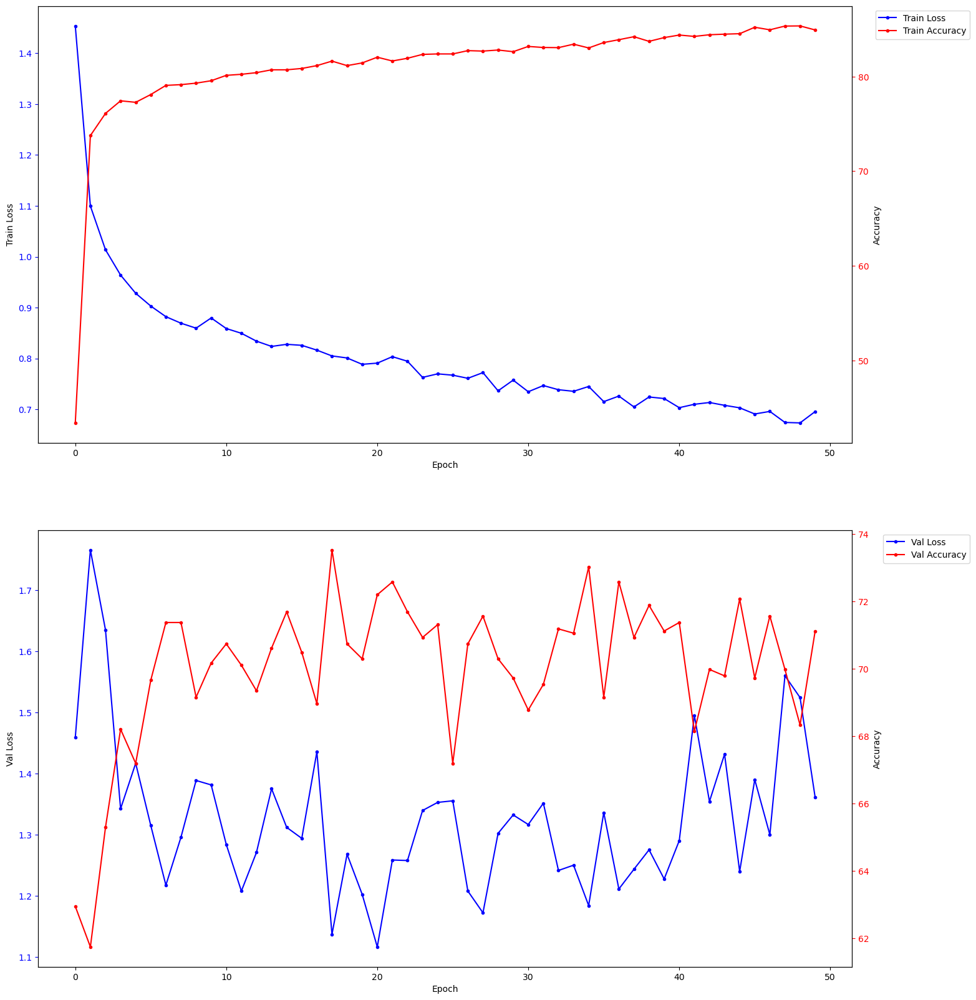

In [13]:
train_model(lidar_rgb_model, criterion, 50, optimizer, train_loader, val_loader, batch_size = 1)

Accuracy on the test dataset: 71.51545869234668%
[[305  46   6  33   1]
 [ 96 291   1  16   1]
 [  7   1 212  55  88]
 [ 20   9  28 317  32]
 [ 12  20  69  21 286]]


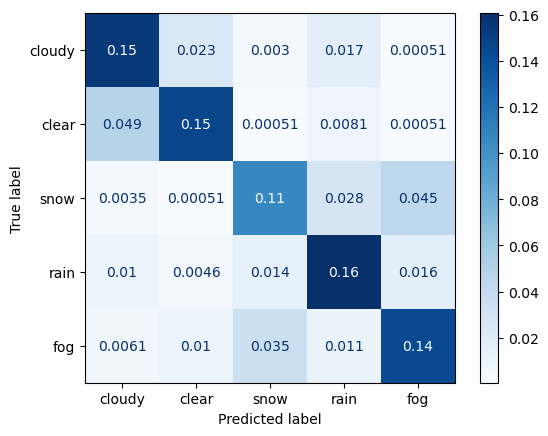

In [14]:
all_preds, all_labels = test_model(lidar_rgb_model, test_loader)
print_confusion_matrix(all_labels, all_preds)

In [15]:
torch.save(lidar_rgb_model.state_dict(), '2_stage_model.pth')

In [16]:
len(test_dataset)

1973

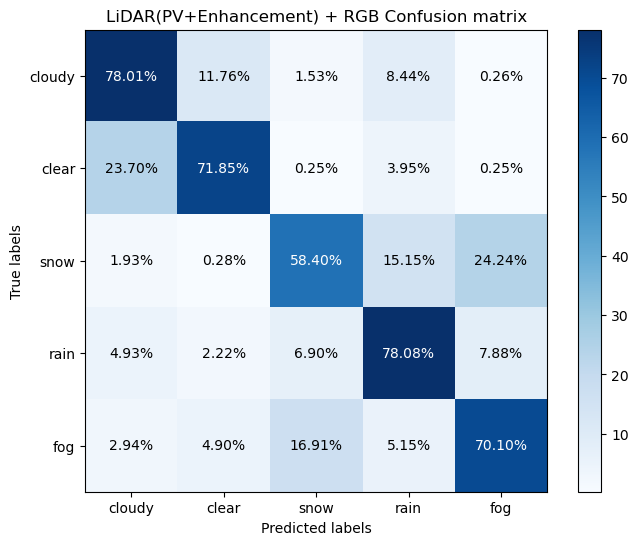

In [34]:
confusion_matrix_values = np.array([
 [305,  46,   6,  33,   1],
 [ 96, 291,   1,  16,   1],
 [  7,   1, 212,  55,  88],
 [ 20,   9,  28, 317,   32],
 [  12,   20,  69,   21, 286]
])
create_cf(confusion_matrix_values, 'LiDAR(PV+Enhancement) + RGB Confusion matrix')

In [24]:
torch.cuda.empty_cache()
lidar_rgb_model = VitMaxPro(5, 64)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
lidar_rgb_model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adagrad(lidar_rgb_model.parameters(), lr = 0.009)

In [ ]:
## Lidar (Panaromic view with enhancement) + rgb

[Epoch:    1] train_loss: 2.0740 Accuracy: 0.2035                     
[Epoch:    2] train_loss: 1.6518 Accuracy: 0.2040                     
[Epoch:    3] train_loss: 1.6325 Accuracy: 0.2001                     
[Epoch:    4] train_loss: 1.6168 Accuracy: 0.2261                     
[Epoch:    5] train_loss: 1.5807 Accuracy: 0.2628                     
[Epoch:    6] train_loss: 1.5218 Accuracy: 0.3365                     
[Epoch:    7] train_loss: 1.5179 Accuracy: 0.3608                     
[Epoch:    8] train_loss: 1.5076 Accuracy: 0.3970                     
[Epoch:    9] train_loss: 1.5057 Accuracy: 0.4694                     
[Epoch:   10] train_loss: 1.4904 Accuracy: 0.5256                     
[Epoch:   11] train_loss: 1.4769 Accuracy: 0.5556                     
[Epoch:   12] train_loss: 1.4294 Accuracy: 0.5688                     
[Epoch:   13] train_loss: 1.3701 Accuracy: 0.5818                     
[Epoch:   14] train_loss: 1.3574 Accuracy: 0.6030                     
[Epoch

[Epoch:  117] train_loss: 0.6172 Accuracy: 0.8742                     
[Epoch:  118] train_loss: 0.6007 Accuracy: 0.8793                     
[Epoch:  119] train_loss: 0.6085 Accuracy: 0.8797                     
[Epoch:  120] train_loss: 0.6141 Accuracy: 0.8778                     
[Epoch:  121] train_loss: 0.6026 Accuracy: 0.8829                     
[Epoch:  122] train_loss: 0.5998 Accuracy: 0.8820                     
[Epoch:  123] train_loss: 0.5985 Accuracy: 0.8831                     
[Epoch:  124] train_loss: 0.6205 Accuracy: 0.8785                     
[Epoch:  125] train_loss: 0.5830 Accuracy: 0.8854                     
[Epoch:  126] train_loss: 0.5819 Accuracy: 0.8874                     
[Epoch:  127] train_loss: 0.5670 Accuracy: 0.8898                     
[Epoch:  128] train_loss: 0.5577 Accuracy: 0.8931                     
[Epoch:  129] train_loss: 0.5896 Accuracy: 0.8870                     
[Epoch:  130] train_loss: 0.5474 Accuracy: 0.8951                     
[Epoch

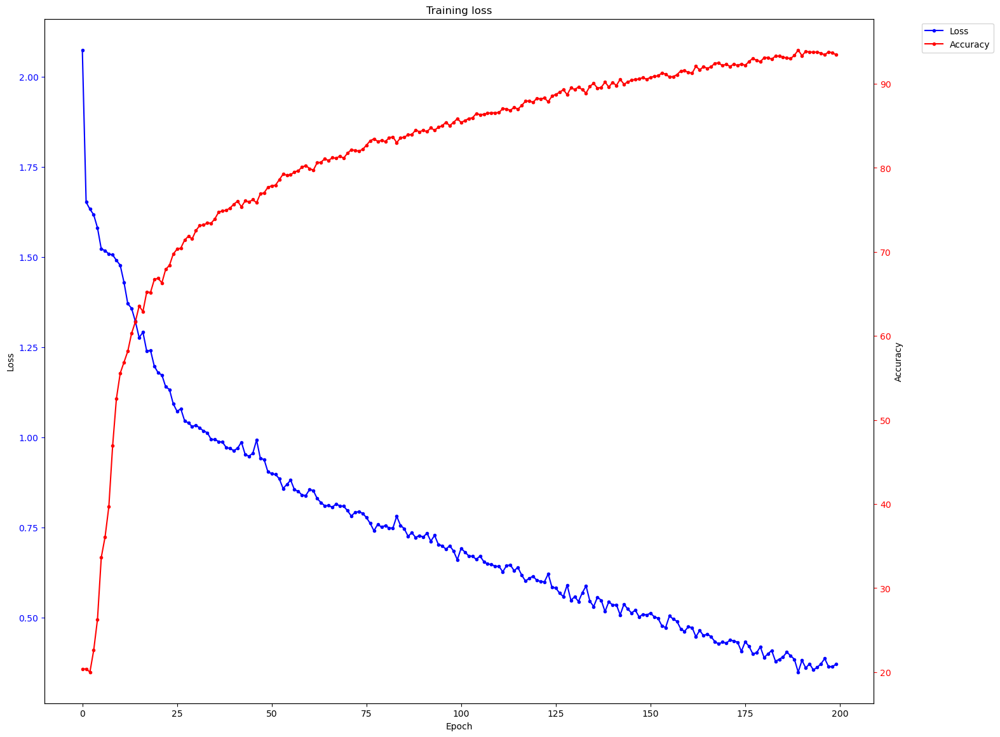

In [32]:
train_model(vision_transformer7, projector, criterion, 200, optimizer, train_loader, batch_size = 1)

In [33]:
torch.save(vision_transformer7.state_dict(), 'custom_vit8_model.pth')

In [34]:
torch.save(projector.state_dict(), 'projector.pth')

Accuracy on the test dataset: 75.21540800810948%
[[271  84   9  44   0]
 [ 39 307   9  12   9]
 [  5   3 279  53  33]
 [ 34  12  58 284   8]
 [  1   2  52  22 343]]


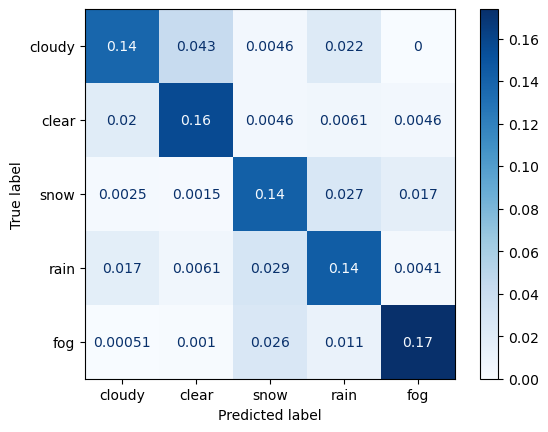

In [35]:
all_preds, all_labels = test_model(vision_transformer7, projector, test_loader)
print_confusion_matrix(all_labels, all_preds)

[Epoch:    1] train_loss: 0.3622 Accuracy: 0.9379                     
[Epoch:    2] train_loss: 0.3479 Accuracy: 0.9415                     
[Epoch:    3] train_loss: 0.3641 Accuracy: 0.9372                     
[Epoch:    4] train_loss: 0.3277 Accuracy: 0.9453                     
[Epoch:    5] train_loss: 0.3491 Accuracy: 0.9430                     
[Epoch:    6] train_loss: 0.3505 Accuracy: 0.9396                     
[Epoch:    7] train_loss: 0.3227 Accuracy: 0.9429                     
[Epoch:    8] train_loss: 0.3654 Accuracy: 0.9369                     
[Epoch:    9] train_loss: 0.3252 Accuracy: 0.9431                     
[Epoch:   10] train_loss: 0.3360 Accuracy: 0.9429                     
[Epoch:   11] train_loss: 0.3315 Accuracy: 0.9435                     
[Epoch:   12] train_loss: 0.3469 Accuracy: 0.9407                     
[Epoch:   13] train_loss: 0.3433 Accuracy: 0.9412                     
[Epoch:   14] train_loss: 0.3203 Accuracy: 0.9445                     
[Epoch

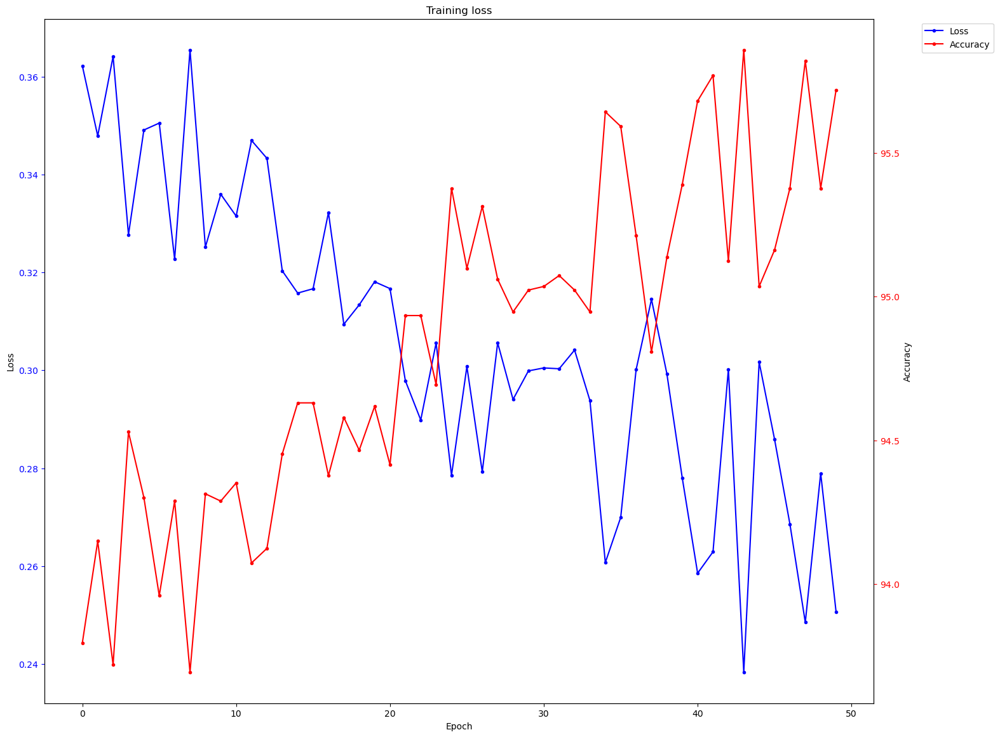

In [36]:
train_model(vision_transformer7, projector, criterion, 50, optimizer, train_loader, batch_size = 1)

Accuracy on the test dataset: 73.84693360364926%
[[268  92   6  41   1]
 [ 40 311   4  10  11]
 [  4   7 252  62  48]
 [ 45  22  51 269   9]
 [  2   3  36  22 357]]


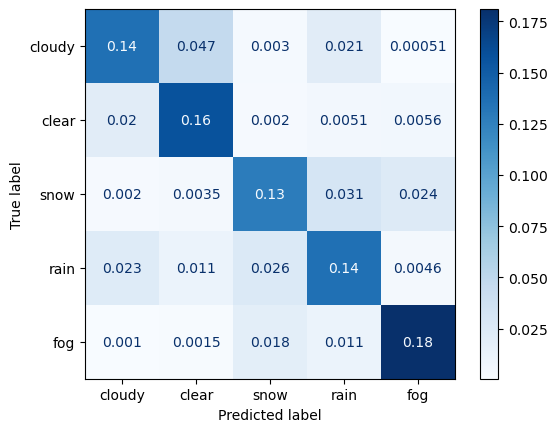

In [37]:
all_preds, all_labels = test_model(vision_transformer7, projector, test_loader)
print_confusion_matrix(all_labels, all_preds)

[Epoch:    1] train_loss: 0.2533 Accuracy: 0.9583                     
[Epoch:    2] train_loss: 0.2374 Accuracy: 0.9606                     
[Epoch:    3] train_loss: 0.2432 Accuracy: 0.9597                     
[Epoch:    4] train_loss: 0.2428 Accuracy: 0.9588                     
[Epoch:    5] train_loss: 0.2347 Accuracy: 0.9630                     
[Epoch:    6] train_loss: 0.2420 Accuracy: 0.9610                     
[Epoch:    7] train_loss: 0.2518 Accuracy: 0.9605                     
[Epoch:    8] train_loss: 0.2380 Accuracy: 0.9624                     
[Epoch:    9] train_loss: 0.2109 Accuracy: 0.9663                     
[Epoch:   10] train_loss: 0.2233 Accuracy: 0.9645                     
[Epoch:   11] train_loss: 0.2523 Accuracy: 0.9601                     
[Epoch:   12] train_loss: 0.2613 Accuracy: 0.9582                     
[Epoch:   13] train_loss: 0.2360 Accuracy: 0.9635                     
[Epoch:   14] train_loss: 0.2338 Accuracy: 0.9620                     
[Epoch

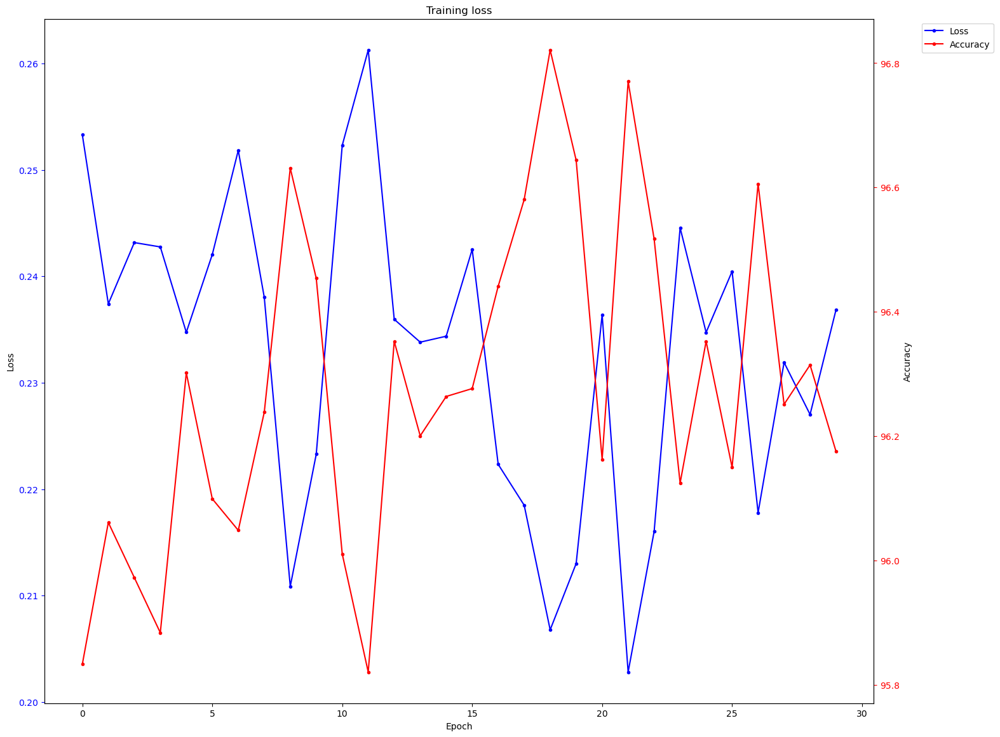

In [38]:
train_model(vision_transformer7, projector, criterion, 30, optimizer, train_loader, batch_size = 1)

Accuracy on the test dataset: 73.99898631525596%
[[260  85   9  53   1]
 [ 43 308   4  11  10]
 [  6   6 261  54  46]
 [ 33  16  58 280   9]
 [  1   2  40  26 351]]


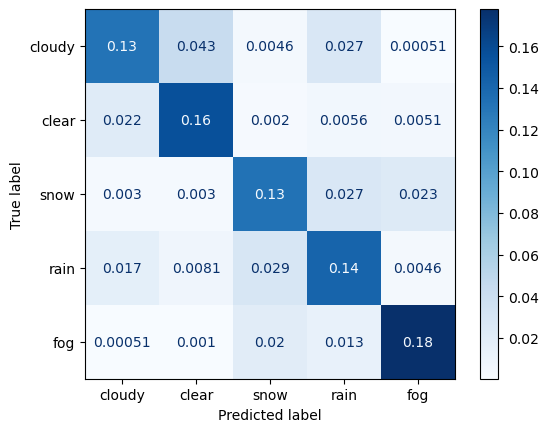

In [39]:
all_preds, all_labels = test_model(vision_transformer7, projector, test_loader)
print_confusion_matrix(all_labels, all_preds)

[Epoch:    1] train_loss: 0.2373 Accuracy: 0.9628                     
[Epoch:    2] train_loss: 0.2119 Accuracy: 0.9676                     
[Epoch:    3] train_loss: 0.2348 Accuracy: 0.9631                     
[Epoch:    4] train_loss: 0.2231 Accuracy: 0.9638                     
[Epoch:    5] train_loss: 0.2213 Accuracy: 0.9653                     
[Epoch:    6] train_loss: 0.2292 Accuracy: 0.9643                     
[Epoch:    7] train_loss: 0.1981 Accuracy: 0.9680                     
[Epoch:    8] train_loss: 0.2149 Accuracy: 0.9673                     
[Epoch:    9] train_loss: 0.2016 Accuracy: 0.9683                     
[Epoch:   10] train_loss: 0.2075 Accuracy: 0.9672                     
[Epoch:   11] train_loss: 0.2137 Accuracy: 0.9653                     
[Epoch:   12] train_loss: 0.2294 Accuracy: 0.9637                     
[Epoch:   13] train_loss: 0.2016 Accuracy: 0.9695                     
[Epoch:   14] train_loss: 0.2013 Accuracy: 0.9687                     
[Epoch

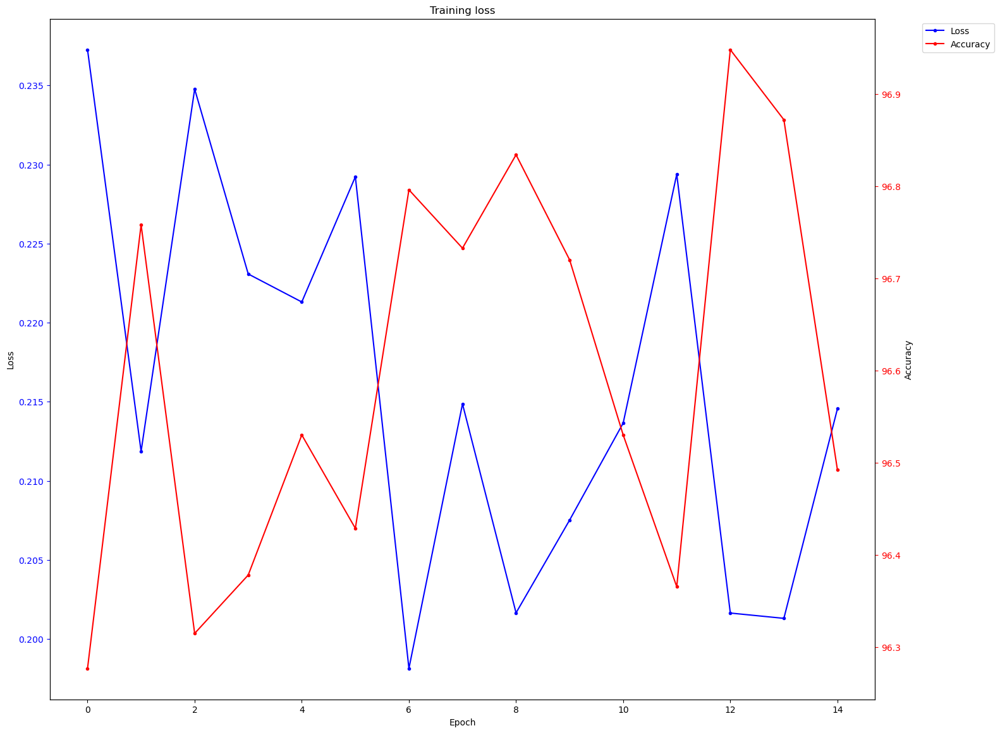

In [40]:
train_model(vision_transformer7, projector, criterion, 15, optimizer, train_loader, batch_size = 1)

Accuracy on the test dataset: 74.55651292448049%
[[263  82   4  58   1]
 [ 47 304   4  12   9]
 [  5   6 250  61  51]
 [ 39  17  41 286  13]
 [  1   2  26  23 368]]


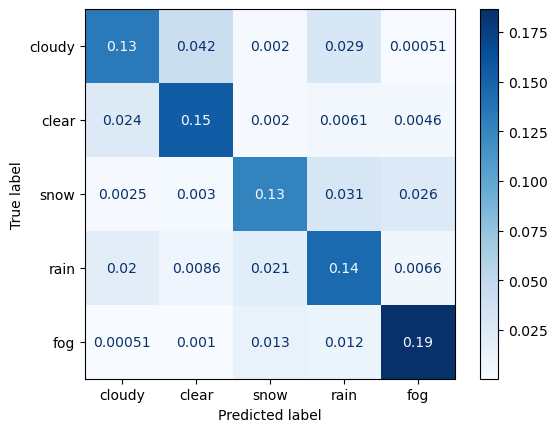

In [41]:
all_preds, all_labels = test_model(vision_transformer7, projector, test_loader)
print_confusion_matrix(all_labels, all_preds)

Accuracy on the test dataset: 84.26911907066795%
[[363  55   1  18   0   1]
 [ 27 374   2   1   1   2]
 [  1   1 269  32  36   7]
 [ 23   9  30 312   6   2]
 [  1   0  32   5 357   6]
 [  1  12   7   3   3  66]]


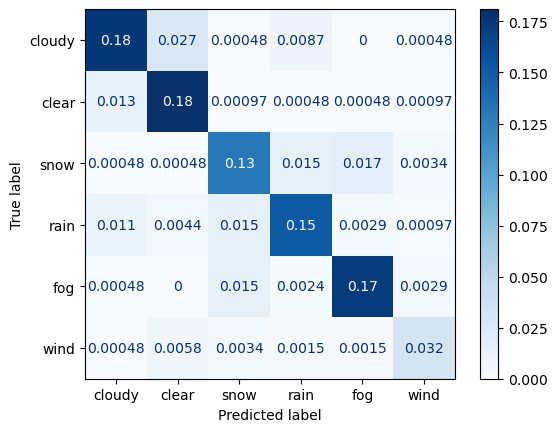

In [21]:
all_preds, all_labels = test_model(vision_transformer7, test_loader)
print_confusion_matrix(all_labels, all_preds)

[Epoch:    1] train_loss: 0.2684 Accuracy: 0.9504                     
[Epoch:    2] train_loss: 0.2608 Accuracy: 0.9502                     
[Epoch:    3] train_loss: 0.2562 Accuracy: 0.9504                     
[Epoch:    4] train_loss: 0.2527 Accuracy: 0.9520                     
[Epoch:    5] train_loss: 0.2453 Accuracy: 0.9549                     
[Epoch:    6] train_loss: 0.2430 Accuracy: 0.9546                     
[Epoch:    7] train_loss: 0.2387 Accuracy: 0.9554                     
[Epoch:    8] train_loss: 0.2348 Accuracy: 0.9557                     
[Epoch:    9] train_loss: 0.2288 Accuracy: 0.9577                     
[Epoch:   10] train_loss: 0.2279 Accuracy: 0.9575                     
[Epoch:   11] train_loss: 0.2271 Accuracy: 0.9579                     
[Epoch:   12] train_loss: 0.2222 Accuracy: 0.9586                     
[Epoch:   13] train_loss: 0.2178 Accuracy: 0.9606                     
[Epoch:   14] train_loss: 0.2153 Accuracy: 0.9600                     
[Epoch

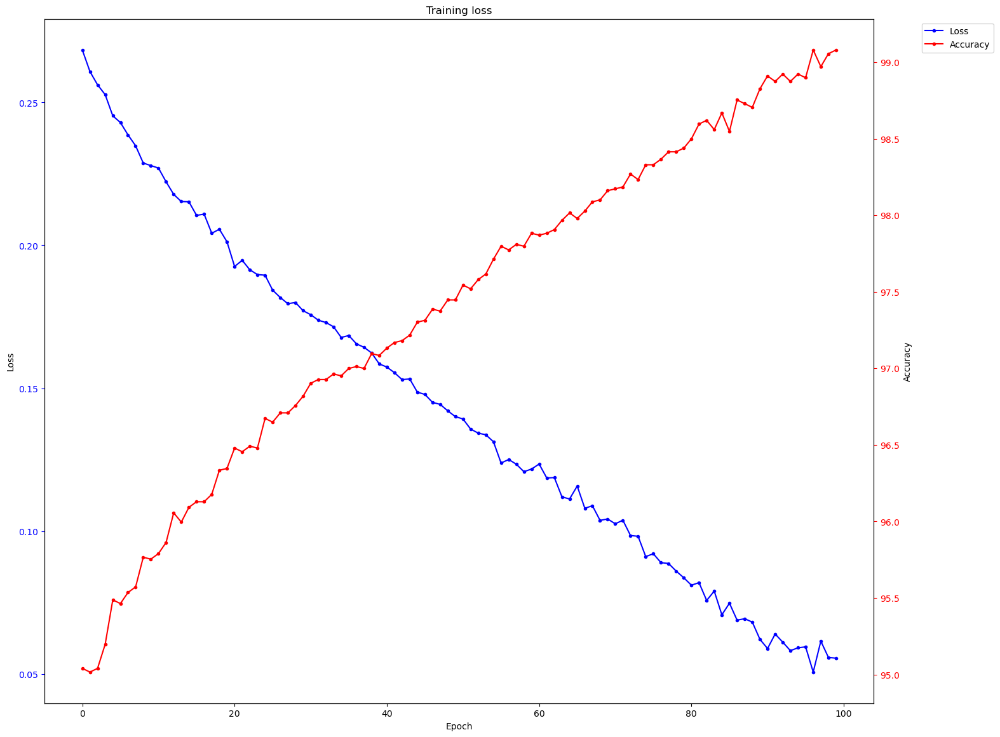

In [22]:
train_model(vision_transformer7, criterion, 100, optimizer, train_loader, batch_size = 1)

In [23]:
torch.save(vision_transformer7.state_dict(), 'custom_vit7_model.pth')

Accuracy on the test dataset: 82.4298160696999%
[[375  41   2  18   0   2]
 [ 46 342   2   2   1  14]
 [  1   1 271  36  31   6]
 [ 29   7  36 301   6   3]
 [  2   1  39   7 346   6]
 [  1  11   7   3   2  68]]


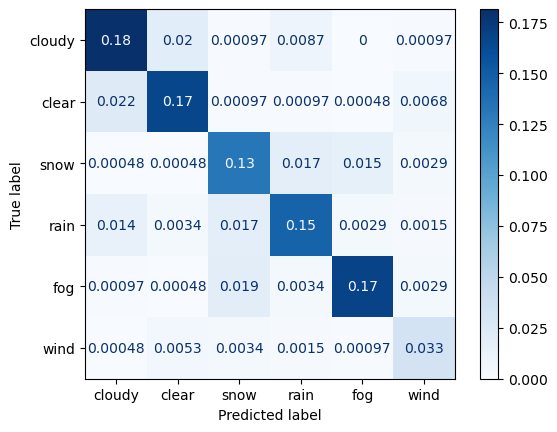

In [24]:
all_preds, all_labels = test_model(vision_transformer7, test_loader)
print_confusion_matrix(all_labels, all_preds)

## Comparison of results


Training done in all cases with Adagrad, using initial lr = 0.009. \
Dropout = 0.3 \
Loss function used - Cross Entropy.




| Modality                                      | Train Acc | Val Acc | Test Acc | Epochs | Num\_classes |
| -----------------------------                 | --------- | ------- | -------- | ------ | ------------ |
| RGB                                           | 93.85     | ~81     | 81.14    | 50     | 5            |
| LiDAR - PV + Compression                      | 97.21     | ~78     | 74.30    | 50     | 5            |
| LiDAR - PV + Enhancement                      | 87.84     | ~78     | 78.56    | 50     | 5            |
| LiDAR - FV + Compression                      | 89.43     | ~73     | 75.16    | 50     | 5            |
| LiDAR - FV + Compression (no pretraining)     | ~85       | ~71     | 71.6     | 50     | 5            |
| LiDAR - FV + Compression (with 2 channels)    | 92.49       | ~67     | 66.65     | 50     | 5            |
| LiDAR - FV + Enhancement                      | 85.41     | ~72     | 73.39    | 50     | 5            |
| LiDAR - FV + Enhancement + RGB                | 93.47     | ---     | 75.2     | 200    | 5            |
| LiDAR - FV + Compression + RGB                | 76.14     | ~70     | 69.39     | 50    | 5            |
| LiDAR - PV + Compression + RGB                | 87.74     | ~80      | 81.39     | 50    | 5            |
| LiDAR - PV + Enhancement + RGB                | 84.92     | ~72      | 71.51     | 100    | 5            |
